In [1]:
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from tqdm._tqdm_notebook import tqdm_notebook
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
pd.set_option("max_columns", 1000)

/kaggle/input/lish-moa/train_features.csv
/kaggle/input/lish-moa/test_features.csv
/kaggle/input/lish-moa/train_targets_nonscored.csv
/kaggle/input/lish-moa/sample_submission.csv
/kaggle/input/lish-moa/train_targets_scored.csv


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.*` instead of `tqdm._tqdm_notebook.*`
  


In [2]:
DIR = "/kaggle/input/lish-moa/"
train_feat = pd.read_csv(DIR+"train_features.csv")
test_feat = pd.read_csv(DIR+"test_features.csv")
train_nonscore = pd.read_csv(DIR+"train_targets_nonscored.csv")
train_score = pd.read_csv(DIR+"train_targets_scored.csv")
sub = pd.read_csv(DIR+"sample_submission.csv")

# overview

In [3]:
train_feat.shape

(23814, 876)

In [4]:
train_feat.head()

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-67

In [5]:
train_score.shape

(23814, 207)

In [6]:
train_score.head()

,sig_id,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhib

In [7]:
set(train_feat.sig_id.unique()) == set(train_score.sig_id.unique())

True

In [8]:
test_feat.shape

(3982, 876)

In [9]:
test_feat.head()

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-67

In [10]:
set(test_feat.columns) == set(train_feat.columns)

True

In [11]:
train_feat.describe()

,cp_time,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-679,g-680,g-681,g-682,g-6

In [12]:
test_feat.describe()

,cp_time,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-679,g-680,g-681,g-682,g-6

In [13]:
sub.head()

,sig_id,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhib

In [14]:
# missing values
print(train_feat.isnull().sum().sum())
print(test_feat.isnull().sum().sum())
print(train_score.isnull().sum().sum())
print(train_nonscore.isnull().sum().sum())

0
0
0
0


# cp variables

In [15]:
cp_feats = [i for i in train_feat.columns if "cp_" in i]
print(cp_feats)

['cp_type', 'cp_time', 'cp_dose']


In [16]:
# cp_type: indicates samples treated with a compound (cp_vehicle) or with a control perturbation (ctrl_vehicle); control perturbations have no MoAs
print(train_feat["cp_type"].value_counts())
print(train_feat["cp_type"].value_counts(normalize=True))
print("##########################")
print(test_feat["cp_type"].value_counts())
print(test_feat["cp_type"].value_counts(normalize=True))

trt_cp         21948
ctl_vehicle     1866
Name: cp_type, dtype: int64
trt_cp         0.921643
ctl_vehicle    0.078357
Name: cp_type, dtype: float64
##########################
trt_cp         3624
ctl_vehicle     358
Name: cp_type, dtype: int64
trt_cp         0.910095
ctl_vehicle    0.089905
Name: cp_type, dtype: float64


[24 72 48]
[24 72 48]


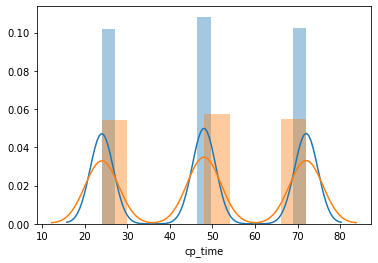

In [17]:
# cp_time: treatment duration
print(train_feat["cp_time"].unique())
print(test_feat["cp_time"].unique())
sns.distplot(train_feat["cp_time"])
sns.distplot(test_feat["cp_time"])

In [18]:
# cp_dose: dose (high or low)
print(train_feat["cp_dose"].value_counts())
print(train_feat["cp_dose"].value_counts(normalize=True))
print("#############")
print(test_feat["cp_dose"].value_counts())
print(test_feat["cp_dose"].value_counts(normalize=True))

D1    12147
D2    11667
Name: cp_dose, dtype: int64
D1    0.510078
D2    0.489922
Name: cp_dose, dtype: float64
#############
D1    2027
D2    1955
Name: cp_dose, dtype: int64
D1    0.509041
D2    0.490959
Name: cp_dose, dtype: float64


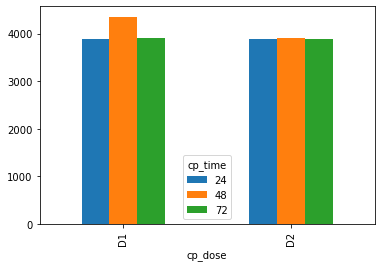

In [19]:
# interaction between cp variables 
pd.crosstab(train_feat["cp_dose"], train_feat["cp_time"]).plot(kind="bar")

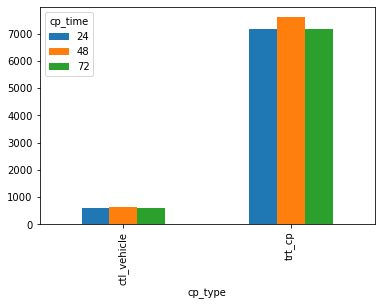

In [20]:
pd.crosstab(train_feat["cp_type"], train_feat["cp_time"]).plot(kind="bar")

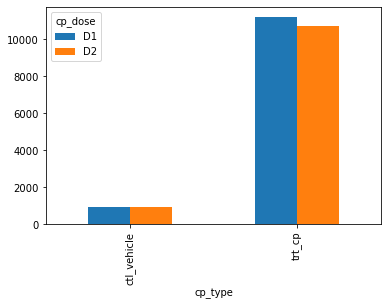

In [21]:
pd.crosstab(train_feat["cp_type"], train_feat["cp_dose"]).plot(kind="bar")

# g variables

In [22]:
# clear colleration in g variables
g_feats = [i for i in train_feat.columns if "g-" in i]
correlations = train_feat[g_feats].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'] != correlations['level_1']]
correlations.tail(10)

,level_0,level_1,0
595202,g-460,g-349,0.836859
595203,g-349,g-460,0.836859
595204,g-489,g-50,0.840404
595205,g-50,g-489,0.840404
595206,g-37,g-489,0.842525
595207,g-489,g-37,0.842525
595208,g-50,g-672,0.845668
595209,g-672,g-50,0.845668
595210,g-37,g-50,0.907061
595211,g-50,g-37,0.907061


In [23]:
correlations.head(10)

,level_0,level_1,0
0,g-44,g-179,1.997950e-09
1,g-179,g-44,1.997950e-09
2,g-267,g-751,5.663806e-07
3,g-751,g-267,5.663806e-07
4,g-604,g-295,7.024581e-07
5,g-295,g-604,7.024581e-07
6,g-151,g-463,7.287338e-07
7,g-463,g-151,7.287338e-07
8,g-621,g-475,2.264722e-06
9,g-475,g-621,2.264722e-06


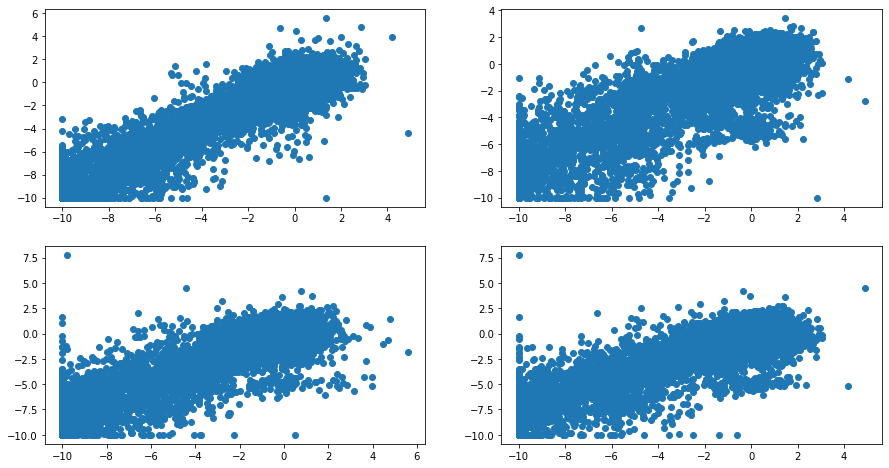

In [24]:
# some correlated examples
plt.figure(figsize=(15,8))
plt.subplot(2,2,1)
plt.scatter(train_feat["g-50"], train_feat["g-37"])
plt.subplot(2,2,2)
plt.scatter(train_feat["g-50"], train_feat["g-672"])
plt.subplot(2,2,3)
plt.scatter(train_feat["g-37"], train_feat["g-489"])
plt.subplot(2,2,4)
plt.scatter(train_feat["g-50"], train_feat["g-489"])

772
0.9041127904688231


<BarContainer object of 370 artists>

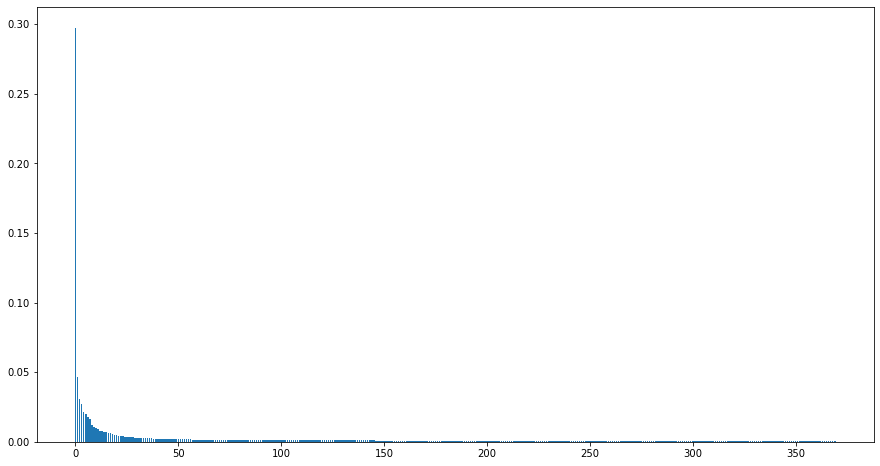

In [25]:
num = 370
print(len(g_feats))
pca = PCA(n_components=num)
pca.fit(train_feat[g_feats])
print(np.sum(np.array(pca.explained_variance_ratio_)))
plt.figure(figsize=(15,8))
plt.bar(range(num), np.array(pca.explained_variance_ratio_))

#mod_g_feats = pca.fit_transform(train_feat[g_feats])

#tsne = TSNE(random_state=0, metric="cosine")
#embs = tsne.fit_transform(mod_g_feats)
#plt.plot(embs[:,0], embs[:,1])

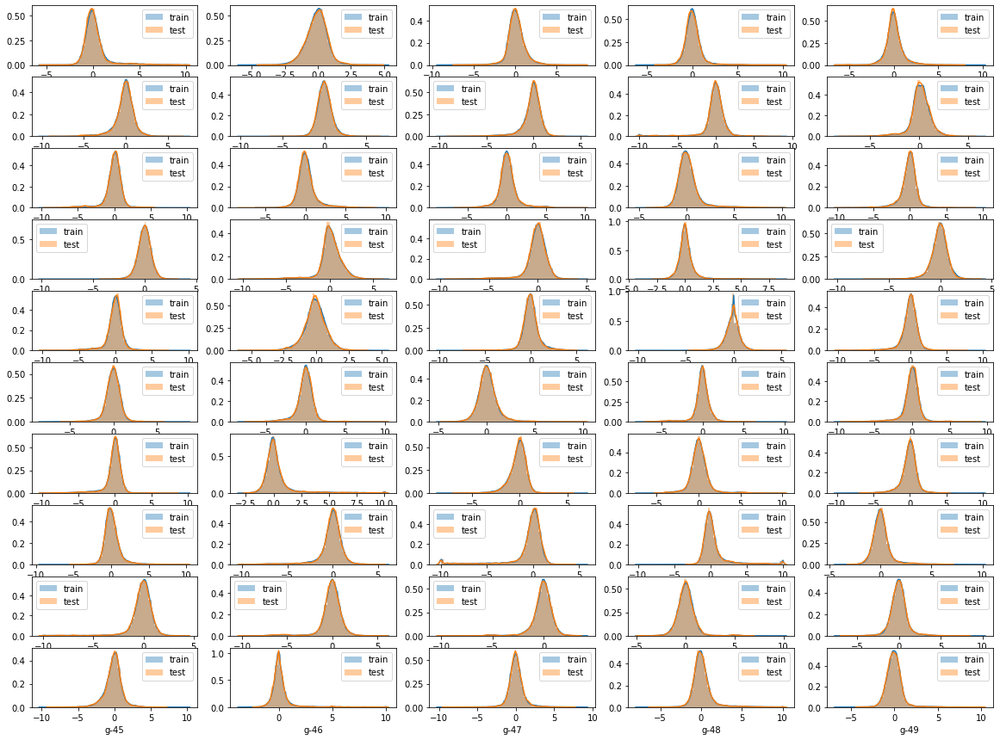

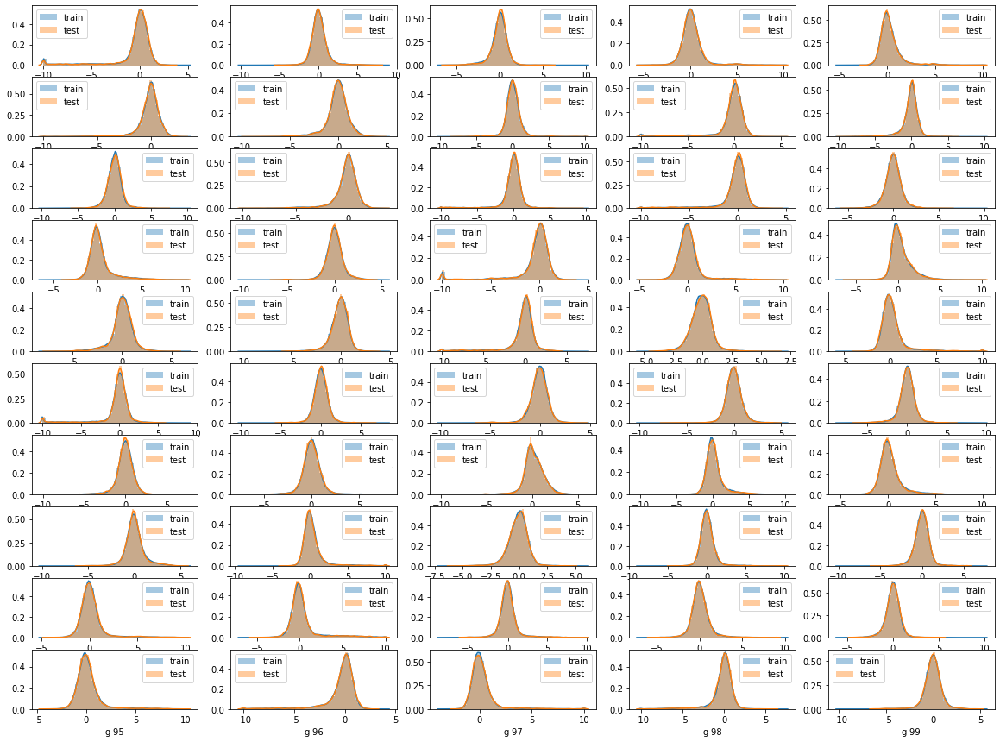

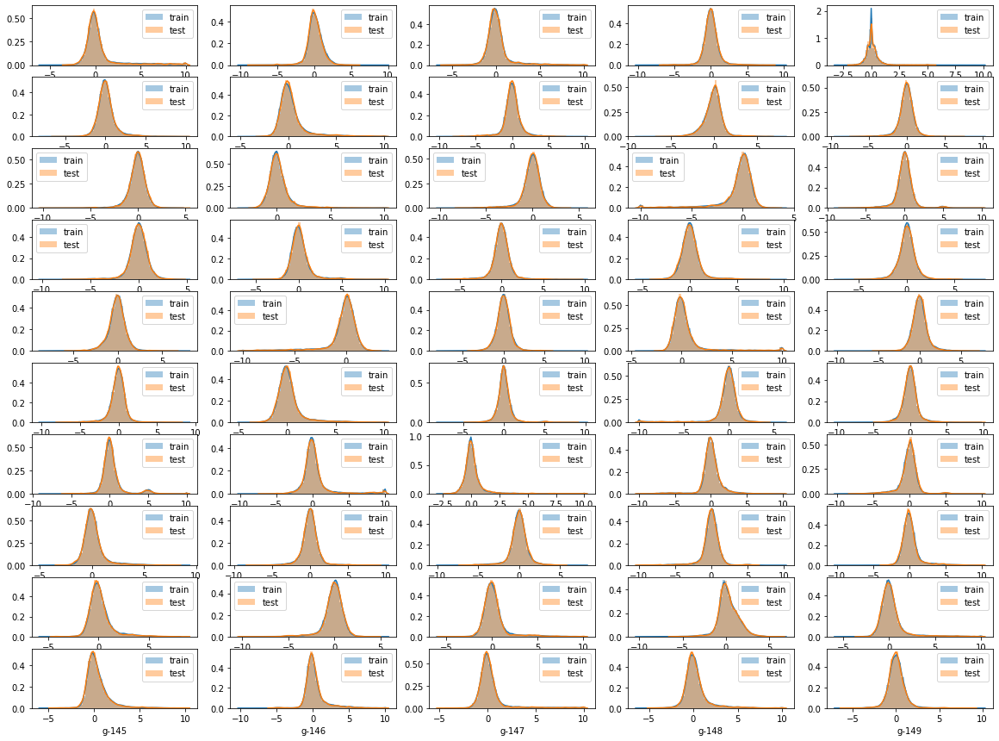

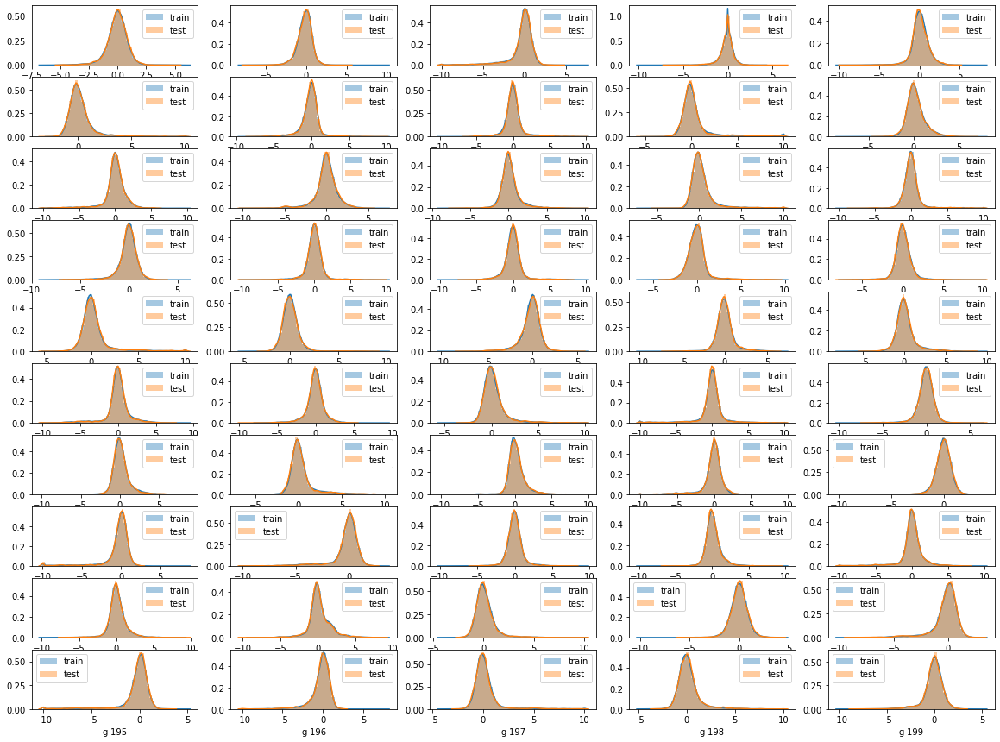

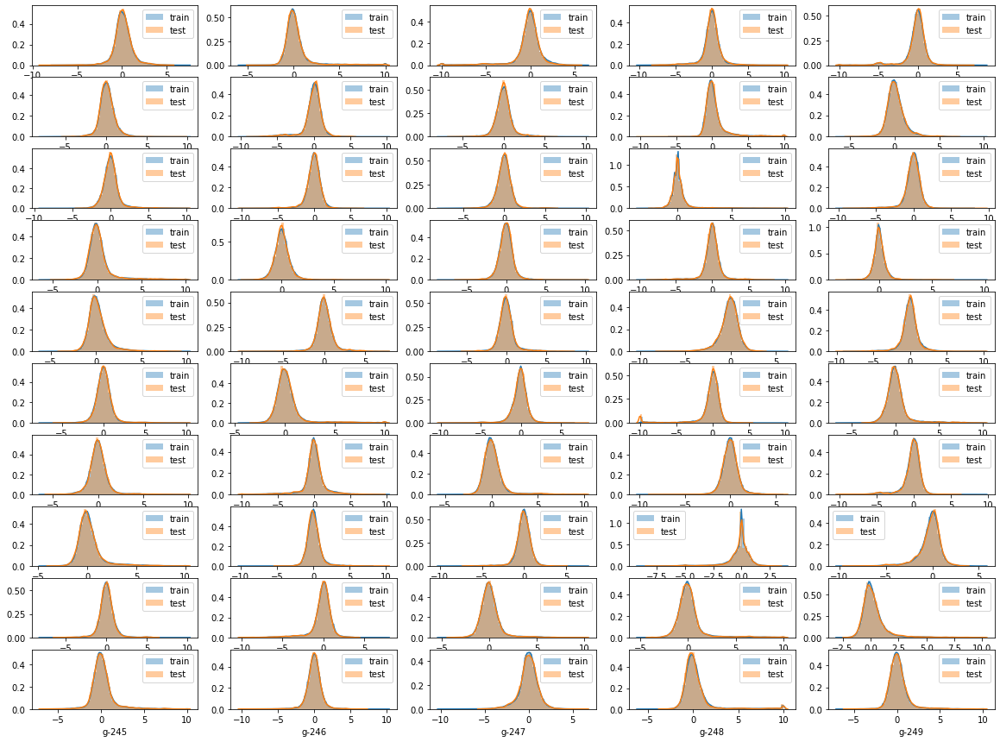

...

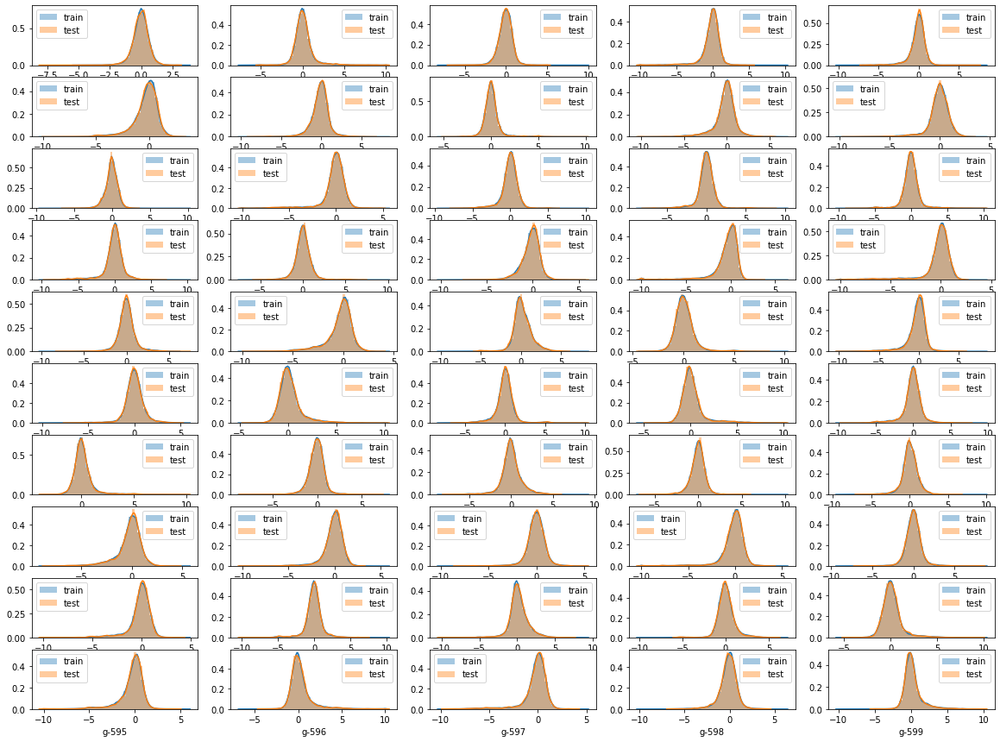

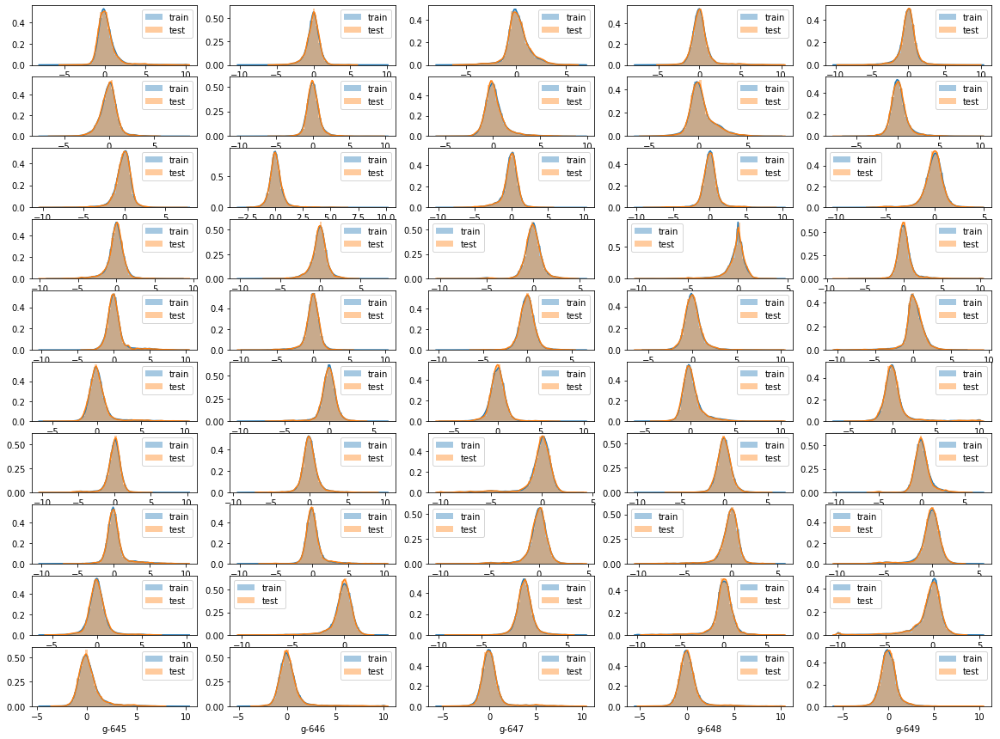

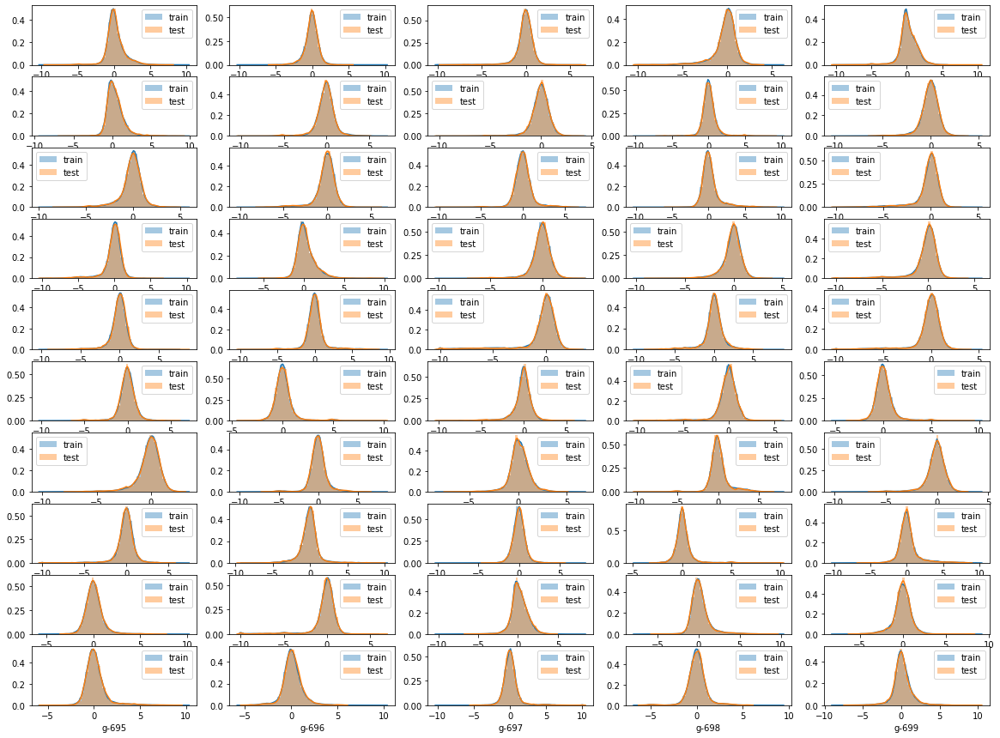

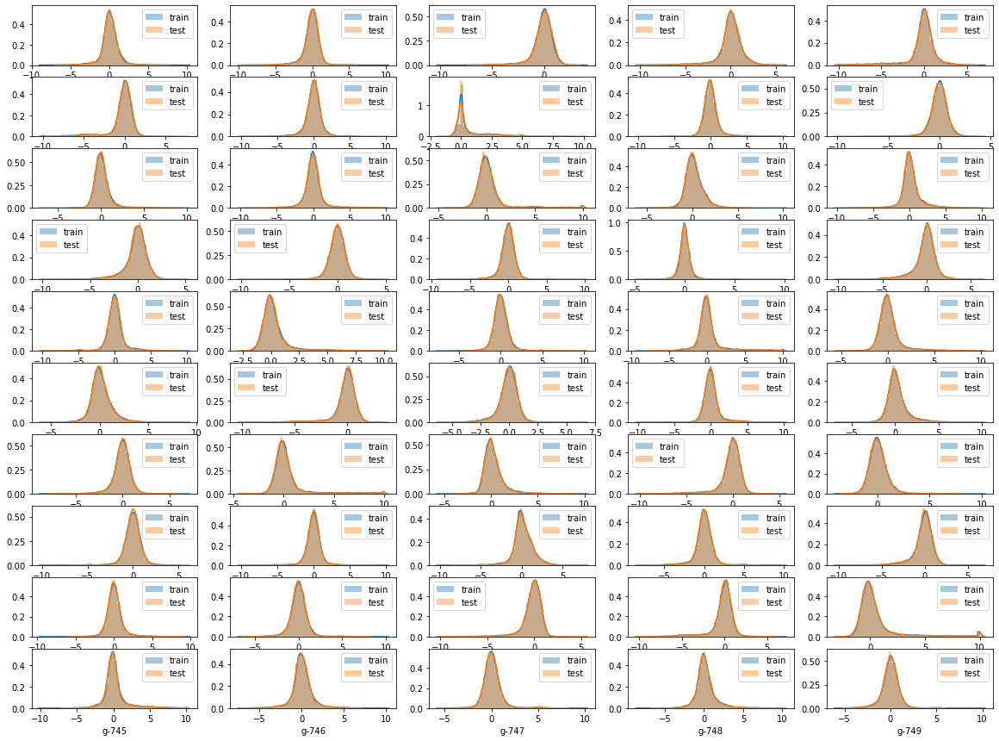

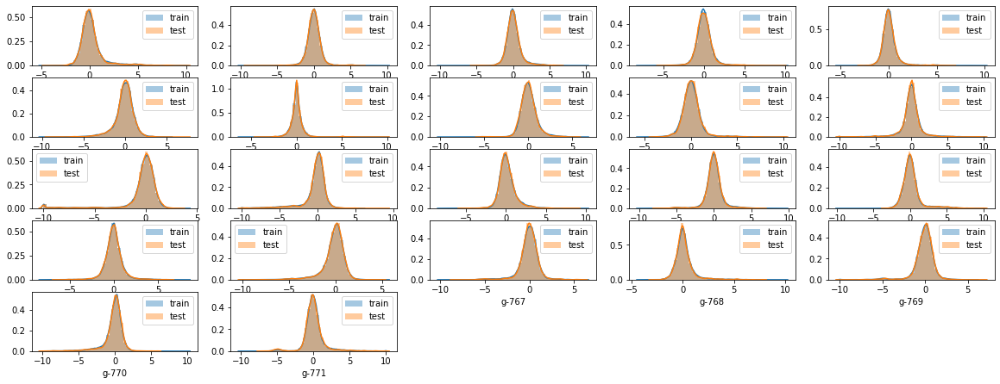

In [26]:
for k in range(len(g_feats)//50 + 1):
    plt.figure(figsize=(20,15))
    for i in range(50*k, 50*(k+1)):
        if i <= len(g_feats)-1:
            plt.subplot(10,5,i+1-50*k)
            sns.distplot(train_feat["g-"+str(i)], label = "train")
            sns.distplot(test_feat["g-"+str(i)], label = "test")
            plt.legend(loc="best")

## per row

Text(0.5, 1.0, 'test range distribution')

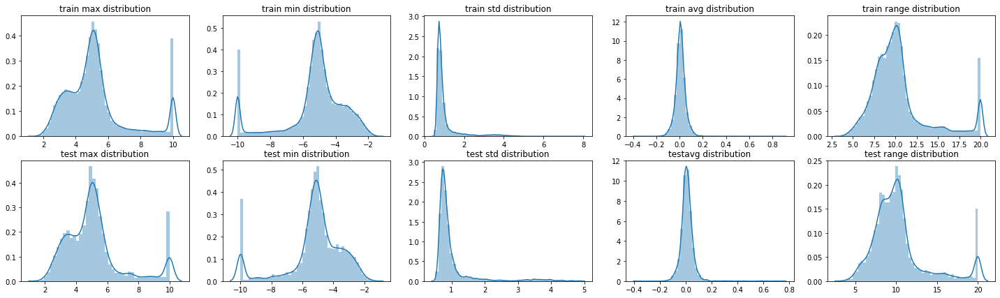

In [27]:
# there are many row with minimum value of -10 or maximum value of 10
plt.figure(figsize=(25,7))
plt.subplot(2,5,1)
sns.distplot(np.max(train_feat[g_feats], axis=1))
plt.title("train max distribution")
plt.subplot(2,5,2)
sns.distplot(np.min(train_feat[g_feats], axis=1))
plt.title("train min distribution")
plt.subplot(2,5,3)
sns.distplot(np.std(train_feat[g_feats], axis=1))
plt.title("train std distribution")
plt.subplot(2,5,4)
sns.distplot(np.mean(train_feat[g_feats], axis=1))
plt.title("train avg distribution")
plt.subplot(2,5,5)
sns.distplot(np.max(train_feat[g_feats], axis=1)-np.min(train_feat[g_feats], axis=1))
plt.title("train range distribution")

plt.subplot(2,5,6)
sns.distplot(np.max(test_feat[g_feats], axis=1))
plt.title("test max distribution")
plt.subplot(2,5,7)
sns.distplot(np.min(test_feat[g_feats], axis=1))
plt.title("test min distribution")
plt.subplot(2,5,8)
sns.distplot(np.std(test_feat[g_feats], axis=1))
plt.title("test std distribution")
plt.subplot(2,5,9)
sns.distplot(np.mean(test_feat[g_feats], axis=1))
plt.title("testavg distribution")
plt.subplot(2,5,10)
sns.distplot(np.max(test_feat[g_feats], axis=1)-np.min(test_feat[g_feats], axis=1))
plt.title("test range distribution")

/opt/conda/lib/python3.7/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel



train 768 392
test  766 690


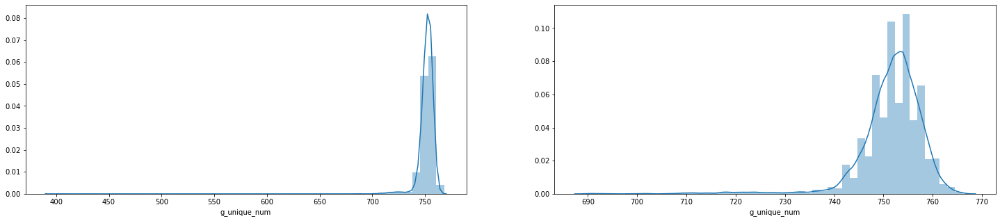

In [28]:
# unique value
def calc(row):
    return len(np.unique(row[g_feats].values))

tqdm_notebook.pandas(desc="progress")
train_feat["g_unique_num"] = train_feat.progress_apply(calc, axis=1)
test_feat["g_unique_num"] = test_feat.progress_apply(calc, axis=1)
print("train", np.max(train_feat["g_unique_num"]), np.min(train_feat["g_unique_num"]))
print("test ", np.max(test_feat["g_unique_num"]), np.min(test_feat["g_unique_num"]))
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
sns.distplot(train_feat["g_unique_num"])
plt.subplot(1,2,2)
sns.distplot(test_feat["g_unique_num"])

In [29]:
# unique value
def calc10(row):
    return sum(np.array(row[g_feats].values)==10)

def calc_10(row):
    return sum(np.array(row[g_feats].values)==-10)

tqdm_notebook.pandas(desc="progress")
train_feat["g10_num"] = train_feat.progress_apply(calc10, axis=1)
test_feat["g10_num"] = test_feat.progress_apply(calc10, axis=1)
print("train", np.max(train_feat["g10_num"]), np.min(train_feat["g10_num"]))
print("test ", np.max(test_feat["g10_num"]), np.min(test_feat["g10_num"]))

/opt/conda/lib/python3.7/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel



train 175 0
test  34 0


In [30]:
tqdm_notebook.pandas(desc="progress")
train_feat["g_10_num"] = train_feat.progress_apply(calc_10, axis=1)
test_feat["g_10_num"] = test_feat.progress_apply(calc_10, axis=1)
print("train", np.max(train_feat["g_10_num"]), np.min(train_feat["g_10_num"]))
print("test ", np.max(test_feat["g_10_num"]), np.min(test_feat["g_10_num"]))


train 204 0
test  30 0


In [31]:
# except an example with 392 unique values, others have at least 681
tmp = pd.DataFrame(train_feat["g_unique_num"].value_counts().reset_index(drop=False))
tmp.columns = ["g_unique_num", "no"]
np.transpose(tmp)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75
g_unique_num,754,753,752,751,755,756,750,749,757,748,758,747,759,746,745,760,744,761,743,762,742,741,740,763,739,738,764,736,726,737,735,765,722,733,728,724,723,734,715,717,732,719,729,720,718,727,725,731,730,766,721,714,708,712,716,709,710,711,713,707,706,703,768,699,705,702,704,767,690,691,392,681,700,701,687,688
no,2036,2020,1954,1801,1779,1733,1620,1446,1359,1157,1022,930,749,706,559,500,361,316,286,207,193,130,102,99,64,54,53,29,27,26,25,24,24,23,23,22,21,21,20,20,19,18,17,17,17,16,16,15,14,12,12,11,10,9,9,7,7,7,7,6,4,4,2,2,2,2,2,1,1,1,1,1,1,1,1,1


In [32]:
# this example has 2 positive labels
tmp = train_feat[train_feat["g_unique_num"]==392][g_feats].copy()
print(tmp.T[16674].value_counts(), tmp.index)
tmp

-10.000    204
 10.000    175
 4.824       2
 7.601       2
 6.688       2
          ... 
-4.173       1
-8.021       1
 3.605       1
 1.092       1
-1.628       1
Name: 16674, Length: 392, dtype: int64 Int64Index([16674], dtype='int64')


,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-679,g-680,g-681,g-682,g-683,g-684

In [33]:
tmp = train_feat[train_feat["g_unique_num"]==681][g_feats].copy()
print(tmp.T[22971].value_counts())
tmp

-10.0000    38
 10.0000    36
 0.6745      3
-4.3280      3
-3.5620      2
            ..
-1.9420      1
 2.3900      1
-1.6650      1
 1.6670      1
-1.4700      1
Name: 22971, Length: 681, dtype: int64


,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-679,g-680,g-681,g-682,g-683,g-684

# cp-variables vs g-variables

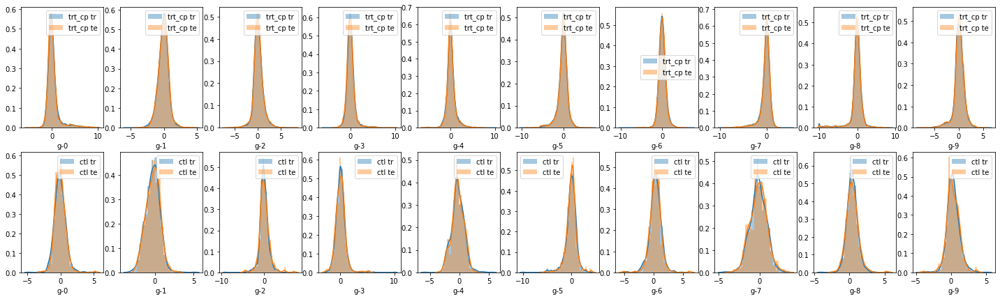

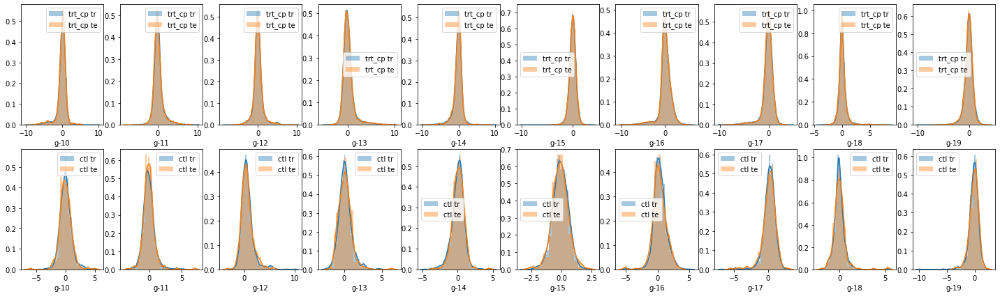

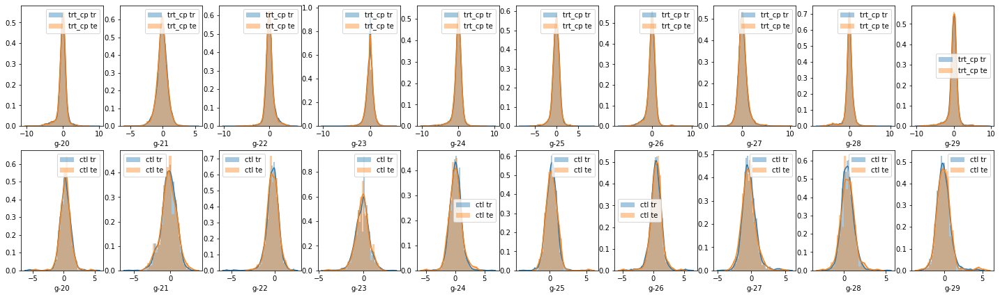

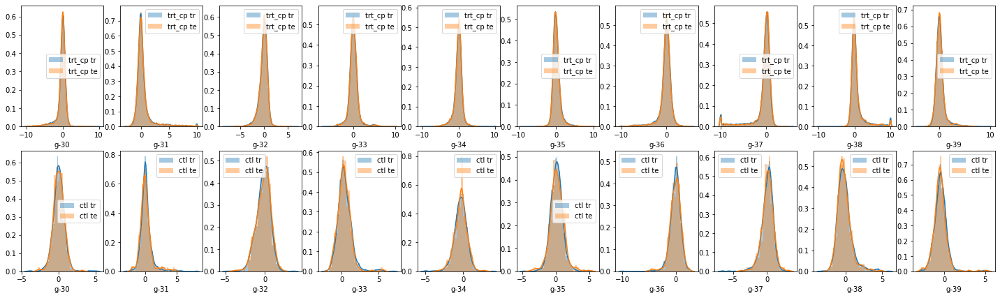

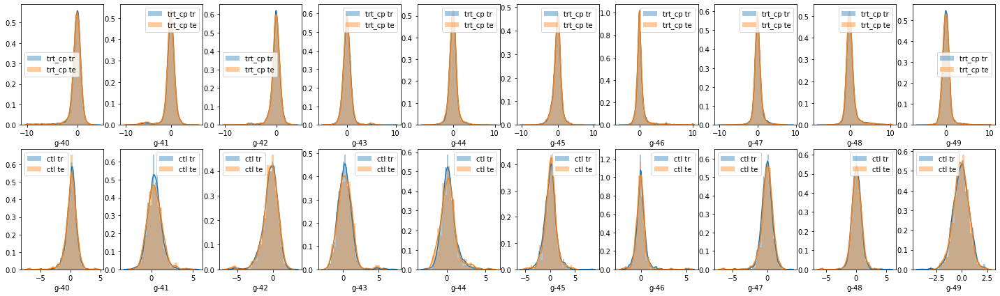

...

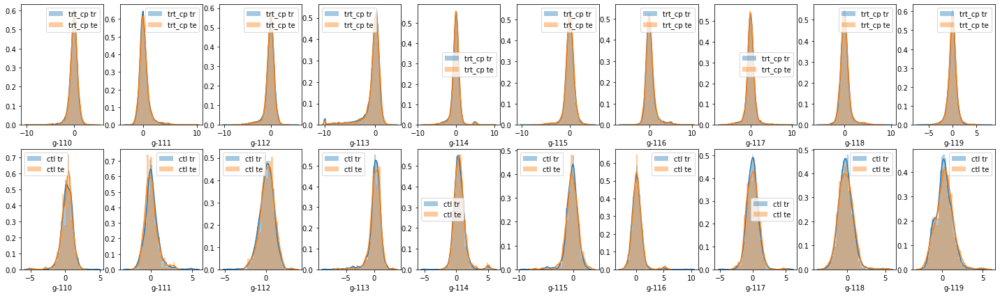

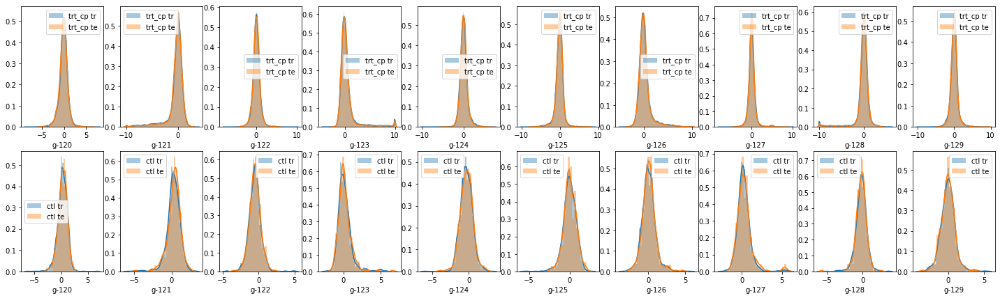

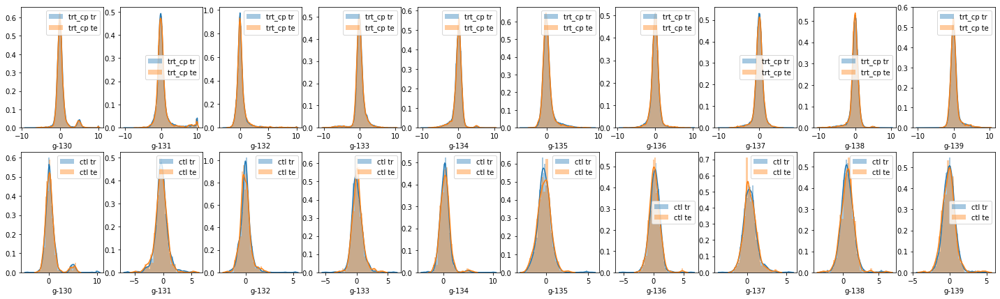

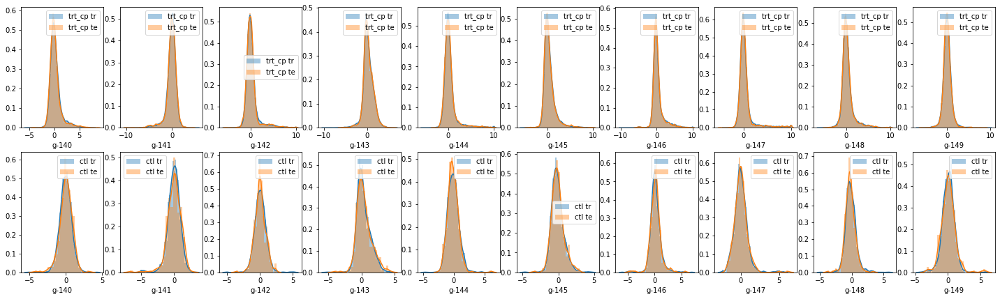

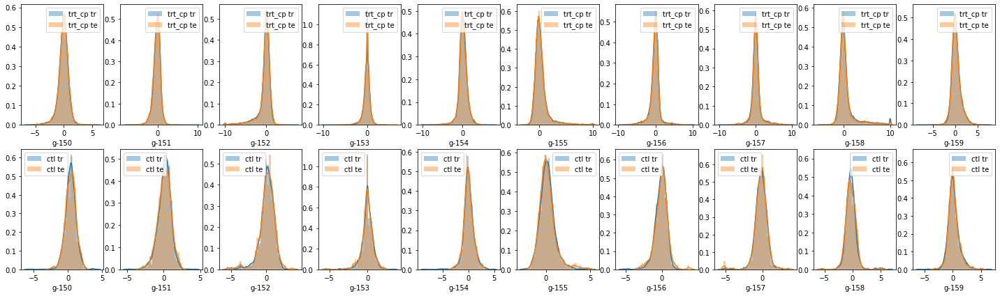

In [34]:
#"cp_type"
size = 10
for k in range(len(g_feats)//5//size + 1):
    plt.figure(figsize=(25,7))
    for ind, i in enumerate(range(size*k, size*(k+1))):
        if i <= len(g_feats)-1:
            plt.subplot(2,size,ind+1)
            sns.distplot(train_feat[train_feat.cp_type=='trt_cp']["g-"+str(i)], label = "trt_cp tr")
            sns.distplot(test_feat[test_feat.cp_type=='trt_cp']["g-"+str(i)], label = "trt_cp te")
            plt.legend(loc="best")
            plt.subplot(2,size,ind+1+size)
            sns.distplot(train_feat[train_feat.cp_type=='ctl_vehicle']["g-"+str(i)], label = "ctl tr")
            sns.distplot(test_feat[test_feat.cp_type=='ctl_vehicle']["g-"+str(i)], label = "ctl te")
            plt.legend(loc="best")

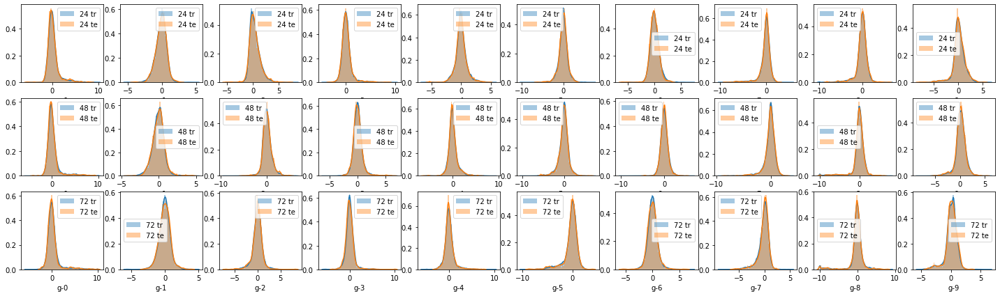

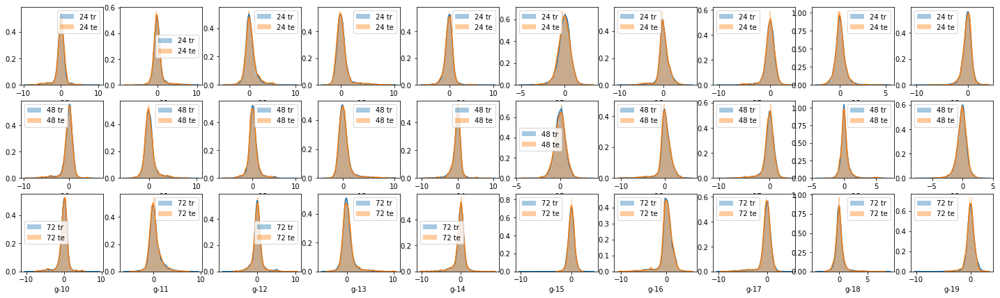

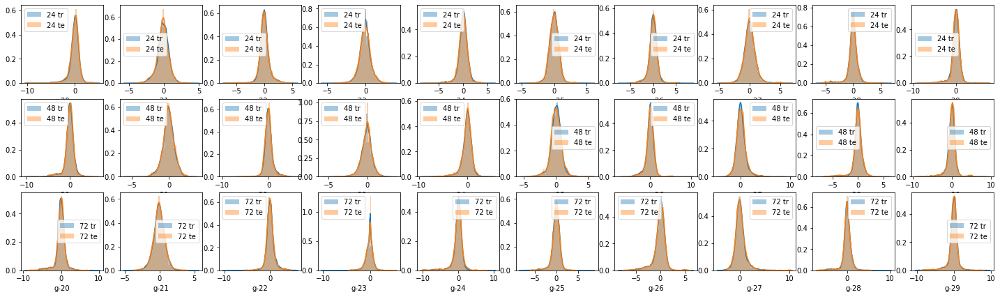

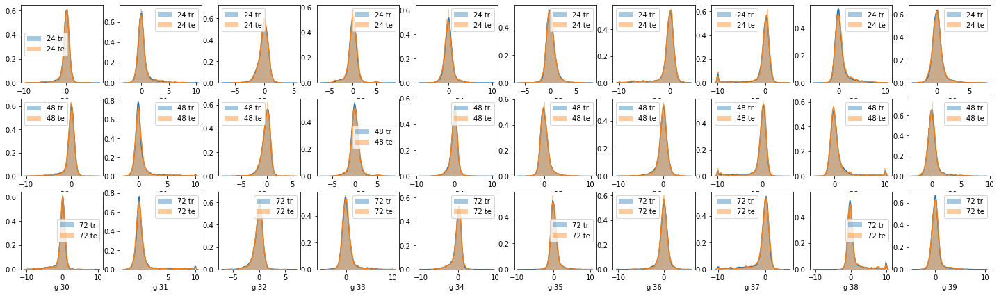

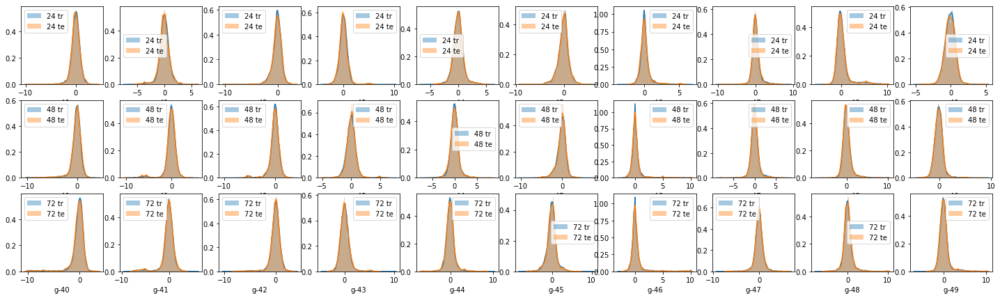

...

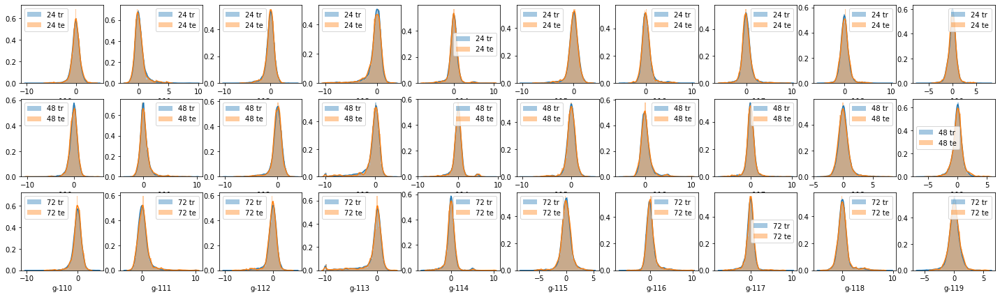

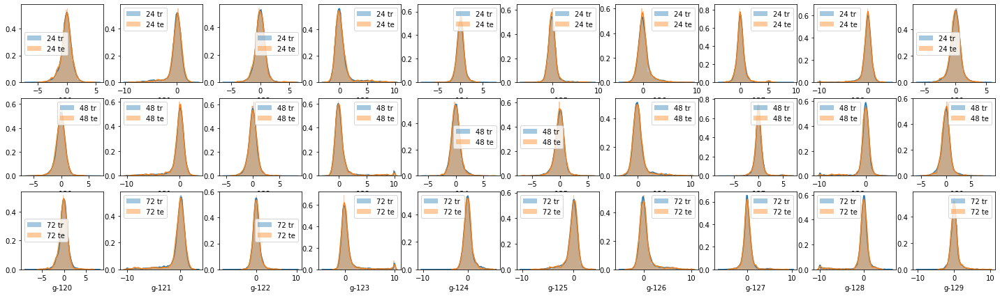

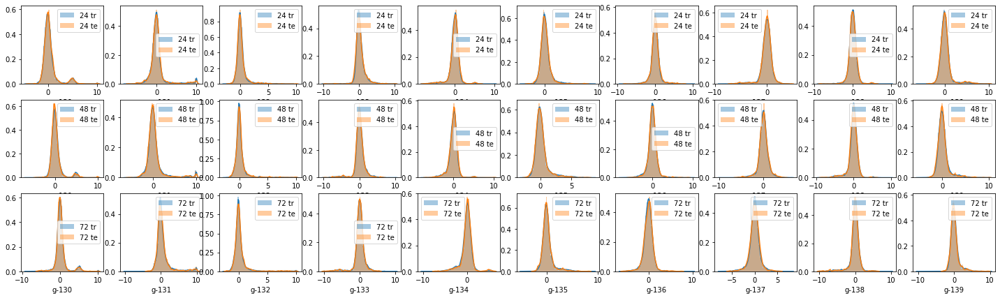

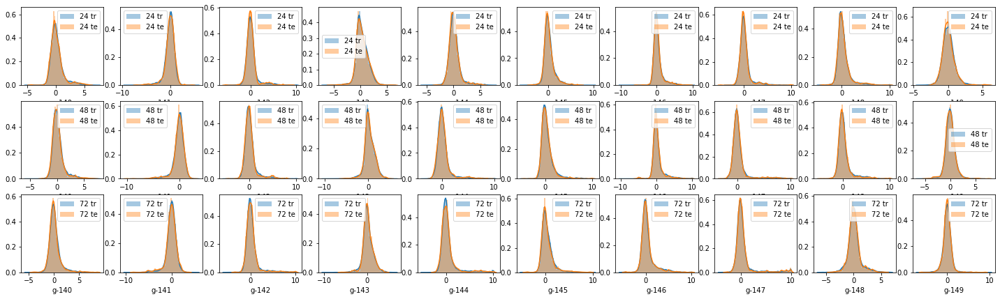

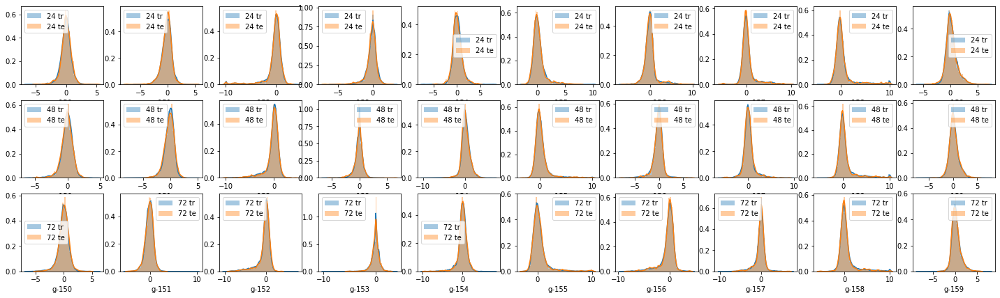

In [35]:
# "cp_time"
size = 10
for k in range(len(g_feats)//5//size + 1):
    plt.figure(figsize=(25,7))
    for ind, i in enumerate(range(size*k, size*(k+1))):
        if i <= len(g_feats)-1:
            plt.subplot(3,size,ind+1)
            sns.distplot(train_feat[train_feat.cp_time==24]["g-"+str(i)], label = "24 tr")
            sns.distplot(test_feat[test_feat.cp_time==24]["g-"+str(i)], label = "24 te")
            plt.legend(loc="best")
            plt.subplot(3,size,ind+1+size)
            sns.distplot(train_feat[train_feat.cp_time==48]["g-"+str(i)], label = "48 tr")
            sns.distplot(test_feat[test_feat.cp_time==48]["g-"+str(i)], label = "48 te")
            plt.legend(loc="best")
            plt.subplot(3,size,ind+1+2*size)
            sns.distplot(train_feat[train_feat.cp_time==72]["g-"+str(i)], label = "72 tr")
            sns.distplot(test_feat[test_feat.cp_time==72]["g-"+str(i)], label = "72 te")
            plt.legend(loc="best")

In [36]:
# "cp_dose"
size = 10
for k in range(len(c_feats)//5//size + 1):
    plt.figure(figsize=(25,7))
    for ind, i in enumerate(range(size*k, size*(k+1))):
        if i <= len(c_feats)-1:
            plt.subplot(2,size,ind+1)
            sns.distplot(train_feat[train_feat.cp_dose=="D1"]["c-"+str(i)], label = "d1 tr")
            sns.distplot(test_feat[test_feat.cp_dose=="D1"]["c-"+str(i)], label = "d1 te")
            plt.legend(loc="best")
            plt.subplot(2,size,ind+11)
            sns.distplot(train_feat[train_feat.cp_dose=="D2"]["c-"+str(i)], label = "d2 tr")
            sns.distplot(test_feat[test_feat.cp_dose=="D2"]["c-"+str(i)], label = "d2 te")
            plt.legend(loc="best")

NameError: name 'c_feats' is not defined

# c variables

In [37]:
# clear correlations in c variables
c_feats = [i for i in train_feat.columns if "c-" in i]
correlations = train_feat[c_feats].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'] != correlations['level_1']]
correlations.tail(10)

,level_0,level_1,0
9890,c-11,c-55,0.914637
9891,c-55,c-11,0.914637
9892,c-6,c-33,0.914730
9893,c-33,c-6,0.914730
9894,c-13,c-26,0.921875
9895,c-26,c-13,0.921875
9896,c-73,c-13,0.923344
9897,c-13,c-73,0.923344
9898,c-52,c-42,0.924619
9899,c-42,c-52,0.924619


In [38]:
correlations.head(10)

,level_0,level_1,0
0,c-22,c-16,0.612084
1,c-16,c-22,0.612084
2,c-58,c-74,0.649353
3,c-74,c-58,0.649353
4,c-37,c-22,0.649890
5,c-22,c-37,0.649890
6,c-22,c-74,0.658046
7,c-74,c-22,0.658046
8,c-74,c-37,0.658788
9,c-37,c-74,0.658788


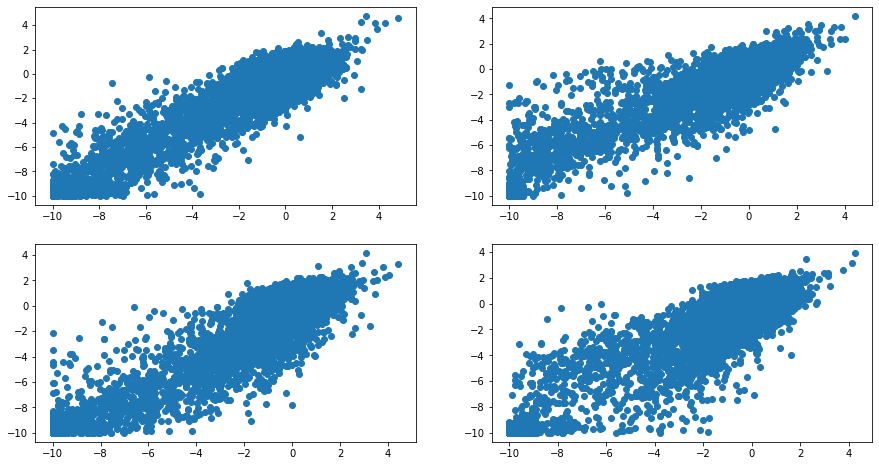

In [39]:
# some correlated examples
plt.figure(figsize=(15,8))
plt.subplot(2,2,1)
plt.scatter(train_feat["c-52"], train_feat["c-42"])
plt.subplot(2,2,2)
plt.scatter(train_feat["c-13"], train_feat["c-73"])
plt.subplot(2,2,3)
plt.scatter(train_feat["c-13"], train_feat["c-26"])
plt.subplot(2,2,4)
plt.scatter(train_feat["c-33"], train_feat["c-6"])

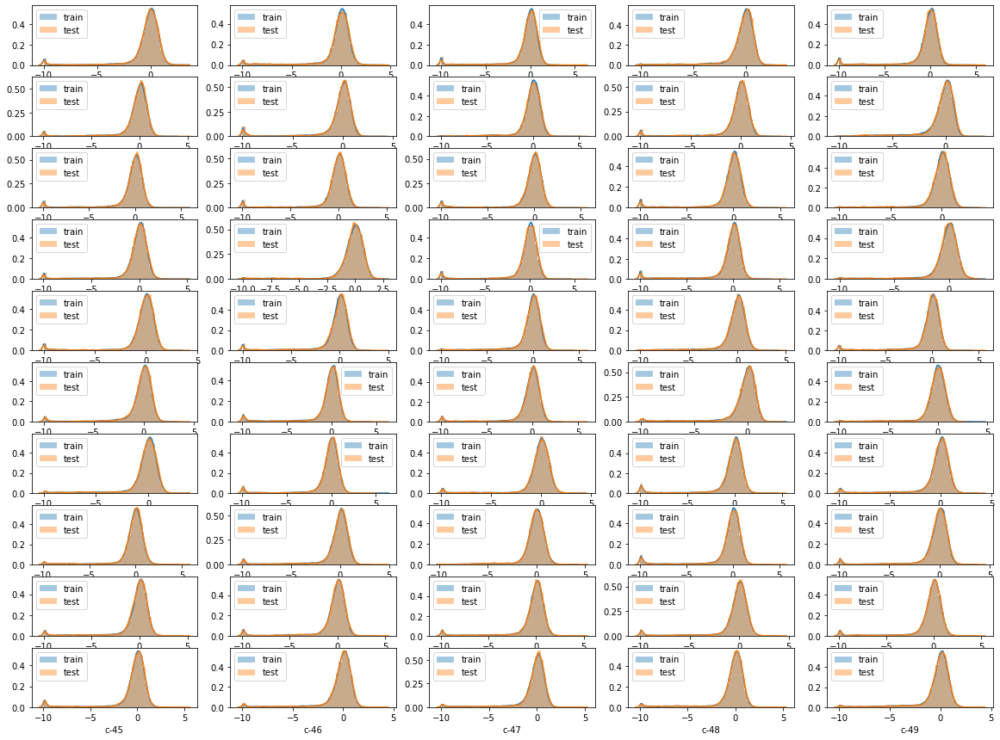

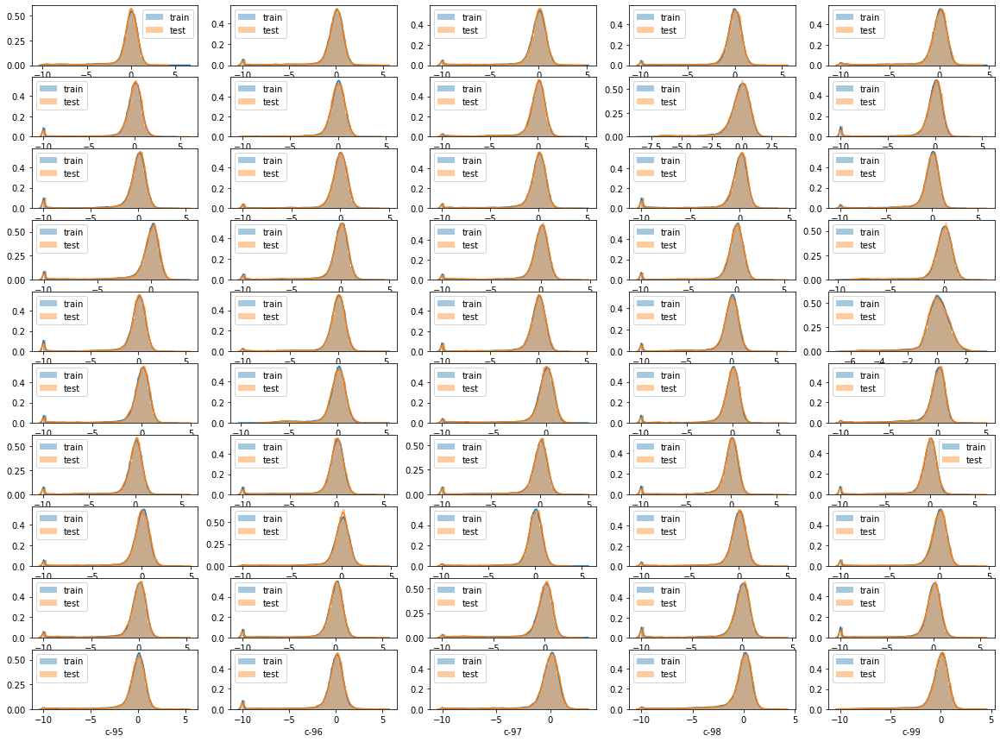

<Figure size 1440x1080 with 0 Axes>

In [40]:
for k in range(len(c_feats)//50 + 1):
    plt.figure(figsize=(20,15))
    for i in range(50*k, 50*(k+1)):
        if i <= len(c_feats)-1:
            plt.subplot(10,5,i+1-50*k)
            sns.distplot(train_feat["c-"+str(i)], label = "train")
            sns.distplot(test_feat["c-"+str(i)], label = "test")
            plt.legend(loc="best")

100
0.8947322608416964


<BarContainer object of 10 artists>

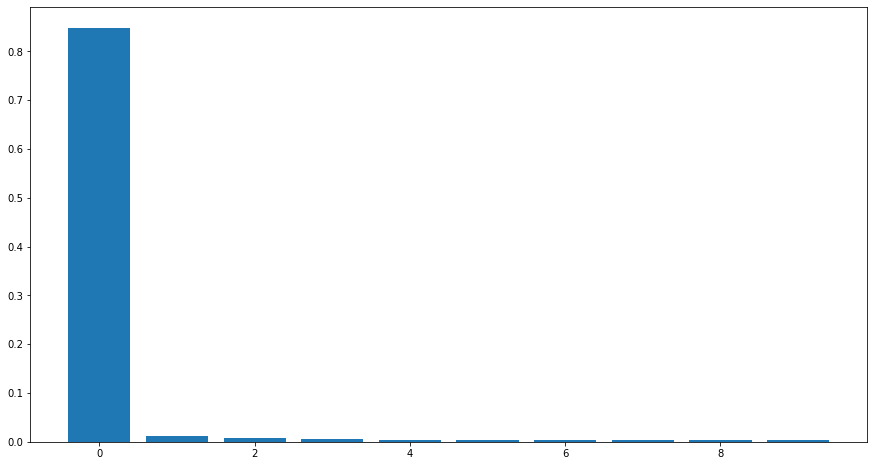

In [41]:
# TSNE
num = 10
print(len(c_feats))
pca = PCA(n_components=num)
pca.fit(train_feat[c_feats])
print(np.sum(np.array(pca.explained_variance_ratio_)))
plt.figure(figsize=(15,8))
plt.bar(range(num), np.array(pca.explained_variance_ratio_))

#mod_c_feats = pca.fit_transform(train_feat[c_feats])

#tsne = TSNE(random_state=0, metric="cosine")
#embs = tsne.fit_transform(mod_c_feats)
#plt.plot(embs[:,0], embs[:,1])

## per row

Text(0.5, 1.0, 'test range distribution')

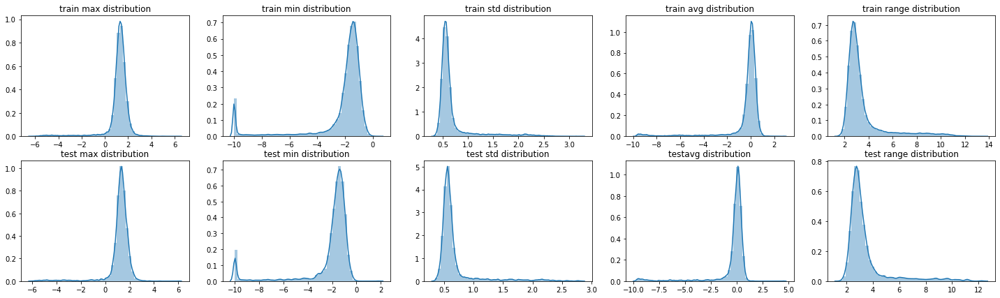

In [42]:
# there are many row with minimum value of -10 or maximum value of 10
plt.figure(figsize=(25,7))
plt.subplot(2,5,1)
sns.distplot(np.max(train_feat[c_feats], axis=1))
plt.title("train max distribution")
plt.subplot(2,5,2)
sns.distplot(np.min(train_feat[c_feats], axis=1))
plt.title("train min distribution")
plt.subplot(2,5,3)
sns.distplot(np.std(train_feat[c_feats], axis=1))
plt.title("train std distribution")
plt.subplot(2,5,4)
sns.distplot(np.mean(train_feat[c_feats], axis=1))
plt.title("train avg distribution")
plt.subplot(2,5,5)
sns.distplot(np.max(train_feat[c_feats], axis=1)-np.min(train_feat[c_feats], axis=1))
plt.title("train range distribution")

plt.subplot(2,5,6)
sns.distplot(np.max(test_feat[c_feats], axis=1))
plt.title("test max distribution")
plt.subplot(2,5,7)
sns.distplot(np.min(test_feat[c_feats], axis=1))
plt.title("test min distribution")
plt.subplot(2,5,8)
sns.distplot(np.std(test_feat[c_feats], axis=1))
plt.title("test std distribution")
plt.subplot(2,5,9)
sns.distplot(np.mean(test_feat[c_feats], axis=1))
plt.title("testavg distribution")
plt.subplot(2,5,10)
sns.distplot(np.max(test_feat[c_feats], axis=1)-np.min(test_feat[c_feats], axis=1))
plt.title("test range distribution")

/opt/conda/lib/python3.7/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel



train 100 8
test  100 14


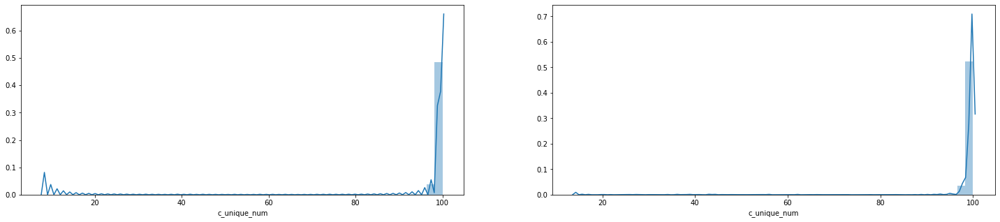

In [43]:
# unique value
def calc(row):
    return len(np.unique(row[c_feats].values))

tqdm_notebook.pandas(desc="progress")
train_feat["c_unique_num"] = train_feat.progress_apply(calc, axis=1)
test_feat["c_unique_num"] = test_feat.progress_apply(calc, axis=1)

print("train", np.max(train_feat["c_unique_num"]), np.min(train_feat["c_unique_num"]))
print("test ", np.max(test_feat["c_unique_num"]), np.min(test_feat["c_unique_num"]))

plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
sns.distplot(train_feat["c_unique_num"])
plt.subplot(1,2,2)
sns.distplot(test_feat["c_unique_num"])

In [44]:
tmp = pd.DataFrame(train_feat["c_unique_num"].value_counts().reset_index(drop=False))
tmp.columns = ["c_unique_num", "no"]
np.transpose(tmp)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92
c_unique_num,100,99,98,97,96,95,94,91,92,93,87,46,32,34,45,50,39,86,38,90,54,42,37,49,52,28,44,89,88,31,25,41,35,84,48,73,27,47,26,58,85,40,33,64,51,24,30,72,21,71,61,59,57,74,78,66,43,20,19,60,53,79,83,70,29,65,82,62,36,63,69,56,81,77,55,23,68,22,76,75,13,18,80,11,15,12,67,17,14,8,10,9,16
no,15452,5782,1413,266,100,53,35,21,21,18,16,15,15,14,14,14,14,14,14,14,13,13,13,12,12,12,12,11,11,11,11,11,11,10,10,10,10,10,10,10,10,10,10,9,9,9,9,9,8,8,8,8,8,8,7,7,7,7,7,7,7,6,6,6,6,6,5,5,5,5,5,4,4,4,4,4,4,4,4,3,3,3,3,3,2,2,2,1,1,1,1,1,1


In [45]:
tmp = train_feat[train_feat["c_unique_num"]==8][c_feats].copy()
print(tmp.T[1021].value_counts())
tmp

-10.000    69
-9.803     25
-8.583      1
-7.314      1
-9.839      1
-5.585      1
-9.038      1
-5.934      1
Name: 1021, dtype: int64


,c-0,c-1,c-2,c-3,c-4,c-5,c-6,c-7,c-8,c-9,c-10,c-11,c-12,c-13,c-14,c-15,c-16,c-17,c-18,c-19,c-20,c-21,c-22,c-23,c-24,c-25,c-26,c-27,c-28,c-29,c-30,c-31,c-32,c-33,c-34,c-35,c-36,c-37,c-38,c-39,c-40,c-41,c-42,c-43,c-44,c-45,c-46,c-47,c-48,c-49,c-50,c-51,c-52,c-53,c-54,c-55,c-56,c-57,c-58,c-59,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
1021,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-8.583,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.038,-10.0,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-9.803,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-7.314,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.839,-10.0,-10.0,-10.0,-10.0,-5.934,-10.0,-5.585,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0


In [46]:
train_feat[train_feat["c_unique_num"]==11][c_feats]

,c-0,c-1,c-2,c-3,c-4,c-5,c-6,c-7,c-8,c-9,c-10,c-11,c-12,c-13,c-14,c-15,c-16,c-17,c-18,c-19,c-20,c-21,c-22,c-23,c-24,c-25,c-26,c-27,c-28,c-29,c-30,c-31,c-32,c-33,c-34,c-35,c-36,c-37,c-38,c-39,c-40,c-41,c-42,c-43,c-44,c-45,c-46,c-47,c-48,c-49,c-50,c-51,c-52,c-53,c-54,c-55,c-56,c-57,c-58,c-59,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
10399,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-7.840,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.487,-9.966,-9.966,-9.966,-9.966,-9.966,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-10.000,-10.0,-10.0,-10.0,-10.0,-10.0,-9.800,-10.0,-7.675,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.482,-10.0,-10.0,-10.0,-10.0,-5.815,-10.0,-5.600,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-10.0,-10.0,-9.987
16234,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-8.603,-9.936,-9.936,-9.936,-9.936,-9.723,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.126,-9.936,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-10.000,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-7.073,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.502,-10.0,-10.0,-10.0,-10.0,-5.993,-10.0,-5.654,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-10.0,-10.0,-9.668
20508,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-7.982,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-10.0,-10.0,-10.0,-10.0,-10.0,-9.802,-10.0,-7.088,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.472,-10.0,-10.0,-10.0,-10.0,-5.729,-10.0,-5.271,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.757,-10.0,-10.0,-10.0,-9.538


In [47]:
train_feat[train_feat["c_unique_num"]==12][c_feats]

,c-0,c-1,c-2,c-3,c-4,c-5,c-6,c-7,c-8,c-9,c-10,c-11,c-12,c-13,c-14,c-15,c-16,c-17,c-18,c-19,c-20,c-21,c-22,c-23,c-24,c-25,c-26,c-27,c-28,c-29,c-30,c-31,c-32,c-33,c-34,c-35,c-36,c-37,c-38,c-39,c-40,c-41,c-42,c-43,c-44,c-45,c-46,c-47,c-48,c-49,c-50,c-51,c-52,c-53,c-54,c-55,c-56,c-57,c-58,c-59,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
5860,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-9.472,-10.000,-6.488,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-9.203,-8.796,-10.000,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-9.821,-10.000,-10.0,-10.0,-10.0,-10.0,-10.0,-9.765,-10.0,-7.431,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.154,-10.0,-10.0,-10.0,-10.0,-5.805,-9.894,-5.500,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894,-9.894
9696,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-8.335,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.943,-9.635,-9.943,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-7.633,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.926,-9.994,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-7.124,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.522,-10.0,-10.0,-10.0,-10.0,-5.710,-10.000,-5.393,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-9.693


In [48]:
train_feat[train_feat["c_unique_num"]==20][c_feats]

,c-0,c-1,c-2,c-3,c-4,c-5,c-6,c-7,c-8,c-9,c-10,c-11,c-12,c-13,c-14,c-15,c-16,c-17,c-18,c-19,c-20,c-21,c-22,c-23,c-24,c-25,c-26,c-27,c-28,c-29,c-30,c-31,c-32,c-33,c-34,c-35,c-36,c-37,c-38,c-39,c-40,c-41,c-42,c-43,c-44,c-45,c-46,c-47,c-48,c-49,c-50,c-51,c-52,c-53,c-54,c-55,c-56,c-57,c-58,c-59,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
2699,-9.974,-9.974,-9.974,-9.603,-9.974,-9.974,-9.974,-6.110,-9.974,-7.971,-9.974,-9.974,-9.974,-9.974,-9.974,-9.974,-9.168,-9.974,-9.974,-9.115,-9.974,-9.974,-9.974,-8.309,-9.974,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-7.681,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.825,-9.765,-10.0,-10.0,-10.000,-10.0,-10.0,-8.876,-10.000,-6.758,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-10.0,-10.0,-10.0,-8.417,-10.0,-9.952,-10.0,-10.0,-5.642,-9.977,-5.385,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-9.650,-9.977,-9.977,-9.977,-9.977,-9.977,-9.977,-7.505
7742,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-8.319,-10.000,-6.068,-10.000,-10.000,-10.000,-10.000,-7.869,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-7.867,-8.320,-10.000,-9.892,-9.892,-9.892,-9.892,-9.865,-9.892,-9.892,-9.892,-9.892,-9.892,-9.892,-9.892,-5.279,-9.892,-9.892,-9.892,-9.892,-9.892,-9.892,-9.892,-9.892,-9.892,-9.892,-9.892,-9.892,-9.827,-10.0,-10.0,-10.000,-10.0,-10.0,-7.670,-10.000,-6.746,-10.0,-10.0,-10.0,-10.0,-10.0,-9.823,-10.0,-10.0,-10.0,-10.0,-7.832,-10.0,-10.000,-10.0,-10.0,-5.393,-10.000,-5.586,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-8.722,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-8.962,-10.000,-9.078,-10.000,-7.777
8567,-10.000,-10.000,-10.000,-9.338,-10.000,-10.000,-10.000,-7.498,-10.000,-9.272,-10.000,-10.000,-10.000,-10.000,-9.554,-10.000,-9.515,-10.000,-10.000,-10.000,-10.000,-10.000,-9.020,-7.392,-10.000,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-6.059,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-9.730,-10.000,-10.0,-10.0,-10.000,-10.0,-10.0,-9.905,-9.578,-6.651,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-10.0,-10.0,-10.0,-8.872,-10.0,-10.000,-10.0,-10.0,-5.237,-10.000,-6.068,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-9.681,-8.967,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-8.653,-10.000,-8.004
12754,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-8.463,-10.000,-6.196,-10.000,-10.000,-10.000,-10.000,-9.626,-10.000,-8.831,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-7.802,-10.000,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-8.370,-9.863,-8.589,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.863,-9.534,-10.0,-10.0,-10.000,-10.0,-10.0,-9.826,-10.000,-6.607,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-10.0,-10.0,-10.0,-8.407,-10.0,-10.000,-10.0,-10.0,-5.314,-9.992,-5.026,-9.992,-9.992,-9.713,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-9.135,-9.992,-9.591,-9.992,-9.058
19766,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-6.455,-10.000,-6.415,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-9.982,-10.000,-10.000,-10.000,-10.000,-10.000,-8.244,-10.000,-10.000,-9.873,-9.873,-9.873,-9.873,-8.069,-9.873,-9.873,-9.873,-9.873,-9.873,-9.873,-9.873,-7.927,-9.873,-9.873,-9.873,-9.873,-9.873,-9.873,-9.873,-9.873,-9.873,-9.873,-9.775,-9.873,-9.647,-10.0,-10.0,-9.832,-10.0,-10.0,-7.706,-10.000,-6.631,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-10.0,-10.0,-10.0,-8.710,-10.0,-10.000,-10.0,-10.0,-5.309,-10.000,-6.541,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-7.787

In [49]:
train_feat[train_feat["c_unique_num"]==36][c_feats]

,c-0,c-1,c-2,c-3,c-4,c-5,c-6,c-7,c-8,c-9,c-10,c-11,c-12,c-13,c-14,c-15,c-16,c-17,c-18,c-19,c-20,c-21,c-22,c-23,c-24,c-25,c-26,c-27,c-28,c-29,c-30,c-31,c-32,c-33,c-34,c-35,c-36,c-37,c-38,c-39,c-40,c-41,c-42,c-43,c-44,c-45,c-46,c-47,c-48,c-49,c-50,c-51,c-52,c-53,c-54,c-55,c-56,c-57,c-58,c-59,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
2658,-10.000,-10.000,-10.000,-7.102,-10.000,-9.670,-10.000,-7.258,-10.000,-9.765,-10.000,-10.000,-10.000,-10.000,-9.820,-8.229,-7.646,-10.000,-10.000,-8.903,-10.000,-10.000,-6.461,-8.264,-10.000,-9.888,-9.888,-9.888,-9.272,-7.360,-9.888,-9.888,-9.888,-9.888,-9.888,-8.667,-9.888,-4.842,-9.888,-9.888,-9.888,-9.888,-9.888,-9.888,-9.888,-9.888,-9.888,-9.229,-9.888,-9.888,-9.550,-10.000,-10.000,-10.000,-8.979,-10.000,-6.868,-9.239,-6.113,-10.000,-10.000,-10.000,-9.432,-10.000,-9.451,-10.000,-10.000,-9.858,-10.000,-7.711,-10.000,-10.000,-10.000,-10.000,-5.464,-9.937,-6.184,-9.937,-9.937,-9.651,-9.937,-9.937,-9.937,-9.937,-9.937,-9.937,-8.592,-9.937,-9.937,-8.97,-9.937,-9.937,-8.087,-9.937,-9.937,-9.705,-9.937,-9.937,-9.601,-5.925
3667,-10.000,-8.584,-10.000,-8.350,-10.000,-10.000,-10.000,-8.381,-10.000,-8.127,-10.000,-10.000,-10.000,-10.000,-8.122,-10.000,-8.674,-10.000,-10.000,-8.016,-10.000,-10.000,-6.497,-8.044,-9.714,-9.649,-9.649,-9.649,-9.649,-9.649,-9.430,-9.649,-9.649,-9.649,-9.649,-9.649,-9.649,-5.681,-9.649,-9.649,-9.649,-9.649,-9.649,-9.649,-9.649,-9.649,-9.649,-9.649,-9.649,-9.024,-8.748,-9.992,-9.992,-9.992,-9.598,-9.992,-8.436,-9.741,-6.811,-9.992,-9.992,-9.992,-9.992,-9.992,-8.094,-9.992,-9.965,-9.992,-9.992,-7.393,-9.992,-8.983,-9.992,-9.992,-5.032,-10.000,-5.831,-9.371,-10.000,-8.199,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-9.125,-8.600,-9.599,-10.00,-10.000,-10.000,-10.000,-10.000,-10.000,-9.990,-10.000,-9.036,-8.125,-6.057
6632,-9.941,-9.941,-9.941,-9.941,-9.941,-9.623,-9.941,-6.984,-9.616,-5.807,-9.941,-9.941,-9.941,-9.941,-9.941,-9.941,-9.012,-9.941,-9.941,-9.414,-9.941,-9.941,-9.182,-9.601,-9.941,-10.000,-10.000,-10.000,-10.000,-8.786,-7.848,-10.000,-10.000,-10.000,-10.000,-8.975,-10.000,-6.369,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-9.294,-10.000,-8.478,-9.082,-9.508,-9.287,-9.936,-9.936,-9.936,-9.214,-9.936,-9.653,-9.809,-6.000,-9.936,-9.936,-9.710,-9.936,-9.936,-9.570,-9.936,-9.936,-9.936,-9.936,-8.068,-9.936,-9.936,-9.936,-9.936,-5.042,-10.000,-6.745,-9.972,-10.000,-9.091,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-9.050,-10.000,-10.000,-10.00,-10.000,-10.000,-10.000,-10.000,-10.000,-8.074,-10.000,-9.049,-8.419,-6.088
12687,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-4.092,-10.000,-8.476,-10.000,-10.000,-10.000,-10.000,-5.925,-10.000,-8.176,-10.000,-10.000,-9.136,-10.000,-10.000,-8.174,-9.364,-10.000,-10.000,-10.000,-10.000,-10.000,-6.389,-8.942,-10.000,-10.000,-10.000,-10.000,-8.348,-10.000,-5.807,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-6.171,-9.328,-9.338,-10.000,-9.867,-8.935,-9.725,-10.000,-6.066,-9.558,-5.703,-10.000,-10.000,-9.456,-10.000,-10.000,-8.870,-10.000,-10.000,-10.000,-10.000,-7.486,-10.000,-8.957,-10.000,-9.648,-4.455,-10.000,-6.416,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-9.878,-9.450,-6.118,-8.850,-10.00,-10.000,-10.000,-10.000,-10.000,-10.000,-9.274,-10.000,-7.766,-9.632,-5.032
21265,-10.000,-10.000,-10.000,-6.198,-10.000,-10.000,-10.000,-9.432,-10.000,-7.369,-10.000,-10.000,-10.000,-10.000,-9.132,-10.000,-7.813,-10.000,-10.000,-9.440,-10.000,-10.000,-6.609,-8.523,-10.000,-9.849,-9.849,-9.849,-9.849,-7.985,-8.233,-9.849,-9.849,-9.849,-9.849,-9.849,-9.849,-4.988,-9.849,-9.849,-9.849,-9.849,-9.849,-9.849,-9.849,-9.849,-9.849,-9.849,-9.849,-9.063,-8.256,-9.995,-9.725,-9.995,-9.489,-9.995,-8.935,-8.942,-5.849,-9.995,-9.995,-9.995,-9.639,-9.995,-9.569,-9.995,-9.570,-9.675,-9.995,-6.919,-9.995,-9.995,-9.995

In [50]:
train_feat[train_feat["c_unique_num"]==43][c_feats]

,c-0,c-1,c-2,c-3,c-4,c-5,c-6,c-7,c-8,c-9,c-10,c-11,c-12,c-13,c-14,c-15,c-16,c-17,c-18,c-19,c-20,c-21,c-22,c-23,c-24,c-25,c-26,c-27,c-28,c-29,c-30,c-31,c-32,c-33,c-34,c-35,c-36,c-37,c-38,c-39,c-40,c-41,c-42,c-43,c-44,c-45,c-46,c-47,c-48,c-49,c-50,c-51,c-52,c-53,c-54,c-55,c-56,c-57,c-58,c-59,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
1754,-9.806,-8.648,-9.806,-7.498,-9.806,-9.806,-9.806,-4.625,-9.806,-9.286,-9.679,-9.806,-9.806,-9.806,-6.601,-9.806,-9.232,-9.806,-9.806,-9.405,-9.806,-9.806,-6.943,-6.894,-9.806,-9.823,-9.823,-9.823,-9.823,-9.823,-7.273,-9.823,-9.823,-9.823,-9.025,-9.823,-9.823,-7.419,-9.823,-9.823,-9.823,-9.823,-9.823,-9.823,-9.823,-9.823,-8.021,-7.402,-8.270,-7.665,-8.515,-8.920,-10.000,-9.034,-9.354,-10.000,-7.044,-10.000,-6.344,-10.000,-10.000,-9.473,-10.000,-10.000,-7.157,-10.000,-9.898,-10.000,-10.000,-7.491,-10.000,-7.188,-10.000,-10.000,-4.543,-10.0,-6.331,-9.434,-10.000,-8.740,-10.0,-10.000,-10.0,-10.0,-9.980,-10.000,-7.861,-6.015,-10.000,-10.000,-10.0,-10.00,-9.515,-10.0,-10.0,-8.551,-10.000,-8.643,-8.443,-5.255
6239,-9.993,-9.961,-9.993,-7.622,-9.993,-9.993,-9.993,-5.139,-9.993,-6.754,-9.993,-9.993,-9.993,-9.993,-8.588,-9.993,-9.818,-9.993,-9.993,-7.956,-9.993,-9.993,-7.532,-9.234,-9.993,-9.965,-9.965,-9.965,-9.529,-9.221,-9.960,-9.965,-9.965,-9.965,-9.965,-8.941,-9.965,-6.694,-9.965,-9.965,-9.965,-9.965,-9.965,-9.965,-9.965,-9.965,-9.965,-9.470,-6.364,-5.541,-8.388,-9.958,-9.619,-9.075,-9.567,-9.958,-6.361,-9.958,-6.366,-9.958,-9.958,-9.958,-9.958,-9.958,-9.958,-9.958,-9.958,-9.876,-9.958,-7.928,-9.958,-8.819,-9.958,-9.761,-4.573,-10.0,-6.238,-8.467,-8.968,-9.328,-10.0,-10.000,-10.0,-10.0,-8.945,-10.000,-8.829,-9.212,-10.000,-10.000,-10.0,-10.00,-9.918,-10.0,-10.0,-10.000,-10.000,-8.521,-9.542,-5.421
6344,-9.985,-9.651,-9.985,-7.847,-9.985,-9.985,-9.985,-3.723,-9.510,-7.787,-9.985,-9.985,-9.985,-9.985,-7.543,-9.985,-7.781,-9.985,-9.985,-8.996,-9.985,-9.985,-6.076,-9.475,-9.664,-9.798,-9.798,-9.798,-8.971,-5.629,-9.798,-9.798,-9.798,-9.798,-9.798,-9.796,-9.798,-6.356,-9.798,-9.798,-9.798,-9.798,-9.798,-9.798,-9.798,-9.798,-9.798,-9.798,-7.465,-5.941,-8.046,-10.000,-10.000,-7.651,-9.562,-10.000,-4.988,-9.963,-5.517,-10.000,-10.000,-8.995,-10.000,-10.000,-7.560,-10.000,-10.000,-10.000,-10.000,-8.017,-10.000,-9.276,-10.000,-10.000,-4.260,-10.0,-6.680,-7.333,-10.000,-9.652,-10.0,-10.000,-10.0,-10.0,-10.000,-5.615,-8.876,-6.182,-8.467,-9.261,-10.0,-10.00,-9.863,-10.0,-10.0,-9.643,-10.000,-10.000,-8.949,-7.141
9306,-9.521,-9.776,-9.776,-9.024,-9.776,-9.776,-9.776,-6.775,-9.307,-4.007,-9.776,-9.776,-9.776,-9.776,-8.688,-9.776,-9.367,-9.776,-9.776,-8.720,-9.776,-9.776,-8.074,-5.979,-9.776,-10.000,-10.000,-10.000,-7.841,-8.488,-8.609,-10.000,-10.000,-10.000,-10.000,-8.706,-10.000,-7.026,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-9.305,-5.224,-7.807,-6.232,-8.367,-9.999,-9.757,-9.999,-9.450,-9.999,-7.307,-9.377,-5.286,-9.999,-9.999,-9.999,-9.999,-9.999,-9.534,-9.832,-9.805,-9.550,-9.999,-7.363,-9.999,-9.999,-9.999,-9.999,-3.696,-10.0,-4.865,-6.868,-10.000,-7.436,-10.0,-10.000,-10.0,-10.0,-10.000,-10.000,-7.528,-10.000,-10.000,-10.000,-10.0,-10.00,-8.725,-10.0,-10.0,-7.267,-10.000,-7.355,-6.877,-9.271
11087,-9.731,-9.731,-9.731,-9.220,-9.731,-9.731,-9.731,-5.566,-9.731,-9.103,-9.731,-9.731,-9.731,-9.731,-8.169,-9.731,-1.493,-6.463,-9.731,-6.651,-9.731,-9.731,-8.579,-1.164,-9.731,-9.246,-9.246,-9.246,-8.447,-9.246,-9.195,-9.246,-7.161,-9.246,-9.246,-8.894,-9.246,-8.560,-9.246,-9.246,-9.246,-9.246,-9.246,-9.246,-9.246,-9.246,3.246,-9.246,-9.246,-9.246,-9.473,-10.000,-10.000,-5.223,-10.000,-10.000,-6.547,-10.000,-5.777,-10.000,-6.706,-5.015,-9.093,-10.000,-10.000,-10.000,-10.000,-10.000,-1.617,-4.340,-5.660,-10.000,-4.244,-9.827,-4.114,-10.0,-5.999,-10.000,-5.773,-4.765,-10.0,-10.000,-10.0,-10.0,-10.000,-7.019,-5.814,-8.242,-5.151,-3.987,-10

In [51]:
train_feat[train_feat["c_unique_num"]==48][c_feats]

,c-0,c-1,c-2,c-3,c-4,c-5,c-6,c-7,c-8,c-9,c-10,c-11,c-12,c-13,c-14,c-15,c-16,c-17,c-18,c-19,c-20,c-21,c-22,c-23,c-24,c-25,c-26,c-27,c-28,c-29,c-30,c-31,c-32,c-33,c-34,c-35,c-36,c-37,c-38,c-39,c-40,c-41,c-42,c-43,c-44,c-45,c-46,c-47,c-48,c-49,c-50,c-51,c-52,c-53,c-54,c-55,c-56,c-57,c-58,c-59,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
2734,-9.602,-9.788,-9.788,-6.951,-9.788,-9.068,-9.788,-4.907,-9.788,-8.194,-9.788,-9.788,-9.788,-9.788,-7.911,-9.788,-9.788,-9.788,-9.788,-9.291,-9.788,-9.788,-3.103,-6.916,-9.788,-9.900,-9.900,-9.900,-9.900,-5.836,-6.258,-9.900,-7.046,-9.900,-8.038,-9.900,-9.900,-6.071,-9.900,-9.900,-9.900,-9.900,-9.900,-8.908,-9.900,-9.900,-8.557,-8.716,-6.905,-9.149,-7.779,-8.776,-9.521,-9.204,-9.624,-10.000,-5.305,-9.863,-6.493,-10.000,-10.000,-9.075,-8.642,-10.000,-5.848,-10.000,-10.000,-10.000,-10.000,-7.823,-10.000,-7.413,-10.000,-10.000,-4.333,-8.964,-6.847,-10.000,-10.000,-9.705,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-7.423,-8.214,-8.345,-10.000,-8.886,-10.000,-8.950,-10.000,-10.000,-7.698,-10.000,-9.115,-6.567,-3.483
3493,-9.720,-9.624,-9.932,-9.820,-9.932,-9.601,-9.932,-6.285,-9.852,-5.706,-9.932,-9.932,-9.932,-9.932,-7.420,-9.932,-8.033,-9.932,-9.932,-6.818,-9.932,-9.932,-5.665,-7.938,-9.932,-9.917,-9.917,-9.917,-9.050,-7.512,-7.485,-9.917,-9.917,-9.917,-9.323,-9.917,-9.917,-7.400,-9.917,-9.917,-9.917,-9.917,-9.917,-8.558,-9.917,-9.917,-9.917,-7.463,-8.878,-5.221,-8.216,-8.967,-9.932,-9.901,-9.797,-9.932,-5.854,-9.932,-6.635,-9.331,-9.932,-9.599,-9.932,-9.932,-7.848,-9.932,-9.394,-9.932,-9.932,-7.622,-9.932,-8.143,-9.932,-9.932,-3.535,-10.000,-6.130,-9.808,-10.000,-7.384,-10.000,-10.000,-10.000,-10.000,-10.000,-10.000,-7.601,-5.323,-10.000,-8.854,-10.000,-10.000,-8.450,-10.000,-10.000,-7.062,-10.000,-9.022,-6.755,-5.522
9916,-9.802,-10.000,-10.000,-7.595,-10.000,-9.820,-10.000,-7.561,-10.000,-7.394,-10.000,-10.000,-10.000,-10.000,-8.434,-6.262,-7.724,-10.000,-10.000,-7.621,-10.000,-10.000,-6.262,-6.902,-8.541,-9.791,-9.791,-9.791,-8.002,-8.455,-9.643,-9.791,-9.624,-9.791,-9.791,-6.008,-9.791,-5.281,-9.791,-9.791,-9.791,-9.791,-9.791,-9.791,-9.791,-9.791,-9.791,-9.319,-9.617,-8.248,-9.231,-9.926,-9.047,-9.926,-9.227,-9.926,-8.482,-9.302,-4.577,-9.926,-9.926,-9.926,-8.566,-9.926,-9.926,-9.926,-9.428,-9.499,-9.926,-6.619,-9.926,-9.479,-9.926,-9.926,-4.601,-9.992,-4.941,-6.714,-9.992,-8.449,-9.992,-9.992,-9.992,-9.992,-9.992,-9.992,-7.622,-9.013,-9.663,-9.069,-9.992,-9.992,-8.506,-9.992,-9.992,-8.798,-9.992,-8.874,-9.230,-6.333
11415,-9.937,-8.667,-9.946,-6.477,-9.946,-9.946,-9.946,-5.923,-9.946,-6.285,-9.946,-9.894,-9.888,-9.946,-9.010,-9.946,-8.001,-9.946,-9.946,-6.639,-9.946,-9.946,-5.002,-8.460,-9.605,-9.379,-9.712,-9.712,-9.712,-7.040,-8.816,-9.712,-9.064,-9.712,-9.712,-8.978,-9.712,-3.981,-9.712,-9.712,-9.712,-9.712,-9.712,-9.712,-9.712,-9.712,-8.862,-9.712,-9.712,-7.773,-7.971,-10.000,-10.000,-9.925,-8.963,-10.000,-5.729,-9.547,-5.892,-10.000,-10.000,-9.371,-10.000,-10.000,-7.519,-10.000,-9.517,-9.299,-10.000,-7.078,-10.000,-6.798,-10.000,-10.000,-4.389,-9.984,-6.449,-6.915,-9.984,-8.286,-9.984,-9.984,-9.984,-9.984,-9.984,-9.984,-6.230,-6.679,-7.110,-9.984,-9.984,-9.984,-8.324,-9.984,-9.984,-9.741,-9.984,-9.984,-8.608,-7.442
14020,-9.898,-9.898,-9.898,-5.785,-9.898,-9.898,-9.898,-5.198,-9.898,-8.366,-9.898,-9.898,-9.898,-9.898,-8.204,-9.898,-9.732,-9.898,-9.898,-7.460,-9.898,-9.898,-2.639,-7.208,-9.898,-10.000,-10.000,-10.000,-9.480,-5.852,-6.883,-10.000,-8.492,-10.000,-9.543,-8.949,-10.000,-4.674,-10.000,-10.000,-9.160,-10.000,-10.000,-9.507,-10.000,-10.000,-8.554,-8.157,-5.798,-8.515,-8.547,-8.300,-10.000,-8.646,-8.689,-10.000,-5.372,-9.111,-6.132,-10.000,-10.000,-6.301,-9.434,-10.000,-6.206,-10.000,-10.000,-9.615,-9.498,-6.455,-10.000,-7.702,-10.000,-10.000,-4.212,-9.878,-7.285,-10.000,-10.000,-7.288,-10.000,-10.000,-10.000,-10.000,-10

# cp-variables vs c-variables

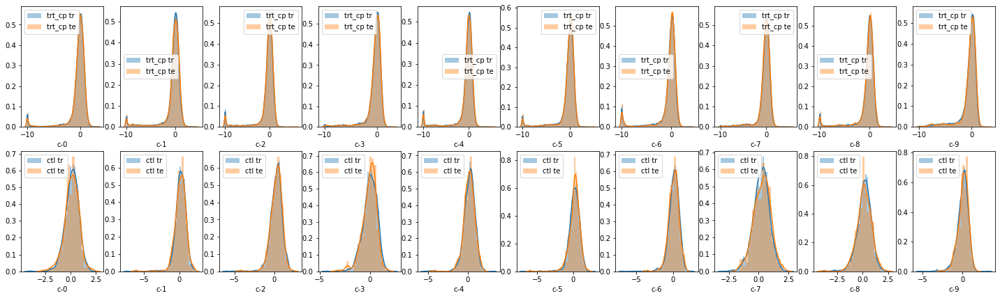

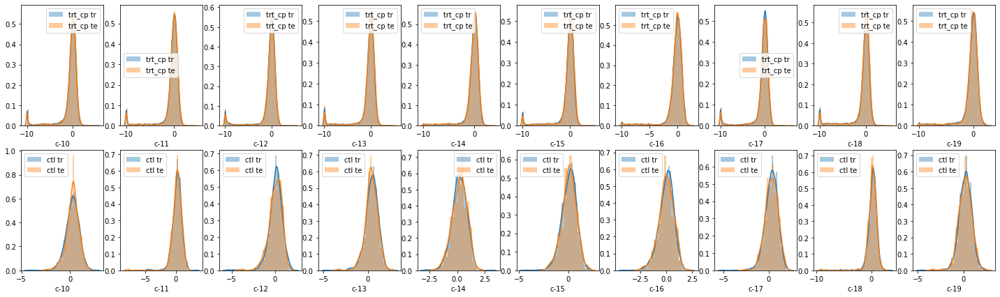

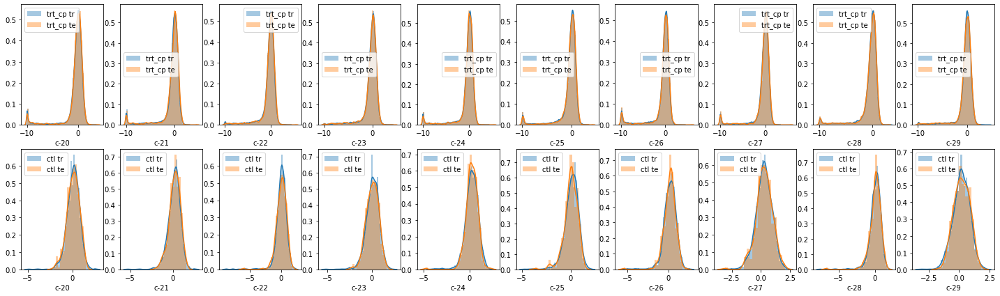

In [52]:
#"cp_type"
size = 10
for k in range(len(c_feats)//5//size + 1):
    plt.figure(figsize=(25,7))
    for ind, i in enumerate(range(size*k, size*(k+1))):
        if i <= len(c_feats)-1:
            plt.subplot(2,size,ind+1)
            sns.distplot(train_feat[train_feat.cp_type=='trt_cp']["c-"+str(i)], label = "trt_cp tr")
            sns.distplot(test_feat[test_feat.cp_type=='trt_cp']["c-"+str(i)], label = "trt_cp te")
            plt.legend(loc="best")
            plt.subplot(2,size,ind+1+size)
            sns.distplot(train_feat[train_feat.cp_type=='ctl_vehicle']["c-"+str(i)], label = "ctl tr")
            sns.distplot(test_feat[test_feat.cp_type=='ctl_vehicle']["c-"+str(i)], label = "ctl te")
            plt.legend(loc="best")

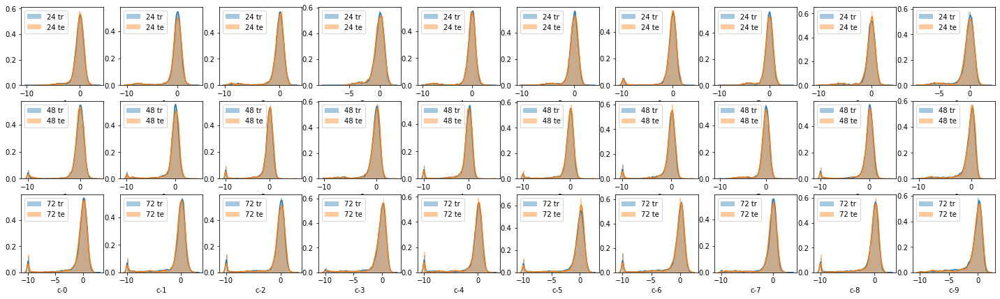

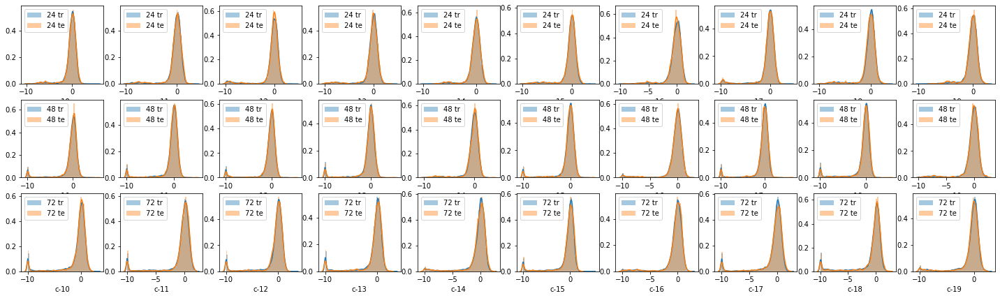

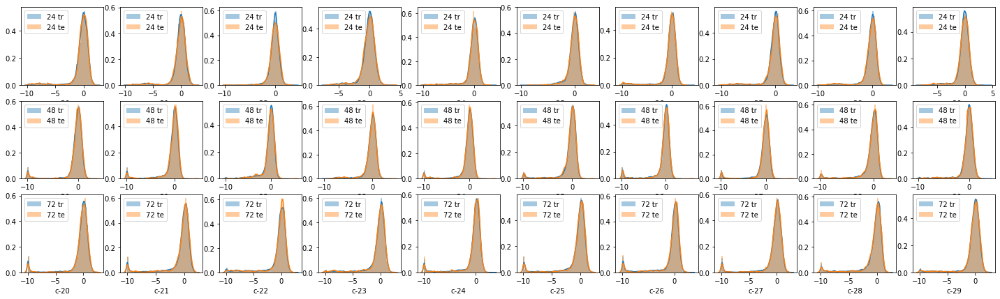

In [53]:
# "cp_time"
size = 10
for k in range(len(c_feats)//5//size + 1):
    plt.figure(figsize=(25,7))
    for ind, i in enumerate(range(size*k, size*(k+1))):
        if i <= len(c_feats)-1:
            plt.subplot(3,size,ind+1)
            sns.distplot(train_feat[train_feat.cp_time==24]["c-"+str(i)], label = "24 tr")
            sns.distplot(test_feat[test_feat.cp_time==24]["c-"+str(i)], label = "24 te")
            plt.legend(loc="best")
            plt.subplot(3,size,ind+1+size)
            sns.distplot(train_feat[train_feat.cp_time==48]["c-"+str(i)], label = "48 tr")
            sns.distplot(test_feat[test_feat.cp_time==48]["c-"+str(i)], label = "48 te")
            plt.legend(loc="best")
            plt.subplot(3,size,ind+1+2*size)
            sns.distplot(train_feat[train_feat.cp_time==72]["c-"+str(i)], label = "72 tr")
            sns.distplot(test_feat[test_feat.cp_time==72]["c-"+str(i)], label = "72 te")
            plt.legend(loc="best")

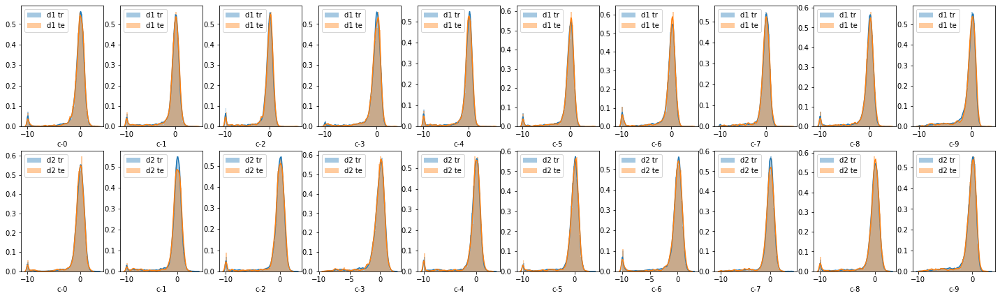

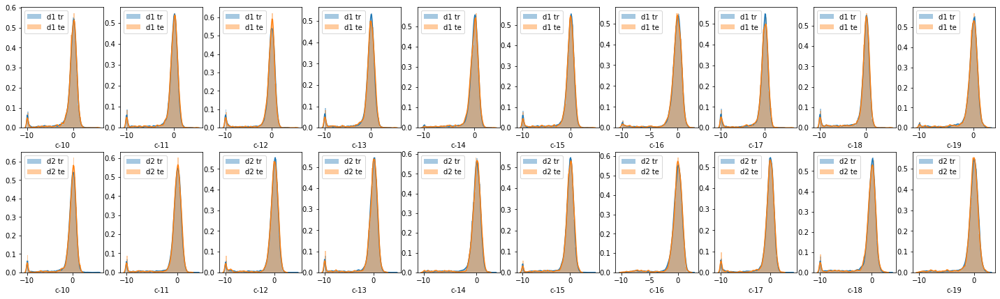

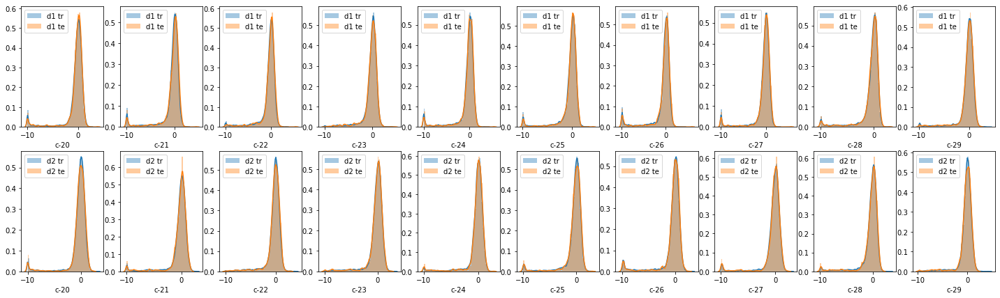

In [54]:
# "cp_dose"
size = 10
for k in range(len(c_feats)//5//size + 1):
    plt.figure(figsize=(25,7))
    for ind, i in enumerate(range(size*k, size*(k+1))):
        if i <= len(c_feats)-1:
            plt.subplot(2,size,ind+1)
            sns.distplot(train_feat[train_feat.cp_dose=="D1"]["c-"+str(i)], label = "d1 tr")
            sns.distplot(test_feat[test_feat.cp_dose=="D1"]["c-"+str(i)], label = "d1 te")
            plt.legend(loc="best")
            plt.subplot(2,size,ind+11)
            sns.distplot(train_feat[train_feat.cp_dose=="D2"]["c-"+str(i)], label = "d2 tr")
            sns.distplot(test_feat[test_feat.cp_dose=="D2"]["c-"+str(i)], label = "d2 te")
            plt.legend(loc="best")

# g-variables vs c-variables

In [55]:
a_feats = [i for i in train_feat.columns if i in c_feats or i in g_feats]
correlations = train_feat[a_feats].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'].isin(c_feats)]
correlations = correlations[correlations['level_1'].isin(g_feats)]
correlations.tail(20)

,level_0,level_1,0
753588,c-94,g-328,0.829786
753623,c-57,g-38,0.830313
753725,c-6,g-228,0.831498
753736,c-73,g-38,0.831666
753770,c-70,g-731,0.832215
753780,c-42,g-38,0.832269
753784,c-2,g-349,0.832372
753810,c-83,g-349,0.832669
753892,c-75,g-349,0.833520
753896,c-93,g-349,0.833548


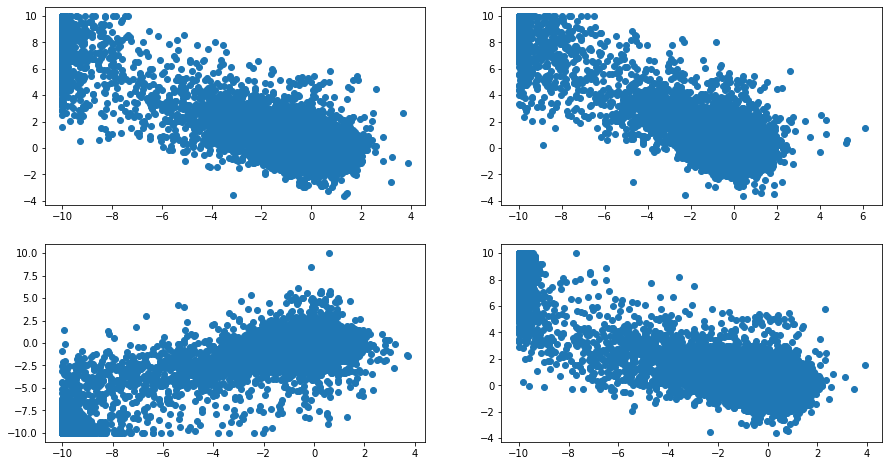

In [56]:
# some correlated examples
plt.figure(figsize=(15,8))
plt.subplot(2,2,1)
plt.scatter(train_feat["c-60"], train_feat["g-349"])
plt.subplot(2,2,2)
plt.scatter(train_feat["c-31"], train_feat["g-349"])
plt.subplot(2,2,3)
plt.scatter(train_feat["c-38"], train_feat["g-228"])
plt.subplot(2,2,4)
plt.scatter(train_feat["c-6"], train_feat["g-349"])

# target info

In [57]:
target_feats = [i for i in train_score.columns if i != "sig_id"]
for i in target_feats:
    print(i, end=", ")

5-alpha_reductase_inhibitor, 11-beta-hsd1_inhibitor, acat_inhibitor, acetylcholine_receptor_agonist, acetylcholine_receptor_antagonist, acetylcholinesterase_inhibitor, adenosine_receptor_agonist, adenosine_receptor_antagonist, adenylyl_cyclase_activator, adrenergic_receptor_agonist, adrenergic_receptor_antagonist, akt_inhibitor, aldehyde_dehydrogenase_inhibitor, alk_inhibitor, ampk_activator, analgesic, androgen_receptor_agonist, androgen_receptor_antagonist, anesthetic_-_local, angiogenesis_inhibitor, angiotensin_receptor_antagonist, anti-inflammatory, antiarrhythmic, antibiotic, anticonvulsant, antifungal, antihistamine, antimalarial, antioxidant, antiprotozoal, antiviral, apoptosis_stimulant, aromatase_inhibitor, atm_kinase_inhibitor, atp-sensitive_potassium_channel_antagonist, atp_synthase_inhibitor, atpase_inhibitor, atr_kinase_inhibitor, aurora_kinase_inhibitor, autotaxin_inhibitor, bacterial_30s_ribosomal_subunit_inhibitor, bacterial_50s_ribosomal_subunit_inhibitor, bacterial_an

## per column

In [58]:
target_dists = pd.DataFrame(np.sum(train_score[target_feats])).reset_index(drop=False)
target_dists.columns = ["target", "number"]
target_dists.sort_values("number", ascending=False).reset_index(drop=True)

,target,number
0,nfkb_inhibitor,832
1,proteasome_inhibitor,726
2,cyclooxygenase_inhibitor,435
3,dopamine_receptor_antagonist,424
4,serotonin_receptor_antagonist,404
...,...,...
201,elastase_inhibitor,6
202,steroid,6
203,atm_kinase_inhibitor,6
204,erbb2_inhibitor,1


In [59]:
target_dists["number"].describe() # ターゲットラベルとしてあるのに、一回も観測されていないターゲットはない

count    206.000000
mean      81.766990
std      115.160351
min        1.000000
25%       19.000000
50%       38.500000
75%       83.000000
max      832.000000
Name: number, dtype: float64

<BarContainer object of 206 artists>

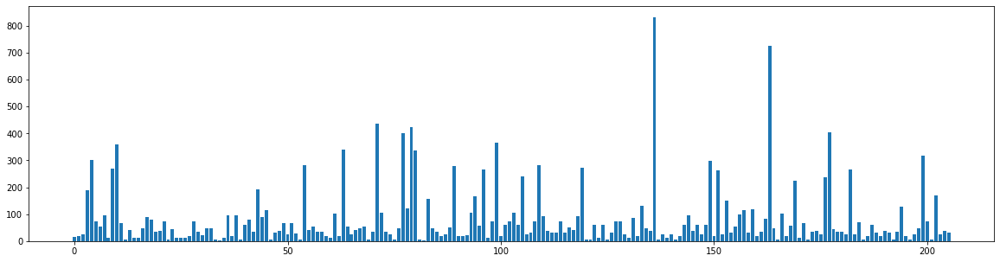

In [60]:
# prediction difficult differs per target 
plt.figure(figsize=(20,5))
plt.bar(range(target_dists.shape[0]), target_dists["number"])

In [61]:
# except 2 targets which include only one positive label, stratifiedkfold can be utilized
tmp = pd.DataFrame(target_dists["number"].value_counts())
for i in sorted(tmp.index):
    print(i, end=", ")
tmp.loc[1,:]

1, 6, 7, 12, 13, 17, 18, 19, 23, 24, 25, 26, 29, 30, 31, 32, 35, 36, 37, 38, 39, 42, 43, 44, 47, 48, 49, 50, 51, 54, 55, 56, 59, 60, 61, 62, 66, 67, 68, 71, 72, 73, 74, 80, 84, 85, 89, 92, 93, 96, 97, 98, 102, 103, 104, 106, 115, 119, 121, 127, 130, 151, 158, 165, 170, 190, 192, 223, 236, 241, 264, 266, 267, 270, 273, 279, 281, 283, 297, 301, 316, 336, 340, 360, 367, 402, 404, 424, 435, 726, 832, 

number    2
Name: 1, dtype: int64

In [62]:
target_dists["suffix"] = target_dists["target"].apply(lambda x: x.split("_")[-1])
target_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False).head(10)

,index,suffix
0,inhibitor,0.543689
1,antagonist,0.155340
2,agonist,0.135922
3,activator,0.024272
4,agent,0.014563
5,blocker,0.009709
6,local,0.004854
7,sensitizer,0.004854
8,medium,0.004854
9,b,0.004854


[]

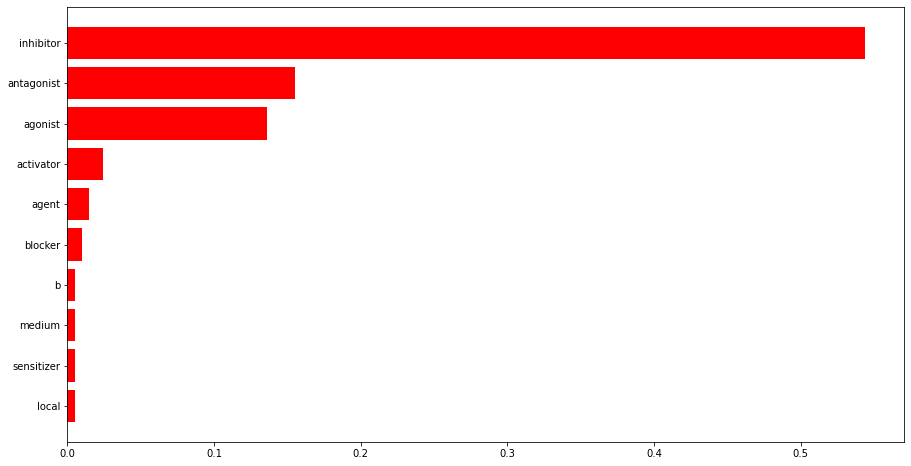

In [63]:
tmp = pd.DataFrame(target_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False)).head(10)
tmp = tmp.sort_values("suffix", ascending=True).reset_index(drop=True)
plt.figure(figsize=(15,8))
plt.barh(range(tmp.shape[0]),tmp["suffix"], color="r")
plt.yticks(range(tmp.shape[0]), tmp["index"], rotation='horizontal')
plt.plot()

In [64]:
target_dists.groupby("suffix")["number"].sum()

suffix
activator             115
agent                 150
agonist              2330
analgesic              12
antagonist           3449
anti-inflammatory      73
antiarrhythmic          6
antibiotic             43
anticonvulsant         12
antifolate             36
antifungal             13
antihistamine          12
antimalarial           18
antioxidant            73
antiprotozoal          36
antiviral              23
b                      26
blocker               323
diuretic                6
donor                  26
immunosuppressant      73
inhibitor            9693
laxative                6
local                  80
medium                 56
scavenger              18
secretagogue           30
sensitizer             51
steroid                 6
stimulant              49
Name: number, dtype: int64

[]

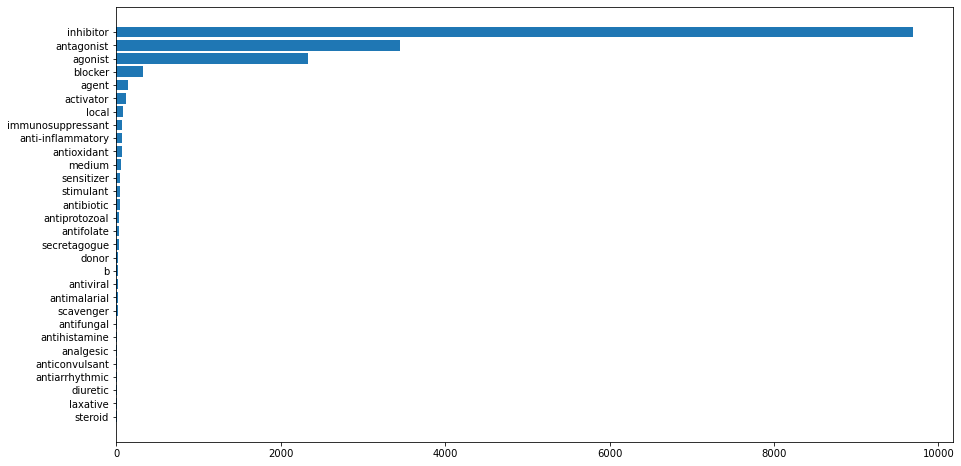

In [65]:
tmp = pd.DataFrame(target_dists.groupby("suffix")["number"].sum()).reset_index(drop=False)
tmp = tmp.sort_values("number", ascending=True).reset_index(drop=True)
plt.figure(figsize=(15,8))
plt.barh(range(tmp.shape[0]),tmp["number"])
plt.yticks(range(tmp.shape[0]), tmp["suffix"], rotation='horizontal')
plt.plot()

In [66]:
correlations = train_score[target_feats].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'] != correlations['level_1']]
correlations.tail(20)

,level_0,level_1,0
42210,fgfr_inhibitor,vegfr_inhibitor,0.333914
42211,vegfr_inhibitor,fgfr_inhibitor,0.333914
42212,norepinephrine_reuptake_inhibitor,serotonin_reuptake_inhibitor,0.341511
42213,serotonin_reuptake_inhibitor,norepinephrine_reuptake_inhibitor,0.341511
42214,insulin_sensitizer,ppar_receptor_agonist,0.402977
42215,ppar_receptor_agonist,insulin_sensitizer,0.402977
42216,caspase_activator,apoptosis_stimulant,0.403381
42217,apoptosis_stimulant,caspase_activator,0.403381
42218,nitric_oxide_production_inhibitor,nrf2_activator,0.407888
42219,nrf2_activator,nitric_oxide_production_inhibitor,0.407888


In [67]:
difficult_var = ["acetylcholine_receptor_agonist","acetylcholine_receptor_antagonist","adrenergic_receptor_agonist",
                 "adrenergic_receptor_antagonist","bacterial_cell_wall_synthesis_inhibitor","calcium_channel_blocker",
                 "cyclooxygenase_inhibitor","dna_inhibitor","dopamine_receptor_antagonist","estrogen_receptor_agonist",
                "glutamate_receptor_antagonist","histamine_receptor_antagonist","phosphodiesterase_inhibitor","serotonin_receptor_agonist",
                 "serotonin_receptor_antagonist","sodium_channel_inhibitor","tubulin_inhibitor"]

correlations = train_score[target_feats].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'].isin(difficult_var)]
correlations = correlations[~correlations['level_1'].isin(difficult_var)]

correlations.tail(20)

,level_0,level_1,0
41981,acetylcholine_receptor_antagonist,cholinergic_receptor_antagonist,0.042022
41982,adrenergic_receptor_antagonist,serotonin_reuptake_inhibitor,0.042752
41984,cyclooxygenase_inhibitor,prostaglandin_inhibitor,0.043119
41987,tubulin_inhibitor,dna_alkylating_agent,0.043882
41990,dna_inhibitor,progesterone_receptor_agonist,0.046187
41993,glutamate_receptor_antagonist,carbonic_anhydrase_inhibitor,0.047778
41995,glutamate_receptor_antagonist,sigma_receptor_agonist,0.047778
42026,adrenergic_receptor_agonist,imidazoline_receptor_agonist,0.062134
42031,estrogen_receptor_agonist,dna_alkylating_agent,0.065524
42043,phosphodiesterase_inhibitor,adenosine_receptor_antagonist,0.069216


## per row

16844
1    12532
0     9367
2     1538
3      303
4       55
5       13
7        6
Name: score_sum, dtype: int64


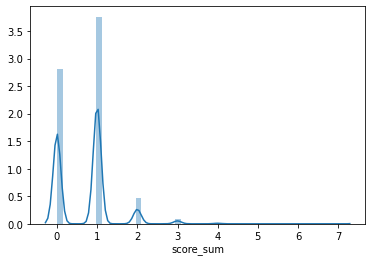

In [68]:
train_score["score_sum"] = pd.DataFrame(np.sum(train_score[target_feats], axis=1))
print(train_score["score_sum"].sum())
print(train_score["score_sum"].value_counts())
sns.distplot(train_score["score_sum"])

In [69]:
# positive label rate = 0.3%
train_score["score_sum"].sum() * 100 / (len(target_feats) * train_feat.shape[0])

0.34335680814337

## correlations in target variables

In [70]:
correlations = train_score[target_feats].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'] != correlations['level_1']]
correlations.tail(20)

,level_0,level_1,0
42210,fgfr_inhibitor,vegfr_inhibitor,0.333914
42211,vegfr_inhibitor,fgfr_inhibitor,0.333914
42212,norepinephrine_reuptake_inhibitor,serotonin_reuptake_inhibitor,0.341511
42213,serotonin_reuptake_inhibitor,norepinephrine_reuptake_inhibitor,0.341511
42214,insulin_sensitizer,ppar_receptor_agonist,0.402977
42215,ppar_receptor_agonist,insulin_sensitizer,0.402977
42216,caspase_activator,apoptosis_stimulant,0.403381
42217,apoptosis_stimulant,caspase_activator,0.403381
42218,nitric_oxide_production_inhibitor,nrf2_activator,0.407888
42219,nrf2_activator,nitric_oxide_production_inhibitor,0.407888


## cp variables vs targets

In [71]:
train_feat.cp_type

0             trt_cp
1             trt_cp
2             trt_cp
3             trt_cp
4             trt_cp
            ...     
23809         trt_cp
23810         trt_cp
23811    ctl_vehicle
23812         trt_cp
23813         trt_cp
Name: cp_type, Length: 23814, dtype: object

# auxiliary training data

In [72]:
cons_feats = [i for i in train_nonscore.columns if i != "sig_id"]

In [73]:
train_nonscore.shape

(23814, 403)

In [74]:
train_nonscore.head()

,sig_id,abc_transporter_expression_enhancer,abl_inhibitor,ace_inhibitor,acetylcholine_release_enhancer,adenosine_deaminase_inhibitor,adenosine_kinase_inhibitor,adenylyl_cyclase_inhibitor,age_inhibitor,alcohol_dehydrogenase_inhibitor,aldehyde_dehydrogenase_activator,aldose_reductase_inhibitor,alpha_mannosidase_inhibitor,ampk_inhibitor,androgen_biosynthesis_inhibitor,angiotensin_receptor_agonist,antacid,anthelmintic,antihypertensive,antimetabolite,antipruritic,antirheumatic_drug,antiseptic,antispasmodic,antithyroid_agent,antitussive,anxiolytic,ap_inhibitor,apolipoprotein_expression_enhancer,apoptosis_inhibitor,arf_inhibitor,aryl_hydrocarbon_receptor_agonist,aryl_hydrocarbon_receptor_antagonist,aspartic_protease_inhibitor,atherogenesis_inhibitor,atherosclerosis_formation_inhibitor,atp-sensitive_potassium_channel_agonist,atp-sensitive_potassium_channel_inhibitor,atp_channel_activator,atp_channel_blocker,atp_citrase_lyase_inhibitor,autophagy_inducer,axl_kinase_inhibitor,bacterial_atpase_inhibitor,bacterial_permeability_inducer,bacterial_protein_synthesis_inhibitor,benzodiazepine_receptor_antagonist,beta_catenin_inhibitor,beta_lactamase_inhibitor,beta_secretase_inhibitor,big1_inhibitor,bile_acid,biliverdin_reductase_a_activator,bone_resorption_inhibitor,botulin_neurotoxin_inhibitor,bradykinin_receptor_antagonist,breast_cancer_resistance_protein_inhibitor,bronchodilator,calcitonin_antagonist,calcium_channel_activator,calmodulin_inhibitor,calpain_inhibitor,camp_stimulant,capillary_stabilizing_agent,car_agonist,car_antagonist,carboxylesterase_inhibitor,carcinogen,cardiac_glycoside,carnitine_palmitoyltransferase_inhibitor,caspase_inhibitor,cathepsin_inhibitor,cc_chemokine_receptor_agonist,cdc_inhibitor,cdk_expression_enhancer,cell_cycle_inhibitor,cell_proliferation_inhibitor,ceramidase_inhibitor,cftr_channel_agonist,cftr_channel_antagonist,chitin_inhibitor,chloride_channel_activator,choleretic_agent,cholinergic_receptor_agonist,cholinesterase_inhibitor,clk_inhibitor,coenzyme_a_precursor,collagenase_inhibitor,collapsin_response_mediator_protein_stimulant,coloring_agent,complement_antagonist,complement_inhibitor,contraceptive_agent,contrast_agent,corticosteroid_antagonist,cyclin_d_inhibitor,cysteine_peptidase_inhibitor,cytidine_deaminase_inhibitor,cytokine_production_inhibitor,dehydrogenase_inhibitor,deubiquitinase_inhibitor,diacylglycerol_kinase_inhibitor,diacylglycerol_o_acyltransferase_inhibitor,differentiation_inducer,dihydroorotate_dehydrogenase_inhibitor,dihydropteroate_synthase_inhibitor,dihydropyrimidine_dehydrogenase_inhibitor,dna_dependent_protein_kinase_inhibitor,dna_methyltransferase_inhibitor,dna_polymerase_inhibitor,dna_repair_enzyme_inhibitor,dna_synthesis_inhibitor,dopamine_release_enhancer,dot1l_inhibitor,dynamin_inhibitor,dyrk_inhibitor,dystrophin_stimulant,endothelin_receptor_antagonist,enkephalinase_inhibitor,ephrin_inhibitor,epoxide_hydolase_inhibitor,etv1_inhibitor,eukaryotic_translation_initiation_factor_inhibitor,exportin_antagonist,fabi_inhibitor,farnesyl_pyrophosphate_synthase_inhibitor,fatty_acid_receptor_antagonist,fatty_acid_synthase_inhibitor,folate_receptor_ligand,free_fatty_acid_receptor_agonist,"fungal_1,3-beta-d-glucan_synthase_inhibitor",fungal_ergosterol_inhibitor,fungal_lanosterol_demethylase_inhibitor,fxr_agonist,fxr_antagonist,g_protein-coupled_receptor_agonist,g_protein-coupled_receptor_antagonist,g_protein_signaling_inhibitor,gaba_gated_chloride_channel_blocker,gaba_receptor_modulator,gaba_uptake_inhibitor,gap_junction_modulator,gastrin_inhibitor,gat_inhibitor,glcnac_phosphotransferase_inhibitor,gli_antagonist,glp_receptor_agonist,glucagon_receptor_antagonist,glucocorticoid_receptor_antagonist,glucokinase_activator,glucokinase_inhibitor,gluconeogenesis_inhibitor,glucose_dependent_insulinotropic_receptor_agonist,glucosidase_inhibitor,glutamate_receptor_modulator,glutathione_peroxidase_agonist,glutathione_reductase_(nadph)_activators,glutathione_transferase_inhibitor,glycine_receptor_antagonist,glyci

In [75]:
set(train_nonscore.sig_id.unique()) == set(train_score.sig_id.unique()) # idは完全一致

True

In [76]:
set(train_score.columns) & set(train_nonscore.columns) # id以外の変数はscore.csvとnon-score.csvで異なる

{'sig_id'}

In [77]:
train_nonscore.describe()

,abc_transporter_expression_enhancer,abl_inhibitor,ace_inhibitor,acetylcholine_release_enhancer,adenosine_deaminase_inhibitor,adenosine_kinase_inhibitor,adenylyl_cyclase_inhibitor,age_inhibitor,alcohol_dehydrogenase_inhibitor,aldehyde_dehydrogenase_activator,aldose_reductase_inhibitor,alpha_mannosidase_inhibitor,ampk_inhibitor,androgen_biosynthesis_inhibitor,angiotensin_receptor_agonist,antacid,anthelmintic,antihypertensive,antimetabolite,antipruritic,antirheumatic_drug,antiseptic,antispasmodic,antithyroid_agent,antitussive,anxiolytic,ap_inhibitor,apolipoprotein_expression_enhancer,apoptosis_inhibitor,arf_inhibitor,aryl_hydrocarbon_receptor_agonist,aryl_hydrocarbon_receptor_antagonist,aspartic_protease_inhibitor,atherogenesis_inhibitor,atherosclerosis_formation_inhibitor,atp-sensitive_potassium_channel_agonist,atp-sensitive_potassium_channel_inhibitor,atp_channel_activator,atp_channel_blocker,atp_citrase_lyase_inhibitor,autophagy_inducer,axl_kinase_inhibitor,bacterial_atpase_inhibitor,bacterial_permeability_inducer,bacterial_protein_synthesis_inhibitor,benzodiazepine_receptor_antagonist,beta_catenin_inhibitor,beta_lactamase_inhibitor,beta_secretase_inhibitor,big1_inhibitor,bile_acid,biliverdin_reductase_a_activator,bone_resorption_inhibitor,botulin_neurotoxin_inhibitor,bradykinin_receptor_antagonist,breast_cancer_resistance_protein_inhibitor,bronchodilator,calcitonin_antagonist,calcium_channel_activator,calmodulin_inhibitor,calpain_inhibitor,camp_stimulant,capillary_stabilizing_agent,car_agonist,car_antagonist,carboxylesterase_inhibitor,carcinogen,cardiac_glycoside,carnitine_palmitoyltransferase_inhibitor,caspase_inhibitor,cathepsin_inhibitor,cc_chemokine_receptor_agonist,cdc_inhibitor,cdk_expression_enhancer,cell_cycle_inhibitor,cell_proliferation_inhibitor,ceramidase_inhibitor,cftr_channel_agonist,cftr_channel_antagonist,chitin_inhibitor,chloride_channel_activator,choleretic_agent,cholinergic_receptor_agonist,cholinesterase_inhibitor,clk_inhibitor,coenzyme_a_precursor,collagenase_inhibitor,collapsin_response_mediator_protein_stimulant,coloring_agent,complement_antagonist,complement_inhibitor,contraceptive_agent,contrast_agent,corticosteroid_antagonist,cyclin_d_inhibitor,cysteine_peptidase_inhibitor,cytidine_deaminase_inhibitor,cytokine_production_inhibitor,dehydrogenase_inhibitor,deubiquitinase_inhibitor,diacylglycerol_kinase_inhibitor,diacylglycerol_o_acyltransferase_inhibitor,differentiation_inducer,dihydroorotate_dehydrogenase_inhibitor,dihydropteroate_synthase_inhibitor,dihydropyrimidine_dehydrogenase_inhibitor,dna_dependent_protein_kinase_inhibitor,dna_methyltransferase_inhibitor,dna_polymerase_inhibitor,dna_repair_enzyme_inhibitor,dna_synthesis_inhibitor,dopamine_release_enhancer,dot1l_inhibitor,dynamin_inhibitor,dyrk_inhibitor,dystrophin_stimulant,endothelin_receptor_antagonist,enkephalinase_inhibitor,ephrin_inhibitor,epoxide_hydolase_inhibitor,etv1_inhibitor,eukaryotic_translation_initiation_factor_inhibitor,exportin_antagonist,fabi_inhibitor,farnesyl_pyrophosphate_synthase_inhibitor,fatty_acid_receptor_antagonist,fatty_acid_synthase_inhibitor,folate_receptor_ligand,free_fatty_acid_receptor_agonist,"fungal_1,3-beta-d-glucan_synthase_inhibitor",fungal_ergosterol_inhibitor,fungal_lanosterol_demethylase_inhibitor,fxr_agonist,fxr_antagonist,g_protein-coupled_receptor_agonist,g_protein-coupled_receptor_antagonist,g_protein_signaling_inhibitor,gaba_gated_chloride_channel_blocker,gaba_receptor_modulator,gaba_uptake_inhibitor,gap_junction_modulator,gastrin_inhibitor,gat_inhibitor,glcnac_phosphotransferase_inhibitor,gli_antagonist,glp_receptor_agonist,glucagon_receptor_antagonist,glucocorticoid_receptor_antagonist,glucokinase_activator,glucokinase_inhibitor,gluconeogenesis_inhibitor,glucose_dependent_insulinotropic_receptor_agonist,glucosidase_inhibitor,glutamate_receptor_modulator,glutathione_peroxidase_agonist,glutathione_reductase_(nadph)_activators,glutathione_transferase_inhibitor,glycine_receptor_antagonist,glycine_tran

## per column

In [78]:
nontarget_dists = pd.DataFrame(np.sum(train_nonscore[cons_feats])).reset_index(drop=False)
nontarget_dists.columns = ["target", "number"]
nontarget_dists.sort_values("number", ascending=False).reset_index(drop=True)

,target,number
0,ace_inhibitor,91
1,purinergic_receptor_antagonist,78
2,map_kinase_inhibitor,74
3,sterol_demethylase_inhibitor,72
4,bone_resorption_inhibitor,67
...,...,...
397,src_activator,0
398,cysteine_peptidase_inhibitor,0
399,noradrenaline_uptake_inhibitor,0
400,cell_proliferation_inhibitor,0


In [79]:
nontarget_dists["suffix"] = nontarget_dists["target"].apply(lambda x: x.split("_")[-1])
nontarget_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False).head(10)

,index,suffix
0,inhibitor,0.524876
1,antagonist,0.109453
2,agonist,0.089552
3,activator,0.054726
4,agent,0.032338
5,stimulant,0.019900
6,inducer,0.014925
7,enhancer,0.014925
8,modulator,0.012438
9,ligand,0.012438


[]

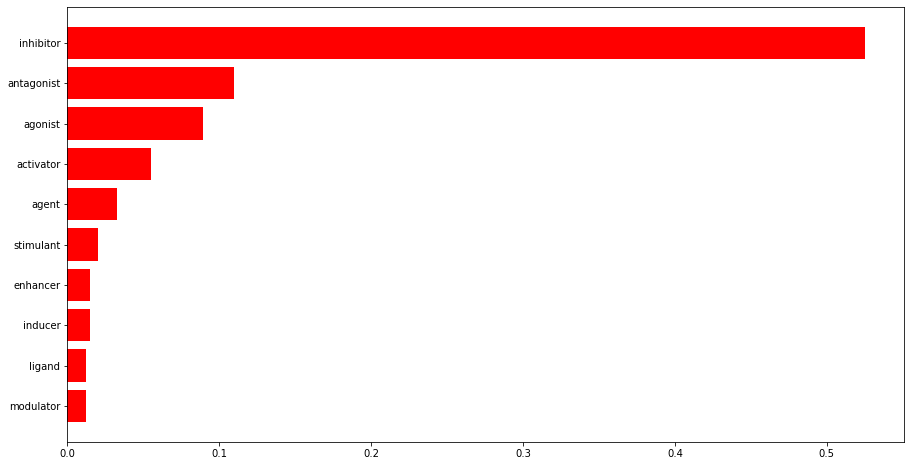

In [80]:
tmp = pd.DataFrame(nontarget_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False)).head(10)
tmp = tmp.sort_values("suffix", ascending=True).reset_index(drop=True)
plt.figure(figsize=(15,8))
plt.barh(range(tmp.shape[0]),tmp["suffix"], color="r")
plt.yticks(range(tmp.shape[0]), tmp["index"], rotation='horizontal')
plt.plot()

In [81]:
nontarget_dists.groupby("suffix")["number"].sum()

suffix
(serm)                30
(ssri)                36
acid                   6
activator            190
activators            12
agent                153
agonist              404
analog                13
anesthetic             0
antacid               12
antagonist           562
anthelmintic          24
antidepressant        30
antiepileptic         24
antihypertensive       0
antimetabolite         0
antipruritic           6
antiseptic             1
antispasmodic          6
antitussive           30
anxiolytic             6
blocker               48
bronchodilator         6
carcinogen            42
diuretic              19
drug                  24
enhancer              24
estrogen               0
glycoside              0
hormone               29
immunostimulant       36
inducer               66
inhibitor           2876
k                      6
ligand                24
modulator             59
mucolytic              0
neurotransmitter       6
precursor             12
progestin         

[]

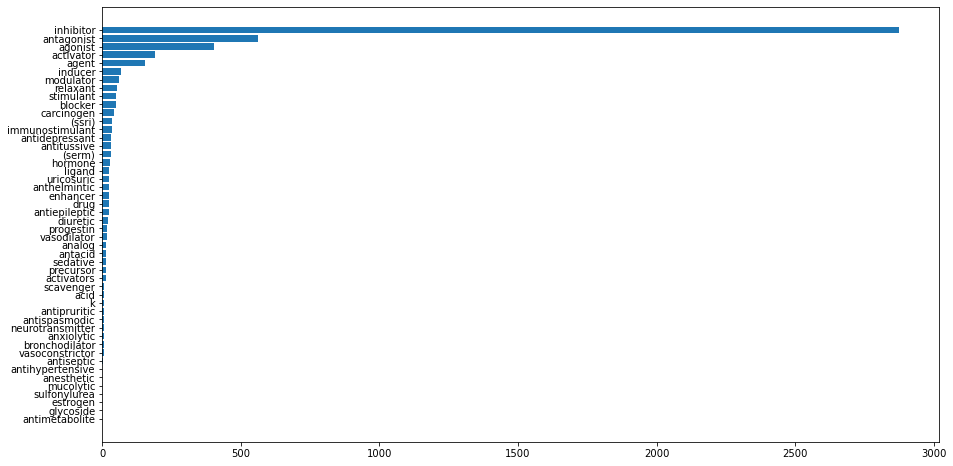

In [82]:
tmp = pd.DataFrame(nontarget_dists.groupby("suffix")["number"].sum()).reset_index(drop=False)
tmp = tmp.sort_values("number", ascending=True).reset_index(drop=True)
plt.figure(figsize=(15,8))
plt.barh(range(tmp.shape[0]),tmp["number"])
plt.yticks(range(tmp.shape[0]), tmp["suffix"], rotation='horizontal')
plt.plot()

In [83]:
nontarget_dists.describe()

,number
count,402.000000
mean,12.457711
std,13.359389
min,0.000000
25%,6.000000
50%,7.000000
75%,18.000000
max,91.000000


[]

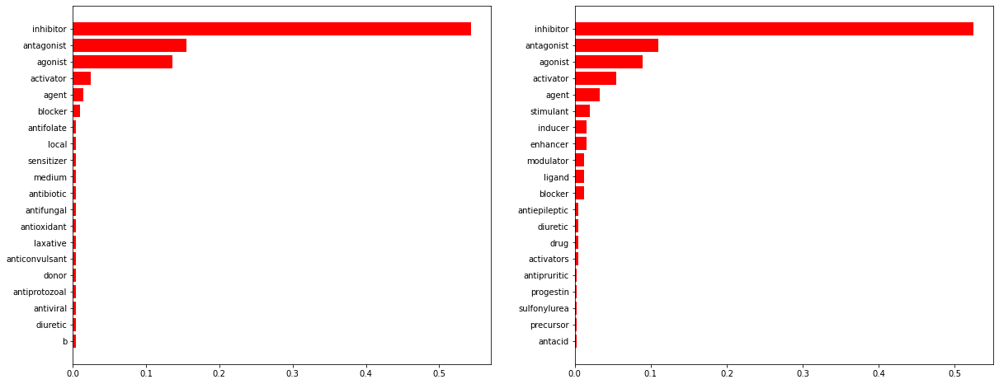

In [84]:
# comparison of ratio of suffix
tmp1 = pd.DataFrame(target_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False)).head(20)
tmp1 = tmp1.sort_values("suffix", ascending=True).reset_index(drop=True)

tmp2 = pd.DataFrame(nontarget_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False)).head(20)
tmp2 = tmp2.sort_values("suffix", ascending=True).reset_index(drop=True)

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.barh(range(tmp1.shape[0]),tmp1["suffix"],color="red")
plt.yticks(range(tmp1.shape[0]), tmp1["index"], rotation='horizontal')
plt.plot()
plt.subplot(1,2,2)
plt.barh(range(tmp2.shape[0]),tmp2["suffix"],color="red")
plt.yticks(range(tmp2.shape[0]), tmp2["index"], rotation='horizontal')
plt.plot()

[]

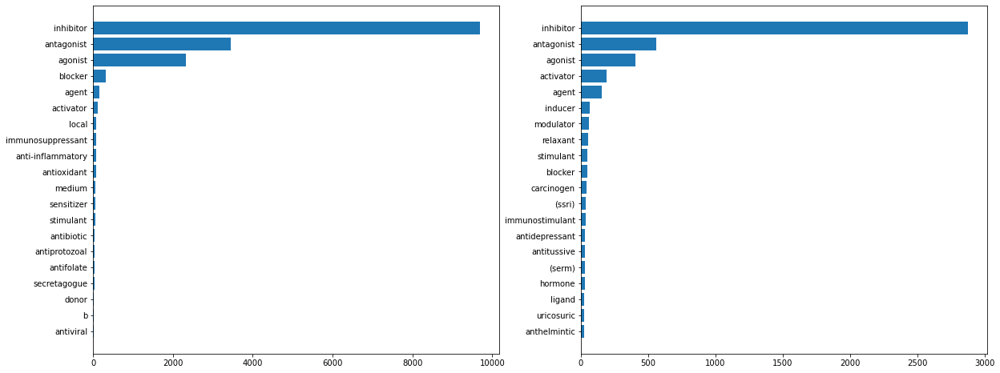

In [85]:
# comparison of sum of suffix
tmp1 = pd.DataFrame(target_dists.groupby("suffix")["number"].sum()).reset_index(drop=False)
tmp1 = tmp1.sort_values("number", ascending=True).reset_index(drop=True).tail(20)

tmp2 = pd.DataFrame(nontarget_dists.groupby("suffix")["number"].sum()).reset_index(drop=False)
tmp2 = tmp2.sort_values("number", ascending=True).reset_index(drop=True).tail(20)

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.barh(range(tmp1.shape[0]),tmp1["number"])
plt.yticks(range(tmp1.shape[0]), tmp1["suffix"], rotation='horizontal')
plt.plot()
plt.subplot(1,2,2)
plt.barh(range(tmp2.shape[0]),tmp2["number"])
plt.yticks(range(tmp2.shape[0]), tmp2["suffix"], rotation='horizontal')
plt.plot()

## per row

5008
0    19224
1     4282
2      247
3       36
4       13
7        6
5        6
Name: nonscore_sum, dtype: int64


(array([1.9224e+04, 4.2820e+03, 2.4700e+02, 0.0000e+00, 3.6000e+01,
        1.3000e+01, 0.0000e+00, 6.0000e+00, 0.0000e+00, 6.0000e+00]),
 array([0. , 0.7, 1.4, 2.1, 2.8, 3.5, 4.2, 4.9, 5.6, 6.3, 7. ]),
 <a list of 10 Patch objects>)

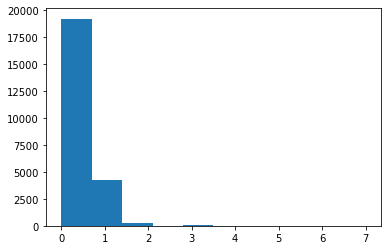

In [86]:
train_nonscore["nonscore_sum"] = pd.DataFrame(np.sum(train_nonscore[cons_feats], axis=1))
print(train_nonscore["nonscore_sum"].sum())
print(train_nonscore["nonscore_sum"].value_counts())
plt.hist(train_nonscore["nonscore_sum"])

In [87]:
train_nonscore["nonscore_sum"].sum() * 100 / (len(cons_feats) * train_nonscore.shape[0])

0.05231255329968115

In [88]:
all_moa_info = pd.merge(train_score, train_nonscore, on="sig_id", how="outer")

In [89]:
all_moa_info[["score_sum","nonscore_sum"]].corr() # weak negative correlation

,score_sum,nonscore_sum
score_sum,1.000000,-0.251471
nonscore_sum,-0.251471,1.000000


In [90]:
pd.crosstab(all_moa_info["score_sum"], all_moa_info["nonscore_sum"])

nonscore_sum,0,1,2,3,4,5,7
score_sum,,,,,,,
0,5530,3680,150,6,1,0,0
1,11956,479,79,12,6,0,0
2,1428,86,12,0,6,6,0
3,279,18,6,0,0,0,0
4,31,6,0,12,0,0,6
5,0,13,0,0,0,0,0
7,0,0,0,6,0,0,0


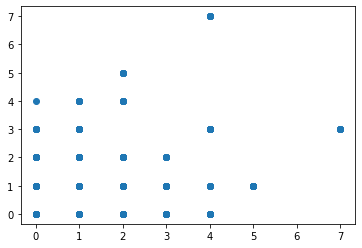

In [91]:
plt.scatter(all_moa_info[["score_sum"]], all_moa_info[["nonscore_sum"]])

# combined training data

In [92]:
def std_calc(row):
    return np.std(row[g_feats])

def mean_calc(row):
    return np.mean(row[g_feats])

tqdm_notebook.pandas(desc="progress")
train_feat[["g_std"]] = train_feat.progress_apply(std_calc, axis=1)
test_feat[["g_std"]] = test_feat.progress_apply(std_calc, axis=1)
train_feat[["g_mean"]] = train_feat.progress_apply(mean_calc, axis=1)
test_feat[["g_mean"]] = test_feat.progress_apply(mean_calc, axis=1)
#print("train", np.max(train_feat["g_unique_num"]), np.min(train_feat["g_unique_num"]))
#print("test ", np.max(test_feat["g_unique_num"]), np.min(test_feat["g_unique_num"]))

/opt/conda/lib/python3.7/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [93]:
def std_calc(row):
    return np.std(row[c_feats])

def mean_calc(row):
    return np.mean(row[c_feats])

tqdm_notebook.pandas(desc="progress")
train_feat[["c_std"]] = train_feat.progress_apply(std_calc, axis=1)
test_feat[["c_std"]] = test_feat.progress_apply(std_calc, axis=1)
train_feat[["c_mean"]] = train_feat.progress_apply(mean_calc, axis=1)
test_feat[["c_mean"]] = test_feat.progress_apply(mean_calc, axis=1)

In [94]:
train = pd.merge(train_feat, train_score, on="sig_id")
train["target_sum"] = train[target_feats].sum(axis=1)
print(train.shape)

(23814, 1092)


In [95]:
train.head()

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,...,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-679,g-680,g-681,g-682,g-683,g-684,g-685,g-686,g-687,g-688,g-689,g-690,g-691,g-692,g-693,g-694,g-695,g-696,g-697,g-698,g-699,g-700,g-701,g-702,g-703,g-704,g-705,g-706,g-707,g-708,g-709,g-710,g-711,g-712,g-713,g-714,g-715,g-716,g-717,g-718,g-719,g-720,g-721,g-722,g-723,g-724,g-725,g-726,g-727,g-728,g-729,g-730,g-731,g-732,g-733,g-734,g-735,g-736,g-737,g-738,g-739,g-740,g-741,g-742,g-743,g-744,g-745,g-746,g-747,g-748,g-749,g-750,g-751,g-752,g-753,g-754,g-755,g-756,g-757,g-758,g-759,g-760,g-761,g-762,g-763,g-764,g-765,g-766,g-767,g-768,g-769,g-770,

In [96]:
# it's confirmed that control perturbations have no MoAs
train[train.cp_type=="ctl_vehicle"][target_feats].sum().sum()

0

In [97]:
# target variables vs explanation variables
all_feats = [i for i in train.columns if i != "sig_id"]
correlations = train[all_feats].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'].isin(target_feats)]
correlations = correlations[~correlations['level_1'].isin(target_feats)].reset_index(drop=True)
correlations.tail(20)

,level_0,level_1,0
181878,proteasome_inhibitor,c-14,0.762874
181879,proteasome_inhibitor,c-68,0.766533
181880,proteasome_inhibitor,c-72,0.768157
181881,proteasome_inhibitor,c-61,0.768166
181882,proteasome_inhibitor,c-27,0.768547
181883,proteasome_inhibitor,c-90,0.770625
181884,proteasome_inhibitor,c-17,0.775395
181885,proteasome_inhibitor,c-93,0.776989
181886,proteasome_inhibitor,c-35,0.778178
181887,proteasome_inhibitor,c-88,0.778404


In [98]:
correlations.head(20)

,level_0,level_1,0
0,estrogen_receptor_antagonist,g-569,1.020711e-07
1,cck_receptor_antagonist,g-718,2.275598e-07
2,bacterial_50s_ribosomal_subunit_inhibitor,g-223,2.474215e-07
3,casein_kinase_inhibitor,g-521,2.624106e-07
4,thrombin_inhibitor,g-267,2.951385e-07
5,transient_receptor_potential_channel_antagonist,g-690,3.530228e-07
6,angiogenesis_inhibitor,g-141,4.347556e-07
7,leukotriene_inhibitor,g-372,4.359034e-07
8,tropomyosin_receptor_kinase_inhibitor,g-311,5.710204e-07
9,faah_inhibitor,g-466,7.097009e-07


In [99]:
for feat in difficult_var:
    print(train[feat].sum())
    print(pd.crosstab(train[(train.cp_type=="trt_cp")]["g_unique_num"], train[(train.cp_type=="trt_cp")][feat]).head())

190
acetylcholine_receptor_agonist  0  1
g_unique_num                        
392                             1  0
681                             1  0
687                             1  0
688                             1  0
690                             1  0
301
acetylcholine_receptor_antagonist  0  1
g_unique_num                           
392                                1  0
681                                1  0
687                                1  0
688                                1  0
690                                1  0
270
adrenergic_receptor_agonist  0  1
g_unique_num                     
392                          1  0
681                          1  0
687                          1  0
688                          1  0
690                          1  0
360
adrenergic_receptor_antagonist  0  1
g_unique_num                        
392                             1  0
681                             1  0
687                             1  0
688                   

In [100]:
for feat in difficult_var:
    print(train[feat].sum())
    print(pd.crosstab(train[(train.cp_type=="trt_cp")]["g10_num"], train[(train.cp_type=="trt_cp")][feat]).head())

190
acetylcholine_receptor_agonist      0    1
g10_num                                   
0                               20306  189
1                                 522    1
2                                 191    0
3                                 141    0
4                                 111    0
301
acetylcholine_receptor_antagonist      0    1
g10_num                                      
0                                  20197  298
1                                    520    3
2                                    191    0
3                                    141    0
4                                    111    0
270
adrenergic_receptor_agonist      0    1
g10_num                                
0                            20227  268
1                              521    2
2                              191    0
3                              141    0
4                              111    0
360
adrenergic_receptor_antagonist      0    1
g10_num                               

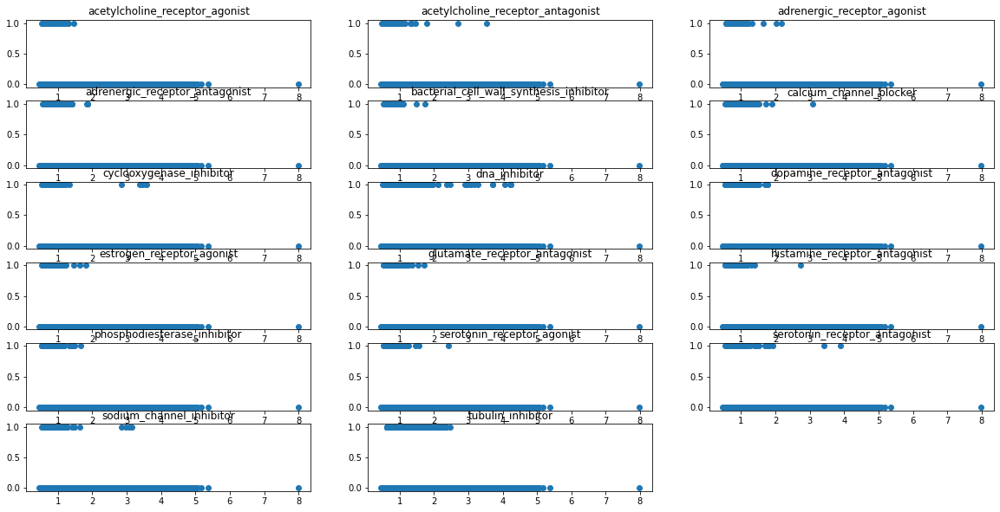

In [101]:
plt.figure(figsize=(20,10))
for i, feat in enumerate(difficult_var):
    plt.subplot(6,3,i+1)
    plt.scatter(train[(train.cp_type=="trt_cp")]["g_std"], train[(train.cp_type=="trt_cp")][feat])
    plt.title(feat)

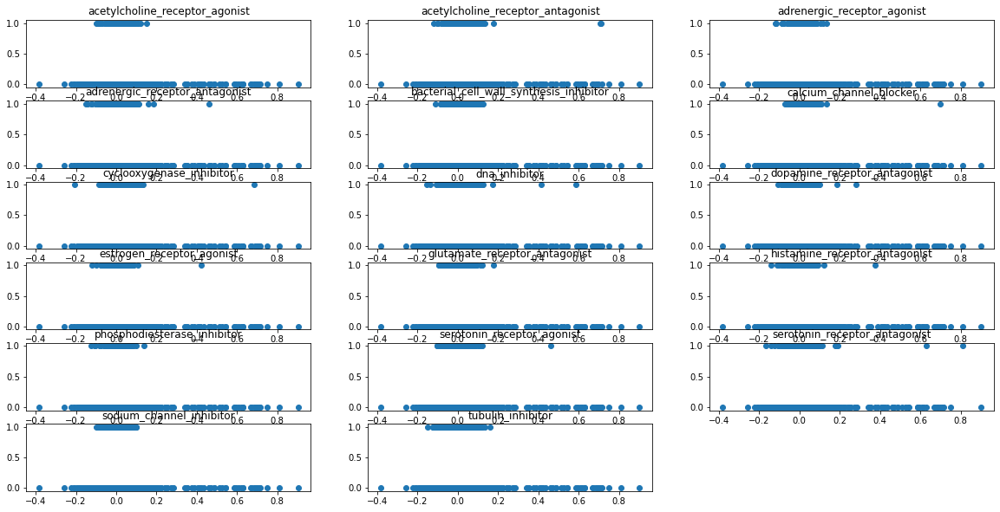

In [102]:
plt.figure(figsize=(20,10))
for i, feat in enumerate(difficult_var):
    plt.subplot(6,3,i+1)
    plt.scatter(train[(train.cp_type=="trt_cp")]["g_mean"], train[(train.cp_type=="trt_cp")][feat])
    plt.title(feat)

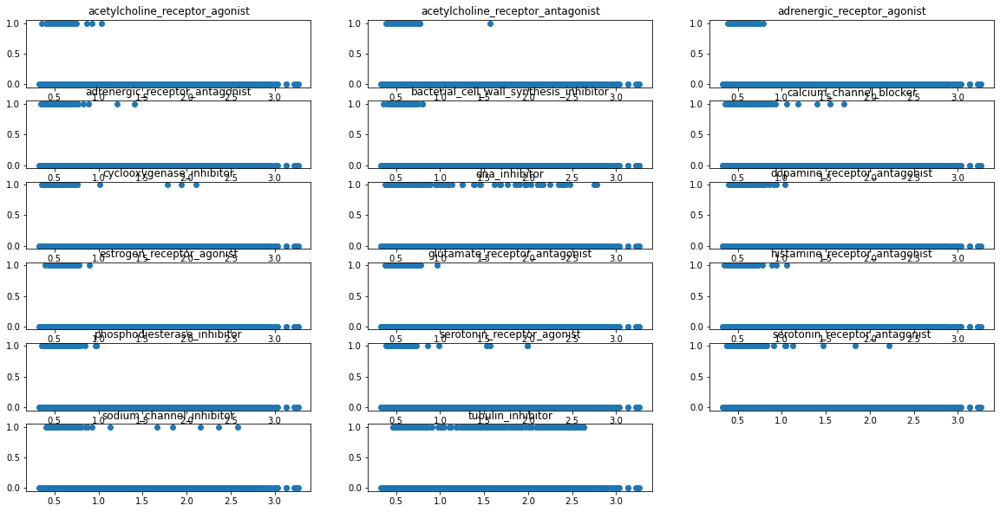

In [103]:
plt.figure(figsize=(20,10))
for i, feat in enumerate(difficult_var):
    plt.subplot(6,3,i+1)
    plt.scatter(train[(train.cp_type=="trt_cp")]["c_std"], train[(train.cp_type=="trt_cp")][feat])
    plt.title(feat)

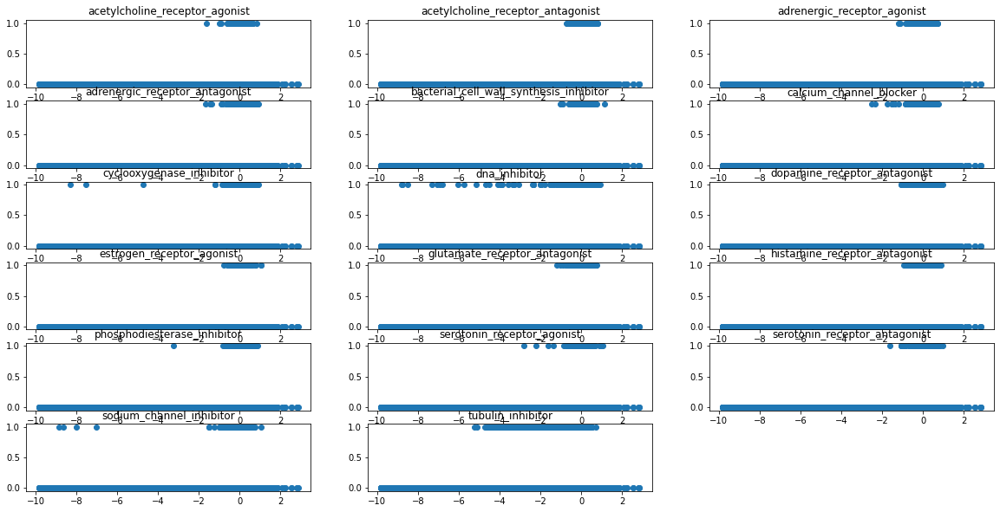

In [104]:
plt.figure(figsize=(20,10))
for i, feat in enumerate(difficult_var):
    plt.subplot(6,3,i+1)
    plt.scatter(train[(train.cp_type=="trt_cp")]["c_mean"], train[(train.cp_type=="trt_cp")][feat])
    plt.title(feat)

# cp control group details

In [105]:
train_cp = train_feat[train_feat.cp_type=="ctl_vehicle"].copy()

In [106]:
cp_group_data = train_cp.groupby(["cp_dose", "cp_time"]).agg({"mean"}).reset_index()
drop_columns = ["mean-" + i for i in g_feats + c_feats]
columns = ["cp_dose", "cp_time"] + drop_columns
cp_group_data.columns = columns

ValueError: Length mismatch: Expected axis has 882 elements, new values have 874 elements

In [107]:
cp_group_data

,cp_dose,cp_time,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-679,g-680,g-681,g

In [108]:
cp_group_data["mean-g-0"]

KeyError: 'mean-g-0'

In [109]:
train_cons = train_feat[train_feat.cp_type!="ctl_vehicle"].copy()
train_cons = pd.merge(train_cons, cp_group_data, on=["cp_time", "cp_dose"], how="left")

/opt/conda/lib/python3.7/site-packages/pandas/core/reshape/merge.py:643: UserWarning: merging between different levels can give an unintended result (1 levels on the left,2 on the right)
  warnings.warn(msg, UserWarning)
/opt/conda/lib/python3.7/site-packages/pandas/core/generic.py:3878: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


In [110]:
train_cons

sig_id cp_type  cp_time cp_dose     g-0     g-1     g-2     g-3  \
0      id_000644bb2  trt_cp       24      D1  1.0620  0.5577 -0.2479 -0.6208   
1      id_000779bfc  trt_cp       72      D1  0.0743  0.4087  0.2991  0.0604   
2      id_000a6266a  trt_cp       48      D1  0.6280  0.5817  1.5540 -0.0764   
3      id_0015fd391  trt_cp       48      D1 -0.5138 -0.2491 -0.2656  0.5288   
4      id_001626bd3  trt_cp       72      D2 -0.3254 -0.4009  0.9700  0.6919   
...             ...     ...      ...     ...     ...     ...     ...     ...   
21943  id_fff8c2444  trt_cp       72      D1  0.1608 -1.0500  0.2551 -0.2239   
21944  id_fffb1ceed  trt_cp       24      D2  0.1394 -0.0636 -0.1112 -0.5080   
21945  id_fffb70c0c  trt_cp       24      D2 -1.3260  0.3478 -0.3743  0.9905   
21946  id_fffcb9e7c  trt_cp       24      D1  0.6660  0.2324  0.4392  0.2044   
21947  id_ffffdd77b  trt_cp       72      D1 -0.8598  1.0240 -0.1361  0.7952   

          g-4     g-5     g-6     g-7     g-8     g-9    g-10    g-11    g-12  \
0     -0.1944 -1.0120 -1.0220 -0.0326  0.5548 -0.0921  1.1830  0.1530  0.5574   
1      1.0190  0.5207  0.2341  0.3372 -0.4047  0.8507 -1.1520 -0.4201 -0.0958   
2     -0.0323  1.2390  0.1715  0.2155  0.0065  1.2300 -0.4797 -0.5631 -0.0366   
3      4.0620 -0.8095 -1.9590  0.1792 -0.1321 -1.0600 -0.8269 -0.3584 -0.8511   
4      1.4180 -0.8244 -0.2800 -0.1498 -0.8789  0.8630 -0.2219 -0.5121 -0.9577   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
21943 -0.2431  0.4256 -0.1166 -0.1777 -0.7480  0.1368  0.5493 -0.5083  0.4112   
21944 -0.4713  0.7201  0.5773  0.3055 -0.4726  0.1269  0.2531  0.1730 -0.4532   
21945 -0.7178  0.6621 -0.2252 -0.5565  0.5112  0.6727 -0.1851  2.8650 -0.2140   
21946  0.8531 -0.0343  0.0323  0.0463  0.4299 -0.7985  0.5742  0.1421  2.2700   
21947 -0.3611 -3.6750 -1.2420  0.9146  3.0790  1.2460  1.9460  1.4370  2.9780   

         g-13    g-14    g-15    g-16    g-17    g-18    g-19    g-20    g-21  \
0     -0.4015  0.1789 -0.6528 -0.7969  0.6342  0.1778 -0.3694 -0.5688 -1.1360   
1      0.4590  0.0803  0.2250  0.5293  0.2839 -0.3494  0.2883  0.9449 -0.1646   
2     -1.8300  0.6057 -0.3278  0.6042 -0.3075 -0.1147 -0.0570 -0.0799 -0.8181   
3     -0.5844 -2.5690  0.8183 -0.0532 -0.8554  0.1160 -2.3520  2.1200 -1.1580   
4      1.1750  0.2042  0.1970  0.1244 -1.7090 -0.3543 -0.5160 -0.3330 -0.2685   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
21943  0.1181  0.7861 -0.1877  0.2476  0.1956  0.0273  0.1182 -0.5037 -0.5939   
21944 -1.0790  0.2474 -0.4550  0.3588  0.1600 -0.7362 -0.1103  0.8550 -0.4139   
21945 -0.6153  0.8362  0.5584 -0.2589  0.1292  0.0148  0.0949 -0.2182 -0.9235   
21946  0.2046  0.5363 -1.7330  0.1450  0.6097  0.2024  0.9865 -0.7805  0.9608   
21947  2.2370 -0.6818  0.6870 -1.1060  0.0182 -0.9247 -0.0738 -0.1919 -0.7722   

         g-22    g-23    g-24    g-25    g-26    g-27    g-28    g-29    g-30  \
0     -1.1880  0.6940  0.4393  0.2664  0.1907  0.1628 -0.2853  0.5819  0.2934   
1     -0.2657 -0.3372  0.3135 -0.4316  0.4773  0.2075 -0.4216 -0.1161 -0.0499   
2     -1.5320  0.2307  0.4901  0.4780 -1.3970  4.6240 -0.0437  1.2870 -1.8530   
3     -0.7191 -0.8004 -1.4670 -0.0107 -0.8995  0.2406 -0.2479 -1.0890 -0.7575   
4      0.7649  0.2057  1.3720  0.6835  0.8056 -0.3754 -1.2090  0.2965 -0.0712   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
21943  0.4825 -0.5187  0.1618 -0.2253  0.3153  0.4839  0.0520  1.3850  0.6502   
21944  0.5541  0.2310 -0.5573 -0.4397 -0.9260 -0.2424 -0.6686  0.2326  0.6456   
21945  0.0749 -1.5910 -0.8359 -0.9217  0.3013  0.1716  0.0880  0.1842  0.1835   
21946  0.3440  2.7650  0.4925  0.6698  0.2374 -0.3372  0.8771 -2.6560 -0.2000   
21947 -1.4050 -1.0050 -1.1170 -0.5293 -1.1720 -0.2885  0.1599 -0.4250  0.3591   

         g-31    g-32    g-33    g-34    g-35    g-36    g-37    g-38    g-39  \
0     -0.5584 -0.0916 -0.3010 -0.1537  0.2198  0.296

In [111]:
for i in range(len(g_feats)):
    train_cons["g-"+str(i)] = train_cons["g-"+str(i)] - train_cons["mean-g-"+str(i)]
    
for i in range(len(c_feats)):
    train_cons["c-"+str(i)] = train_cons["c-"+str(i)] - train_cons["mean-c-"+str(i)]
    
train_cons.drop(drop_columns, axis=1, inplace=True)

KeyError: 'mean-g-0'

# plot of g feats and c-feats

In [112]:
train = pd.merge(train_feat, train_score, on="sig_id")
train["target_sum"] = train[target_feats].sum(axis=1)
print(train.shape)
train_cons = train[train.cp_type!="ctl_vehicle"].copy()
train_non= train[train.cp_type=="ctl_vehicle"].copy()

(23814, 1092)


In [113]:
train_cons["target_sum"].value_counts()

1    12532
0     7501
2     1538
3      303
4       55
5       13
7        6
Name: target_sum, dtype: int64

In [114]:
train_cons[train_cons.target_sum==0].describe()

cp_time          g-0          g-1          g-2          g-3  \
count  7501.000000  7501.000000  7501.000000  7501.000000  7501.000000   
mean     48.000000     0.046201    -0.088359     0.150689    -0.031149   
std      19.391049     0.989276     0.748838     1.011937     0.789193   
min      24.000000    -5.261000    -3.523000    -5.975000    -5.998000   
25%      24.000000    -0.497800    -0.510000    -0.439200    -0.465500   
50%      48.000000    -0.059700    -0.037000     0.072300    -0.049600   
75%      72.000000     0.413500     0.383100     0.645300     0.366600   
max      72.000000     9.908000     3.695000     6.207000     5.944000   

               g-4          g-5          g-6          g-7          g-8  \
count  7501.000000  7501.000000  7501.000000  7501.000000  7501.000000   
mean      0.002963    -0.084274    -0.058675    -0.043692     0.049651   
std       0.865995     1.111506     0.796614     0.880009     1.189687   
min      -6.369000    -7.243000   -10.000000    -6.887000   -10.000000   
25%      -0.445800    -0.541400    -0.532100    -0.373000    -0.424300   
50%      -0.041500     0.001900    -0.063400     0.048100     0.046900   
75%       0.390500     0.528400     0.399300     0.451000     0.537800   
max       6.511000     6.904000     6.566000     4.663000     7.848000   

               g-9         g-10         g-11         g-12         g-13  \
count  7501.000000  7501.000000  7501.000000  7501.000000  7501.000000   
mean      0.192252     0.029031     0.104155     0.156315     0.060152   
std       0.953416     0.961250     1.125265     1.163830     0.999835   
min      -5.521000    -7.683000    -5.870000    -4.677000    -4.705000   
25%      -0.310300    -0.410700    -0.488600    -0.429700    -0.522100   
50%       0.186400     0.089700     0.005600     0.049600    -0.036000   
75%       0.695300     0.527600     0.521500     0.561300     0.486100   
max       6.058000     6.958000     9.100000    10.000000    10.000000   

              g-14         g-15         g-16         g-17         g-18  \
count  7501.000000  7501.000000  7501.000000  7501.000000  7501.000000   
mean     -0.134508     0.009614     0.228686    -0.082051     0.064071   
std       1.072276     0.613346     1.086969     0.930495     0.660428   
min      -9.033000    -4.420000   -10.000000   -10.000000    -2.550000   
25%      -0.573300    -0.358500    -0.351200    -0.491900    -0.269100   
50%      -0.038100     0.016700     0.145600    -0.019200     0.000000   
75%       0.427100     0.389000     0.795700     0.435800     0.300800   
max       5.401000     2.804000     5.484000     4.750000     6.395000   

              g-19         g-20         g-21         g-22         g-23  \
count  7501.000000  7501.000000  7501.000000  7501.000000  7501.000000   
mean     -0.059977    -0.097562    -0.056456     0.016108    -0.094722   
std       0.784795     1.029367     0.732724     0.795883     0.680228   
min      -7.496000    -8.834000    -3.820000    -9.587000    -5.563000   
25%      -0.477600    -0.489500    -0.487300    -0.430400    -0.450500   
50%      -0.027300    -0.021500    -0.056800    -0.023200     0.000000   
75%       0.377600     0.444400     0.395100     0.382600     0.318000   
max       3.960000     5.872000     3.688000     4.968000     3.346000   

              g-24         g-25         g-26         g-27         g-28  \
count  7501.000000  7501.000000  7501.000000  7501.000000  7501.000000   
mean     -0.016573    -0.050233    -0.070307     0.119007     0.004545   
std       0.995166     0.791973     0.965276     0.901869     0.685375   
min      -9.818000    -5.854000    -7.431000    -4.266000    -5.447000   
25%      -0.452900    -0.494100    -0.491000    -0.409700    -0.356700   
50%       0.053900    -0.023000     0.009200     0.050200    -0.017900   
75%       0.541000     0.420000     0.460400     0.560300     0.349000   
max       5.753000     5.826000     5.834000     5.724000     5.787000   

         

In [115]:
train_non[train_non.target_sum==0].describe()

cp_time          g-0          g-1          g-2          g-3  \
count  1866.00000  1866.000000  1866.000000  1866.000000  1866.000000   
mean     48.07717    -0.096364    -0.281979    -0.037559     0.090283   
std      19.39510     0.833248     0.905735     1.016181     0.887971   
min      24.00000    -4.859000    -3.341000    -9.104000    -2.568000   
25%      24.00000    -0.639000    -0.879675    -0.589150    -0.434450   
50%      48.00000    -0.132650    -0.242550    -0.089950     0.059500   
75%      72.00000     0.408800     0.320075     0.489725     0.525775   
max      72.00000     4.670000     5.039000     6.000000    10.000000   

               g-4          g-5          g-6          g-7          g-8  \
count  1866.000000  1866.000000  1866.000000  1866.000000  1866.000000   
mean     -0.267603    -0.085360     0.316310    -0.182888     0.395450   
std       1.078825     1.131637     0.963718     0.982525     0.767979   
min      -5.805000   -10.000000    -4.981000    -4.342000    -4.064000   
25%      -0.906775    -0.530775    -0.213975    -0.794875    -0.095325   
50%      -0.297200     0.020400     0.339700    -0.186000     0.367800   
75%       0.416800     0.570675     0.904050     0.499475     0.843075   
max       5.543000     4.304000     4.911000     3.383000     5.615000   

               g-9         g-10         g-11         g-12         g-13  \
count  1866.000000  1866.000000  1866.000000  1866.000000  1866.000000   
mean      0.303675     0.001982    -0.058924     0.560904     0.160825   
std       0.882228     0.986555     0.886275     1.192898     0.846441   
min      -4.387000    -4.422000    -3.135000    -2.617000    -2.403000   
25%      -0.236550    -0.623950    -0.582725    -0.171375    -0.363025   
50%       0.248850    -0.041550    -0.126100     0.372450     0.113000   
75%       0.802625     0.523425     0.390425     1.034000     0.580550   
max       5.207000     4.983000     5.283000    10.000000     4.825000   

              g-14         g-15         g-16         g-17         g-18  \
count  1866.000000  1866.000000  1866.000000  1866.000000  1866.000000   
mean      0.027359    -0.093307     0.399758     0.196112    -0.035538   
std       0.907144     0.642328     1.021218     0.885206     0.610968   
min      -4.691000    -2.976000    -5.076000    -6.828000    -2.054000   
25%      -0.447025    -0.497300    -0.228900    -0.241700    -0.345675   
50%       0.098350    -0.093400     0.318600     0.254950    -0.065750   
75%       0.559625     0.342750     0.960950     0.726025     0.229575   
max       4.944000     2.327000     5.213000     2.871000     5.458000   

              g-19         g-20         g-21         g-22         g-23  \
count  1866.000000  1866.000000  1866.000000  1866.000000  1866.000000   
mean     -0.187553     0.270212    -0.234720    -0.242657    -0.136373   
std       0.848072     0.915484     1.007721     0.689280     0.762711   
min     -10.000000    -5.741000    -5.700000    -5.635000    -4.193000   
25%      -0.610950    -0.260425    -0.822100    -0.612600    -0.618675   
50%      -0.108400     0.252450    -0.180700    -0.205900    -0.024800   
75%       0.332675     0.812275     0.450175     0.186725     0.337200   
max       2.397000     5.275000     3.183000     2.242000     3.190000   

              g-24         g-25         g-26         g-27         g-28  \
count  1866.000000  1866.000000  1866.000000  1866.000000  1866.000000   
mean      0.049421     0.240077     0.433475    -0.297664     0.429200   
std       0.971397     0.721966     0.939248     1.020788     0.732398   
min      -4.473000    -3.647000    -4.515000    -4.406000    -2.198000   
25%      -0.576750    -0.237125    -0.082800    -0.926600    -0.053050   
50%       0.054800     0.254950     0.445450    -0.390600     0.398750   
75%       0.670225     0.709875     0.981300     0.245750     0.861875   
max       6.214000     4.957000     5.959000     5.422000     5.197000   

              g-2

In [116]:
cons0 = train_cons[train_cons.target_sum==0].copy().reset_index(drop=True)
non0 = train_non[train_non.target_sum==0].copy().reset_index(drop=True)

In [117]:
cons0.shape, non0.shape

((7501, 1092), (1866, 1092))

In [118]:
cons0.head(10)

sig_id cp_type  cp_time cp_dose     g-0     g-1     g-2     g-3  \
0  id_000779bfc  trt_cp       72      D1  0.0743  0.4087  0.2991  0.0604   
1  id_0015fd391  trt_cp       48      D1 -0.5138 -0.2491 -0.2656  0.5288   
2  id_001bd861f  trt_cp       24      D2  2.0440  1.7000 -1.5390  5.9440   
3  id_00224bf20  trt_cp       48      D1 -0.3014  0.5545 -0.2576 -0.1390   
4  id_002d31e2c  trt_cp       72      D1  0.4242  1.7040 -1.3230 -0.3163   
5  id_0062bfc63  trt_cp       72      D1 -0.0722  0.5334 -0.3034  0.2864   
6  id_0063cd461  trt_cp       48      D2 -0.2149 -0.3405 -1.1210 -0.8598   
7  id_006f253ab  trt_cp       48      D2 -0.4857  0.5012  0.1460 -0.1922   
8  id_0070c63e7  trt_cp       48      D2 -0.2412  0.4320 -0.0671  0.0582   
9  id_00762e877  trt_cp       24      D1 -0.4026  0.1662 -0.6307 -0.4438   

      g-4     g-5     g-6     g-7     g-8     g-9    g-10    g-11    g-12  \
0  1.0190  0.5207  0.2341  0.3372 -0.4047  0.8507 -1.1520 -0.4201 -0.0958   
1  4.0620 -0.8095 -1.9590  0.1792 -0.1321 -1.0600 -0.8269 -0.3584 -0.8511   
2 -2.1670 -4.0360  3.6950  1.4530  0.9724 -2.4380  5.1340 -4.6600  5.7960   
3 -0.6487 -0.6057 -0.7549  0.0896 -0.0946  1.3950  0.5803  0.0350  0.3887   
4 -0.4642 -2.3810 -1.5020  2.1530 -3.9850 -0.1544 -0.5791  0.8062  0.6718   
5  0.1788 -0.2903 -1.0640  0.4018 -0.0052  0.6192  0.4692 -0.2431 -0.3317   
6 -0.2194 -0.1063 -0.0742 -0.1301 -0.5526 -0.2239  0.5120  0.2004 -0.2072   
7  0.1351  0.1950  0.2093 -0.0680 -0.7707 -0.2630  0.0707  0.2798  4.2880   
8 -0.3541 -0.6684 -0.5267 -0.2804  1.1640  0.4313  0.5376  0.1246  0.6518   
9 -0.5992 -0.2523 -1.3770 -0.7637 -1.4880 -0.1970 -0.5229  0.2942 -0.6387   

     g-13    g-14    g-15    g-16    g-17    g-18    g-19    g-20    g-21  \
0  0.4590  0.0803  0.2250  0.5293  0.2839 -0.3494  0.2883  0.9449 -0.1646   
1 -0.5844 -2.5690  0.8183 -0.0532 -0.8554  0.1160 -2.3520  2.1200 -1.1580   
2  4.9700  1.5540  2.4790 -3.8010 -1.0230  5.3110 -0.5660 -4.4450  1.2210   
3  0.8024 -1.2810  0.4403 -0.5125  0.4421  0.0573 -0.3632 -0.7767  0.4234   
4  0.7429 -0.1395  0.7811 -1.0100 -0.9855 -0.3426 -0.5196  2.4430 -2.9220   
5 -1.4630  0.0243  0.8335  1.0290 -1.2610 -0.0644 -0.5713 -0.2902  0.4359   
6 -0.7935 -0.1077  0.6562 -0.2404 -0.1806  0.5628  0.1977 -0.3512 -0.5629   
7 -0.6665 -0.1070  0.1977  0.2942 -1.1500 -0.0523 -0.0084 -0.6341 -0.0228   
8  0.0592 -0.3823 -0.4141  1.8140  1.0920 -0.7774 -0.7361  0.0126 -0.0925   
9 -1.0830  0.2464  0.6330  0.2837  0.0104 -0.0121 -0.1858 -0.6253  0.5023   

     g-22    g-23    g-24    g-25    g-26    g-27    g-28    g-29    g-30  \
0 -0.2657 -0.3372  0.3135 -0.4316  0.4773  0.2075 -0.4216 -0.1161 -0.0499   
1 -0.7191 -0.8004 -1.4670 -0.0107 -0.8995  0.2406 -0.2479 -1.0890 -0.7575   
2  1.3750  0.3932  0.3392  4.3510  5.7540 -1.6590  5.3000  5.6050  5.5320   
3 -0.4403  0.0000 -0.7262 -0.3586  0.6236  0.7060 -0.3461 -0.8389  0.4151   
4 -0.5350 -1.9320 -0.7978  1.2350  0.3175 -1.2190 -0.7790  2.0250  0.0553   
5 -0.2686 -0.6694  1.1930  0.4999  0.8176  0.5925 -0.4233  0.0024  0.0541   
6  0.3858  0.4789 -0.1542 -1.0040  0.7817  1.0610 -0.6167 -0.6317  0.4098   
7 -0.8183  0.3155  0.0008  0.9218  0.2328 -0.4865  0.0576  0.4970 -0.5037   
8 -0.1861  0.5726 -0.2010 -1.3570 -0.2350 -0.0237  0.1214 -0.1247 -0.0752   
9  0.4164 -0.4699  0.3135 -0.2699  0.6885  0.2043 -0.1817 -0.8334  0.7470   

     g-31    g-32    g-33    g-34    g-35    g-36    g-37    g-38    g-39  \
0 -0.2627  0.9959 -0.2483  0.2655 -0.2102  0.1656  0.5300 -0.2568 -0.0455   
1  0.0881 -2.7370  0.8745  0.5787 -1.6740 -1.6720 -1.2690  3.0900 -0.3814   
2  3.7860  0.9197  1.9310  2.4870 -0.9331  3.4020  3.9690  3.8200  4.1760   
3 -0.6344 -0.3171 -0.3250 -0.9373 -0.0313 -0.2599 -0.4826  0.2074 -0.2445   
4  0.0283 -1.0960  1.9580  0.7969 -2.1040 -0.3233 -0.9046  3.3830  0.0014   
5 -0.5430  0.2117 -0.7918  0.3053 -0.3144 -0.6014  0.2273 -0.0123 -0.1666   
6  0.5938 -0.2449  0.8306 -0.1153  0.2580 -0.6302 -0.8726  1.4410  0.7946   
7  0.2720  1

In [119]:
non0.head(10)

sig_id      cp_type  cp_time cp_dose     g-0     g-1     g-2     g-3  \
0  id_0054388ec  ctl_vehicle       48      D1 -0.6696 -0.2718 -1.2230 -0.6226   
1  id_0079af0fb  ctl_vehicle       24      D1 -0.1636 -1.8230 -0.5211  0.3054   
2  id_007bfbb91  ctl_vehicle       24      D2 -1.3200 -1.7340 -0.0741  1.5440   
3  id_008a986b7  ctl_vehicle       48      D2  0.4860  0.1430  0.5281 -0.0022   
4  id_009d8340f  ctl_vehicle       24      D2  0.4471 -0.0839 -0.3864  0.3196   
5  id_00d575cfb  ctl_vehicle       72      D1 -0.6723 -0.1206  0.3467 -0.6395   
6  id_010629f4f  ctl_vehicle       24      D2  1.7470  0.8486 -0.8951 -0.2527   
7  id_0144e88e8  ctl_vehicle       48      D2 -1.6700 -2.3240 -0.9795  0.3699   
8  id_018492dbc  ctl_vehicle       24      D2  0.3005 -0.8478 -0.2077 -0.7008   
9  id_01b05de6c  ctl_vehicle       48      D1 -0.3176  0.8375 -0.3773  0.5555   

      g-4     g-5     g-6     g-7     g-8     g-9    g-10    g-11    g-12  \
0 -0.7220  0.1588  0.7785  0.7062 -0.7951  1.3770  0.2856 -0.8331  0.3879   
1 -1.1280  0.6041  0.3856 -0.1670 -0.5400  0.2721 -0.2479  0.0761 -0.4054   
2 -1.8290 -0.0951  0.3829 -1.8700 -0.0324  2.7670 -0.0438 -0.0147  0.1276   
3 -0.2334 -0.6607  0.6459 -0.0109  1.0120 -0.0864 -0.3817 -1.0600  0.9435   
4  0.2584 -0.3156 -0.1187  1.1610  0.5838 -0.2996 -0.3995  1.0700  0.2969   
5 -0.3117  1.2260  0.5376  0.4072  0.1072  0.2999 -0.5951  0.3314 -0.6563   
6  0.8395 -1.8240  0.7343  1.4110  0.4115 -0.9278 -0.5775  0.1278 -0.0975   
7 -1.9270  1.2500  1.2700 -1.4390  0.8917 -0.1233  1.0080  0.5013  0.2772   
8 -2.3650  2.5120  3.4770 -1.6300  0.9167  1.1550  0.1694  0.5017 -0.3375   
9 -0.4877  0.3413 -0.8204 -1.1320  1.0220  2.8340  1.5950 -0.4357  2.4850   

     g-13    g-14    g-15    g-16    g-17    g-18    g-19    g-20    g-21  \
0  1.3290 -0.4746  0.0857 -0.2745 -0.1093  0.2603  0.7386 -0.6665 -1.6520   
1  2.9760 -0.7679  0.6995  0.0752  0.5943  0.4266  0.0000  1.0410 -0.1131   
2  0.2968 -0.0704 -0.3767  2.5790  0.4069 -0.3868 -0.2782  1.8180 -2.9390   
3  0.6296  0.3864  0.1420  0.9834  0.4189  0.7980 -0.2132  0.7651 -1.2410   
4 -0.2785  0.9678 -0.1409  1.0850 -0.0656 -0.6502  0.3527  0.1998  0.0975   
5 -0.5825 -0.3253 -0.2861  1.8600 -0.2175  0.0644 -0.8179  0.5433  1.2210   
6  0.7462  0.1386  0.3019  0.2755  0.0077 -0.4307 -0.0614 -0.7026  0.6380   
7  0.1357  0.7255  0.2580  0.1948  0.6774 -0.4597 -0.1899  1.0500 -2.6040   
8  0.6852  1.5630  0.2165 -1.5560  2.0050 -0.2226  0.1234  1.5220  0.2020   
9  0.0169  0.3497  0.2446  0.9030  1.0480 -0.0236  0.1287 -0.2542 -0.9599   

     g-22    g-23    g-24    g-25    g-26    g-27    g-28    g-29    g-30  \
0 -0.9262  0.0000  1.6310 -0.2933  0.2043 -2.2070  0.1383 -0.4966  0.6922   
1  0.6593 -0.6890  0.5115 -0.2512 -0.8775 -1.3810  0.1419 -0.0363  0.2559   
2 -0.1150 -0.8009 -1.4440  0.5412 -0.0804 -0.4444  2.9230  2.8270 -0.3437   
3  0.0747 -1.5750  0.1535 -0.0840  0.6705 -0.7517 -0.2756 -1.0920 -0.8683   
4  0.0563 -0.3578 -0.0657  0.5316  0.6573 -0.5355  1.2380 -0.4994 -0.8140   
5 -0.3418  0.0000  1.5970  0.3848  0.9079 -0.8118 -0.0735 -0.7087  0.3599   
6 -0.4424  0.3336  1.0580  0.8181 -0.3120 -0.8434 -0.5082 -0.6232 -0.1182   
7 -0.2826  0.0003  1.1170  0.0727 -0.0575 -0.4787  1.2710  1.1190  0.2386   
8 -1.6670  0.6745 -1.0310 -1.4210  0.0000 -1.5950 -1.1470  0.6745 -1.5280   
9 -1.2090  0.8248  1.2270  0.9403  1.2220  0.7952  0.0654  0.1419  0.4826   

     g-31    g-32    g-33    g-34    g-35    g-36    g-37    g-38    g-39  \
0 -0.4077  0.2303 -0.0456 -0.7447 -0.7060 -0.8653  0.0799 -0.6794 -0.7271   
1  2.5290  0.2853  1.4690 -0.3626  0.2441  0.8413 -0.5191 -0.5716 -0.2520   
2  1.6570 -1.9200  0.3442  1.7160 -0.9357  1.2090  1.7850 -0.3803 -1.4340   
3  0.3021 -0.3164 -0.2074  0.4587  0.7203  0.5410 -0.1994  0.2482 -1.4810   
4  0.2567 -0.8155  1.1180 -0.2501 -0.3929 -0.2749  0.7495 -0.4184 -0.4230   
5 -0.2125  0.2554  0.1326 -1.0840  0.5991 -0.7334  0.6941 -1.3970 -0.6866   
6  0.0769  0.8822 -0.3924  0.0738 

## same group

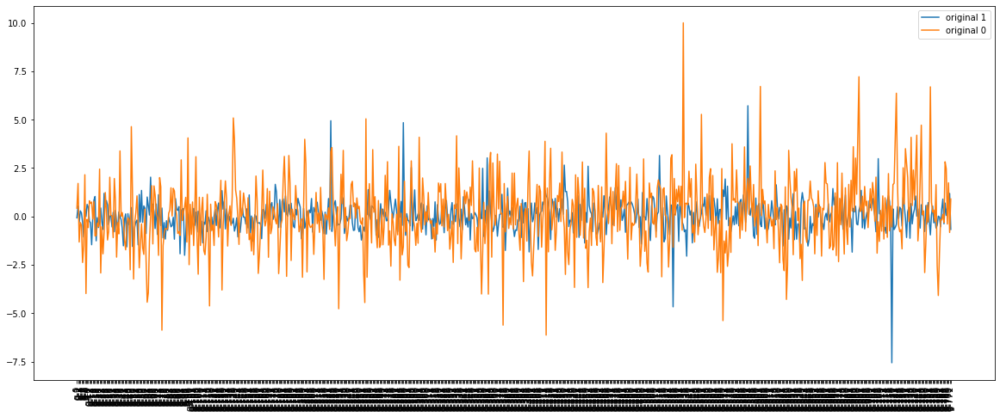

In [120]:
# not similar even in the same group
plt.figure(figsize=(20,8))
plt.plot(cons0.iloc[5][g_feats], label="original 1")
plt.plot(cons0.iloc[4][g_feats], label="original 0")
plt.xticks(rotation='vertical')
plt.legend(loc="best")

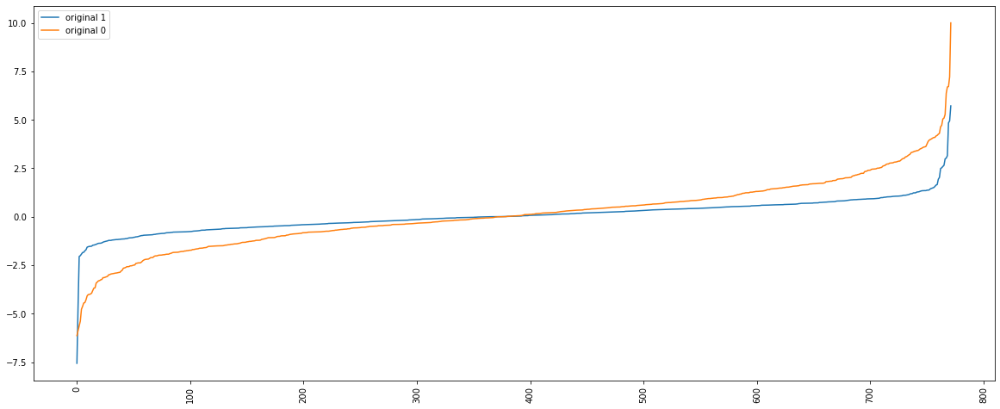

In [121]:
# sort of g_feats
plt.figure(figsize=(20,8))
plt.plot(sorted(cons0.iloc[5][g_feats]), label="original 1")
plt.plot(sorted(cons0.iloc[4][g_feats]), label="original 0")
plt.xticks(rotation='vertical')
plt.legend(loc="best")

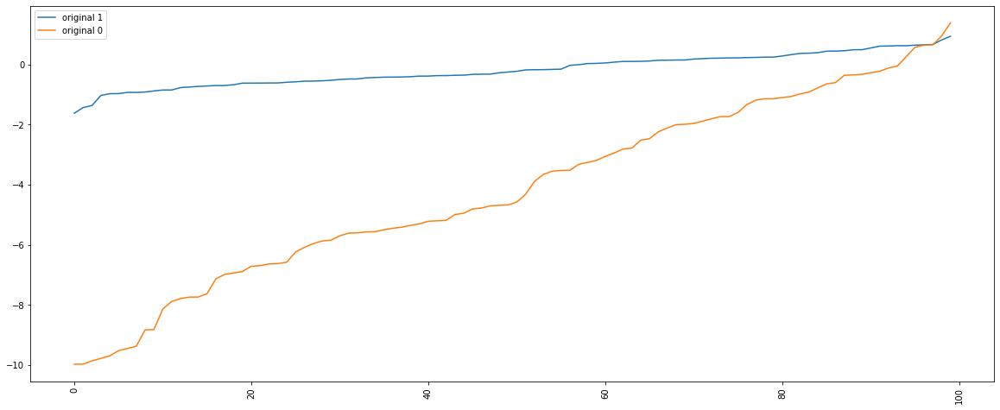

In [122]:
# sort of g_feats
plt.figure(figsize=(20,8))
plt.plot(sorted(cons0.iloc[5][c_feats]), label="original 1")
plt.plot(sorted(cons0.iloc[4][c_feats]), label="original 0")
plt.xticks(rotation='vertical')
plt.legend(loc="best")

## different group

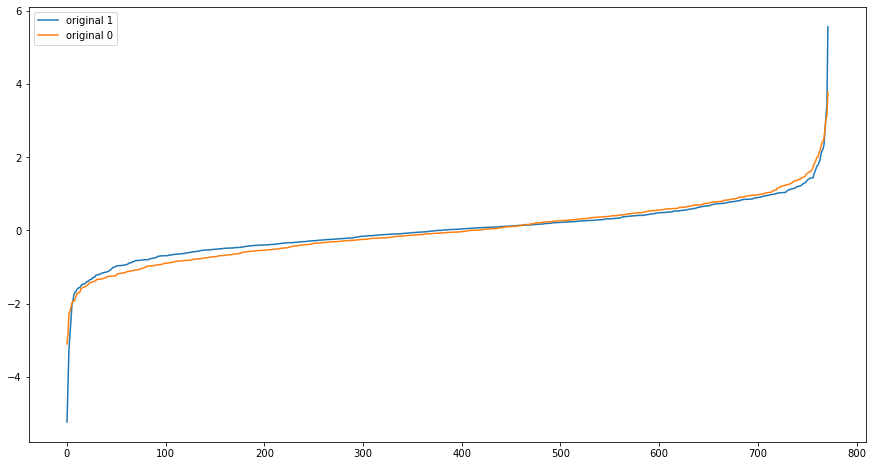

In [123]:
# compare patients with the same cp_time, cp_dose and MOA0 
plt.figure(figsize=(15,8))
plt.plot(sorted(cons0.iloc[0][g_feats]), label="original 1")
plt.plot(sorted(non0.iloc[5][g_feats]), label="original 0")
plt.legend(loc="best")

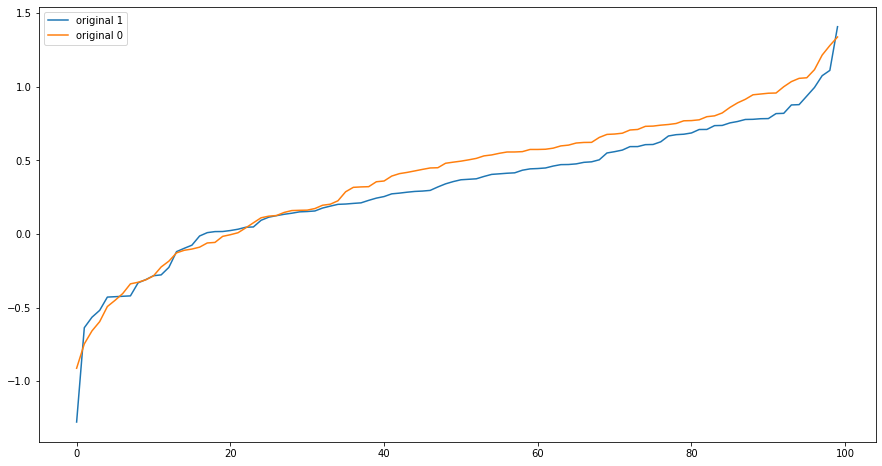

In [124]:
# compare patients with the same cp_time, cp_dose and MOA0 
plt.figure(figsize=(15,8))
plt.plot(sorted(cons0.iloc[0][c_feats]), label="original 1")
plt.plot(sorted(non0.iloc[5][c_feats]), label="original 0")
plt.legend(loc="best")

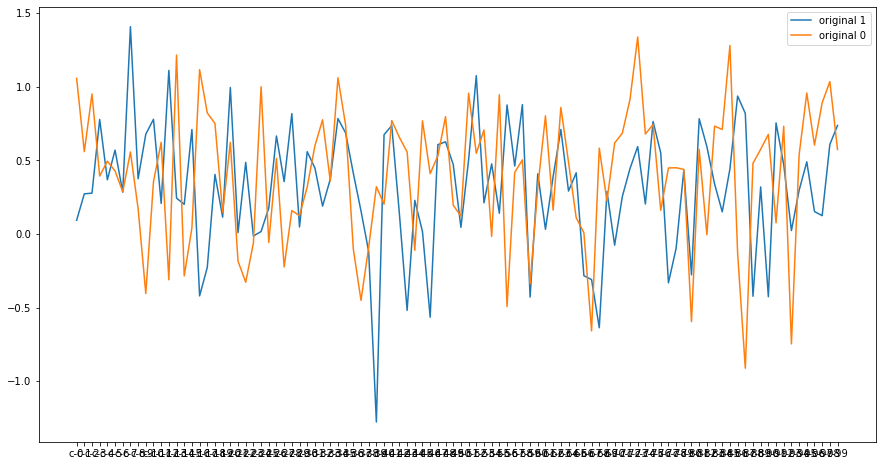

In [125]:
# compare patients with the same cp_time, cp_dose and MOA0 
plt.figure(figsize=(15,8))
plt.plot(cons0.iloc[0][c_feats], label="original 1")
plt.plot(non0.iloc[5][c_feats], label="original 0")
plt.legend(loc="best")

In [126]:
cons1 = train_cons[train_cons.target_sum==1].copy().reset_index(drop=True)

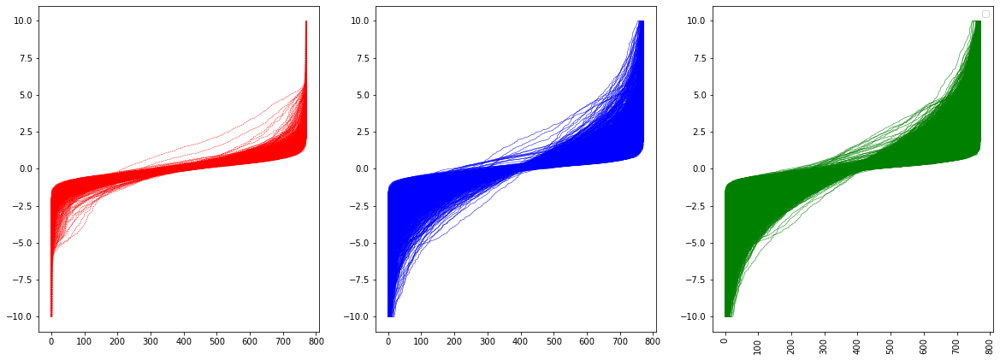

In [127]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
for i in range(non0.shape[0]):
    plt.plot(sorted(non0.iloc[i][g_feats]), color = "red", linestyle='dashed', linewidth=0.5)
plt.subplot(1,3,2)    
for i in range(cons0.shape[0]):
    plt.plot(sorted(cons0.iloc[i][g_feats]), color = "blue", linewidth=0.5)
plt.subplot(1,3,3)    
for i in range(cons1.shape[0]):
    plt.plot(sorted(cons1.iloc[i][g_feats]), color = "green", linewidth=0.5)
plt.xticks(rotation='vertical')
plt.legend(loc="best")

Text(0.5, 1.0, '12532')

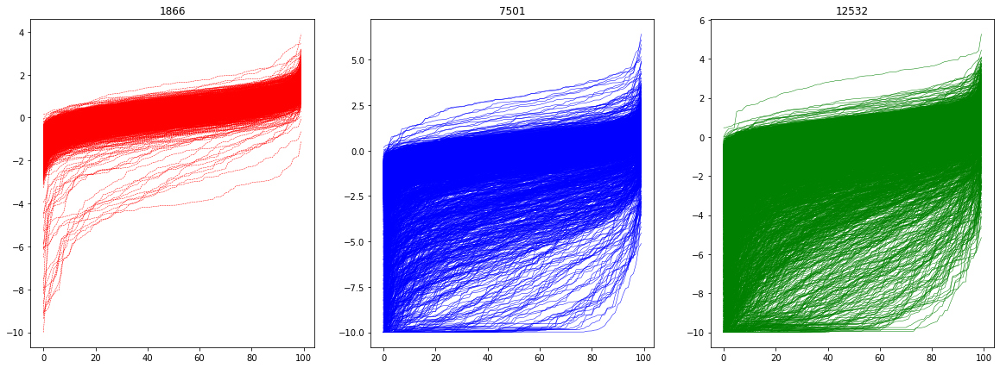

In [128]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
for i in range(non0.shape[0]):
    plt.plot(sorted(non0.iloc[i][c_feats]), color = "red", linestyle='dashed', linewidth=0.5)
plt.title(non0.shape[0])
plt.subplot(1,3,2)    
for i in range(cons0.shape[0]):
    plt.plot(sorted(cons0.iloc[i][c_feats]), color = "blue", linewidth=0.5)
plt.title(cons0.shape[0])
plt.subplot(1,3,3)    
for i in range(cons1.shape[0]):
    plt.plot(sorted(cons1.iloc[i][c_feats]), color = "green", linewidth=0.5)
plt.title(cons1.shape[0])

In [129]:
cons2 = train_cons[train_cons.target_sum==2].copy().reset_index(drop=True)
cons3 = train_cons[train_cons.target_sum==3].copy().reset_index(drop=True)
cons4 = train_cons[train_cons.target_sum==4].copy().reset_index(drop=True)

Text(0.5, 1.0, '55')

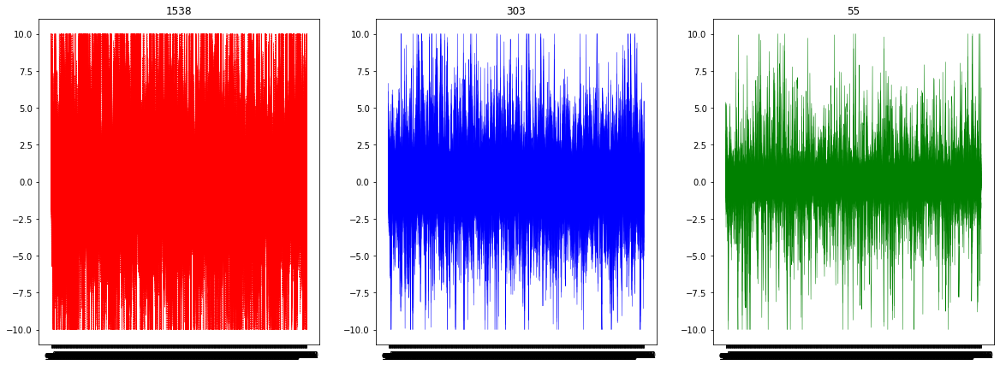

In [130]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
for i in range(cons2.shape[0]):
    plt.plot(cons2.iloc[i][g_feats], color = "red", linestyle='dashed', linewidth=0.5)
plt.title(cons2.shape[0])
plt.subplot(1,3,2)    
for i in range(cons3.shape[0]):
    plt.plot(cons3.iloc[i][g_feats], color = "blue", linewidth=0.5)
plt.title(cons3.shape[0])
plt.subplot(1,3,3)    
for i in range(cons4.shape[0]):
    plt.plot(cons4.iloc[i][g_feats], color = "green", linewidth=0.5)
plt.title(cons4.shape[0])

Text(0.5, 1.0, '55')

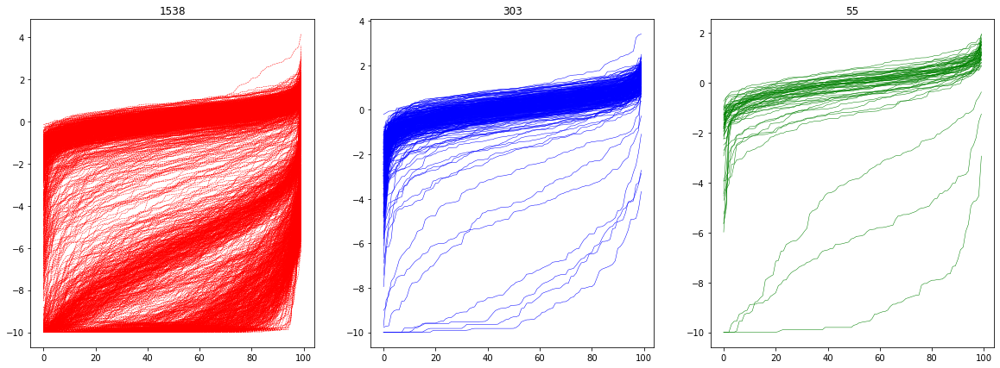

In [131]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
for i in range(cons2.shape[0]):
    plt.plot(sorted(cons2.iloc[i][c_feats]), color = "red", linestyle='dashed', linewidth=0.5)
plt.title(cons2.shape[0])
plt.subplot(1,3,2)    
for i in range(cons3.shape[0]):
    plt.plot(sorted(cons3.iloc[i][c_feats]), color = "blue", linewidth=0.5)
plt.title(cons3.shape[0])
plt.subplot(1,3,3)    
for i in range(cons4.shape[0]):
    plt.plot(sorted(cons4.iloc[i][c_feats]), color = "green", linewidth=0.5)
plt.title(cons4.shape[0])

# correlation between train_score and train_nonscore

In [132]:
nonscore_targets = [i for i in train_nonscore.columns if i != "sig_id"]
all_scores = pd.merge(train_score, train_nonscore, on="sig_id", how="outer")
print(all_scores.shape)

(23814, 611)


In [133]:
all_scores.head()

,sig_id,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhib

In [134]:
from scipy.stats import chi2_contingency

for ind, i in enumerate(difficult_var):
    for j in nonscore_targets:
        obs = pd.crosstab(all_scores[j], all_scores[i]).values
        if chi2_contingency(obs)[1] < 10**(-10):
            print(ind, i,j,chi2_contingency(obs)[1])
            print(obs)

1 acetylcholine_receptor_antagonist nonscore_sum 1.094392068693679e-13
[[18923   301]
 [ 4282     0]
 [  247     0]
 [   36     0]
 [   13     0]
 [    6     0]
 [    6     0]]
2 adrenergic_receptor_agonist neurotransmitter 1.9479725735473085e-97
[[23544   264]
 [    0     6]]
3 adrenergic_receptor_antagonist prolactin_inhibitor 2.467894439684321e-87
[[23454   353]
 [    0     7]]
3 adrenergic_receptor_antagonist nonscore_sum 3.0720744134740236e-13
[[18871   353]
 [ 4275     7]
 [  247     0]
 [   36     0]
 [   13     0]
 [    6     0]
 [    6     0]]
4 bacterial_cell_wall_synthesis_inhibitor lanosterol_demethylase_inhibitor 3.688266995850451e-68
[[23616   186]
 [    6     6]]
4 bacterial_cell_wall_synthesis_inhibitor sterol_demethylase_inhibitor 8.422441812216135e-11
[[23556   186]
 [   66     6]]
5 calcium_channel_blocker mitochondrial_na+_ca2+_exchanger_antagonist 1.2000767560895011e-93
[[23533   275]
 [    0     6]]
5 calcium_channel_blocker sodium_calcium_exchange_inhibitor 1.200

# can we predict sum of moa?

In [135]:
from sklearn import preprocessing
categoricals = ["cp_type", "cp_dose"]

def encoding(tr, te):
    for f in categoricals:
        lbl = preprocessing.LabelEncoder()
        lbl.fit(list(tr[f]))
        tr[f] = lbl.transform(list(tr[f]))
        te[f] = lbl.transform(list(te[f])) 
        
    return tr, te

train_feat, test_feat = encoding(train_feat, test_feat)

In [136]:
from sklearn.metrics import mean_squared_error
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
def modelling_lgb(new_train, target_train, new_test, target):
    
    X_train = new_train.copy() #.drop("sig_id", axis=1)

    y_train = target_train[target].copy()
    
    params = {'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'tree_learner': 'serial', 'learning_rate': 0.01, 
               "num_leaves": 10, 'random_seed':44, 'max_depth': 4} 
        
    n_folds=4
    skf=StratifiedKFold(n_splits = n_folds, shuffle=True, random_state=0)
    
    valid = np.zeros([X_train.shape[0]])
    for i , (train_index, test_index) in enumerate(skf.split(X_train, y_train)):
        X_train2 = X_train.iloc[train_index,:]
        y_train2 = y_train.iloc[train_index]

        X_valid2 = X_train.iloc[test_index,:]
        y_valid2 = y_train.iloc[test_index]
        
        lgb_train = lgb.Dataset(X_train2, y_train2)
        lgb_eval = lgb.Dataset(X_valid2, y_valid2, reference=lgb_train)
        
        clf = lgb.train(params, lgb_train,valid_sets=[lgb_train, lgb_eval], 
               num_boost_round=10000,early_stopping_rounds=50,verbose_eval = 100) 

        valid_predict = clf.predict(X_valid2, num_iteration = clf.best_iteration)
        valid[test_index] = valid_predict
            
    score = mean_squared_error(y_train, valid)
    print(score)
            
    return valid

valid = modelling_lgb(train_feat, train_score, test_feat, "score_sum")

ValueError: DataFrame.dtypes for data must be int, float or bool.
Did not expect the data types in the following fields: sig_id

In [137]:
import optuna

def optuna_check(new_train, target_train, target, params):
    
    X_train = new_train.copy() #.drop(['sig_id'],axis=1).copy()
    y_train = target_train[target].copy()
        
    n_folds=4
    skf=StratifiedKFold(n_splits = n_folds, shuffle=True, random_state=0)

    valid = np.zeros([X_train.shape[0]])
    for i , (train_index, test_index) in enumerate(skf.split(X_train, y_train)):
        print("Fold "+str(i+1))
        X_train2 = X_train.iloc[train_index,:]
        y_train2 = y_train.iloc[train_index]

        X_valid2 = X_train.iloc[test_index,:]
        y_valid2 = y_train.iloc[test_index]
        
        lgb_train = lgb.Dataset(X_train2, y_train2)
        lgb_eval = lgb.Dataset(X_valid2, y_valid2, reference=lgb_train)
        
        clf = lgb.train(params, lgb_train,valid_sets=[lgb_train, lgb_eval], 
               num_boost_round=10000,early_stopping_rounds=50,verbose_eval = 1000) 

        valid_predict = clf.predict(X_valid2, num_iteration = clf.best_iteration)
        valid[test_index] = valid_predict

    score = mean_squared_error(y_train, valid)
            
    return score


def objective(trial):
    
    params = {
        'objective': 'regression',
        'metric': 'rmse',
        'boosting_type': 'gbdt',
        'boost_from_average': True,
        'num_threads': 4,
        'random_state': 42,
        'learning_rate': 0.01,
        
        'num_leaves': trial.suggest_int('num_leaves', 10, 50),
        #'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 10, 200),
        #'min_child_weight': trial.suggest_loguniform('min_child_weight', 0.001, 0.1),
        'max_depth': trial.suggest_int('max_depth', 1, 5),
        #'bagging_fraction': trial.suggest_loguniform('bagging_fraction', .5, .99),
        #'feature_fraction': trial.suggest_loguniform('feature_fraction', .5, .99),
        #'lambda_l1': trial.suggest_loguniform('lambda_l1', 0.1, 2),
        #'lambda_l2': trial.suggest_loguniform('lambda_l2', 0.1, 2)
    }
    
    score = optuna_check(train_feat, train_score, "score_sum", params)
    
    return score

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

Fold 1


[W 2020-10-03 02:44:33,712] Trial 0 failed because of the following error: ValueError('DataFrame.dtypes for data must be int, float or bool.\nDid not expect the data types in the following fields: sig_id')
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/optuna/study.py", line 709, in _run_trial
    result = func(trial)
  File "<ipython-input-137-dd179aa4ec42>", line 55, in objective
    score = optuna_check(train_feat, train_score, "score_sum", params)
  File "<ipython-input-137-dd179aa4ec42>", line 24, in optuna_check
    num_boost_round=10000,early_stopping_rounds=50,verbose_eval = 1000)
  File "/opt/conda/lib/python3.7/site-packages/lightgbm/engine.py", line 228, in train
    booster = Booster(params=params, train_set=train_set)
  File "/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py", line 1714, in __init__
    train_set.construct().handle,
  File "/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py", line 1085, in construct
    categ

ValueError: DataFrame.dtypes for data must be int, float or bool.
Did not expect the data types in the following fields: sig_id

# summary

- clear correlation in some g-variables, but may be influenced by 10 or -10 values and others have no correlations
- almost all g variables have normal distribution with one peak, but some have second peak and sharp peak
- clear correlation in all c-variables, but may be influenced by minimum value of -10
- clear correlation in target-variables
- even after removing control pertubations data, correlations of g-variables, c-variables and target-variables remain
- only 0.3% of labels become 1 in the training data, so the data are skewed
- almost all exmaples have 0 or 1 positive labels
- some explanatory variables significantly effect target variables
- train_features.csv and train_targets_scored.csv can be connected via sig_id without data loss
- small difference in cp variables between training and test
- small difference in g variables between training and test
- small difference in c variables between training and test
- distribution of all c variables per person look simpler than cases in g-variables. values of g-variables may be clipped if they are larger than 10?
- correlations between c variables and g varibles are also high. 
- some patients have many identical values in g-variable and except an example with 392 unique values, others have at least 681 unique values.
- many identical values in g-variables mean that the exmaple include multiple values of -10 or 10.
- some patients have many identical values in c-variable and the identical values are -10 and they are all negative values.
- labels in auxiliary training data are also unbalanced.
- no missing values in the data
- in terms of interactions in cp variables, there's no significant characteristics.
- traingin data clearly include one outlier in terms of g unique values
- in terms of unique values, no differece between train and test
- In predictions of 2 targets, cross validation can't be utilized. (erbb2_inhibitor, atp-sensitive_potassium_channel_antagonist)
- only one variable explains most variance in terms of c variables
- suffix of target features was visualized. inihibitor is the most frequently used variable.
- difficult targets have at least 100 positive cases.
- examples with little g10_num or g_10_num become positive in difficult variable
- g and c variables groupby cp_time and cp_dose in control group could be calculated and can be applied to data for feature engineering.
- some nonscore target variables can be utilized to predict difficult target variables
- lines without medicine seem to be included in those with medicine? → not necessarily
- weak negative correlation between score targets and nonscore targets